It is a case study of fictional hotel company. You task is to:  
  
* Help the marketing team gain a better understanding of business performance
* Provide a data-driven recommendation on where the marketing team should focus in order to increase revenues
* Build a model to predict booking cancellations. Include the model performance metrics in the presentation

Business performance can be measured off the following:

* Minimal cancellations (including previous cancellations)  
* Balance between weekend and weekday stays (unless the rate is different)
* High repeat customers
* Low not previously cancelled bookings
* Reserved room is the same or worse than the allocated room
* Minimal booking changes
* Agent compared to private bookings
* Low days in waiting
* High ADR value


In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import calendar
from dateutil.relativedelta import relativedelta
from datetime import timedelta

import re

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder

from sklearn.dummy import DummyClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import ExtraTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import BernoulliNB
from catboost import CatBoostClassifier

from tqdm import tqdm
import time
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.model_selection import cross_val_score

import mlflow
from mlflow.models.signature import infer_signature
from hyperopt import fmin, hp, tpe, Trials, space_eval, STATUS_OK
from hyperopt.pyll.base import scope
import lightgbm as lgb
import xgboost as xgb

In [2]:
sns.reset_defaults()

### Functions

In [3]:
###############################
### Convert date to numeric ###
###############################

def month_string_to_number(string):
    m = {
        'jan': 1,
        'feb': 2,
        'mar': 3,
        'apr':4,
         'may':5,
         'jun':6,
         'jul':7,
         'aug':8,
         'sep':9,
         'oct':10,
         'nov':11,
         'dec':12
        }
    s = string.strip()[:3].lower()

    try:
        out = m[s]
        return out
    except:
        raise ValueError('Not a month')

In [4]:
########################################################
### Line plots of revenue by country, hotel and year ###
########################################################

def country_lp(country_n):
    gbr_ch = data[(data.country == country_n) & (data.hotel == 'City Hotel') & (data.reservation_status == 'Check-Out')]
    gbr_rh = data[(data.country == country_n) & (data.hotel == 'Resort Hotel') & (data.reservation_status == 'Check-Out')]

    gbr_ch_my = gbr_ch.groupby(['arrival_date_year','arrival_date_week_number'])['revenue'].sum()
    gbr_ch_my = gbr_ch_my.reset_index()
    gbr_rh_my = gbr_rh.groupby(['arrival_date_year','arrival_date_week_number'])['revenue'].sum()
    gbr_rh_my = gbr_rh_my.reset_index()

    gbr = pd.merge(gbr_ch_my, gbr_rh_my, on = ['arrival_date_year','arrival_date_week_number'], how = 'inner')
    gbr.columns = ['arrival_date_year','arrival_date_week_number','revenue_ch','revenue_rh']

    plt.figure(figsize=(10,6))
    plt.subplot(1, 2, 1)

    sns.lineplot(data=gbr, x="arrival_date_week_number", y="revenue_ch", palette=['r', 'g', 'b'], hue="arrival_date_year",legend=None)
    plt.title("Plot of revenue over time for " + str(country_n) + " City hotels by year", loc='left', fontsize=10, fontweight=0, color='black')
    plt.xlabel("Week number")
    plt.ylabel("Revenue")
    plt.legend()
    
    plt.subplot(1, 2, 2)
    sns.lineplot(data=gbr, x="arrival_date_week_number", y="revenue_rh", palette=['r', 'g', 'b'], hue="arrival_date_year")
    plt.title("Plot of revenue over time for " + str(country_n) + " Resort hotels by year", loc='left', fontsize=10, fontweight=0, color='black')
    plt.xlabel("Week number")
    plt.ylabel(" ")
    plt.legend(bbox_to_anchor=(1.5, 1.05))
    plt.show()

In [5]:
########################################################
### Line plots of occupancy for different rooms year ###
########################################################

def plot_occ(room):
    occ_df_ch = occ_df[(occ_df.hotel == 'City Hotel') & (occ_df.room == room)]

    occ_df_rh = occ_df[(occ_df.hotel == 'Resort Hotel') & (occ_df.room == room)]

    plt.figure(figsize=(10,6))
    plt.subplot(1, 2, 1)

    sns.lineplot(data=occ_df_rh, x="arrival_date", y="Count")
    plt.title("Plot of " + str(room) + "room type reservations for Resort Hotels", loc='left', fontsize=10, fontweight=0, color='black')
    plt.xlabel("Reservation date")
    plt.legend(bbox_to_anchor=(1.4, 1.05))
    plt.xticks(rotation=45)

    plt.subplot(1, 2, 2)

    sns.lineplot(data=occ_df_ch, x="arrival_date", y="Count")
    plt.title("Plot of " + str(room) + "room type reservations for City Hotels", loc='left', fontsize=10, fontweight=0, color='black')
    plt.xlabel("Reservation date")
    plt.xticks(rotation=45)
    plt.ylabel("Count")
    plt.show();

In [6]:
####################################################
### Convert date to more informative information ###
####################################################

def add_datepart(df, fldname, drop=True, time=False):
    "Helper function that adds columns relevant to a date."
    fld = df[fldname]
    fld_dtype = fld.dtype
    if isinstance(fld_dtype, pd.core.dtypes.dtypes.DatetimeTZDtype):
        fld_dtype = np.datetime64

    if not np.issubdtype(fld_dtype, np.datetime64):
        df[fldname] = fld = pd.to_datetime(fld, infer_datetime_format=True)
    targ_pre = re.sub('[Dd]ate$', '', fldname)
    attr = ['Year', 'Month', 'Week', 'Day', 'Dayofweek', 'Dayofyear',
            'Is_month_end', 'Is_month_start', 'Is_quarter_end', 'Is_quarter_start', 'Is_year_end', 'Is_year_start']
    if time: attr = attr + ['Hour', 'Minute', 'Second']
    for n in attr: df[targ_pre + n] = getattr(fld.dt, n.lower())
    df[targ_pre + 'Elapsed'] = fld.astype(np.int64) // 10 ** 9
    if drop: df.drop(fldname, axis=1, inplace=True)

################################        
### Process time series data ###
################################

def train_dset(dset):
    time_data_ph = dset.drop(['hotel','room','arrival_Elapsed'],axis = 1)
    time_data_ph.arrival_date = time_data_ph.arrival_date.astype('datetime64[ns]')
    time_data_ph.rename(columns = {'Count':'y', 'arrival_date':'ds'}, inplace = True)

    time_data_ph = time_data_ph.sort_values('ds')
    time_data_ph['y'] = time_data_ph['y'].astype(int)
    time_data_ph['ds'] = pd.to_datetime(time_data_ph['ds'], format='%Y-%m-%d')
    time_data_ph = time_data_ph.reset_index(drop=True)
    time_data_ph.columns = ['ds', 'y', 'Year', 'Month', 'Week',
       'Day', 'Dayofweek', 'Dayofyear',
       'Is_month_end', 'Is_month_start',
       'Is_quarter_end', 'Is_quarter_start',
       'Is_year_end', 'Is_year_start']

    for name in ['Is_month_end','Is_year_start','Is_month_end','Is_month_start','Is_month_end','Is_quarter_start','Is_year_end','Is_quarter_end']:
        time_data_ph[name] = time_data_ph[name].astype(int)
    return time_data_ph

In [7]:
def datavalas(byvar):
    ms_data = data[((data.reservation_status == 'Check-Out') | (data.deposit_type == 'Non Refund'))]
    ms_data_a = ms_data.groupby(['hotel','arrival_date_year',byvar])['revenue'].sum()
    ms_data_a = ms_data_a.reset_index()
    ms_data_a = ms_data_a.sort_values(by = ['hotel',byvar,'arrival_date_year'])
    ms_data_a = ms_data_a.reset_index(drop=True)
    return ms_data_a

In [8]:
#######################
### Model framework ###
#######################

def cap_floor(train_dset, test_dset, name, initial, period, horizon):
    
    train_dset['cap'] = max(int(max(train_dset.y) * 1.1),int(max(test_dset.y) * 1.1))
    train_dset['floor'] = 0
    test_dset['cap'] = train_dset['cap']
    test_dset['floor'] = 0
    #return train_df, test_dset

    ### Baseline model ###

    m = Prophet()
    m.fit(train_dset)

    ### Strict model ###

    m_strict = Prophet(changepoint_prior_scale=0.01,
                       weekly_seasonality=True, 
                       daily_seasonality=False, 
                       yearly_seasonality=True,
                       seasonality_mode = 'additive')
    m_strict.fit(train_dset)

    ### Flexible model ###

    m_flex = Prophet(changepoint_prior_scale=0.5)
    m_flex.fit(train_dset)

    ### Regressors ###

    m_reg = Prophet(changepoint_prior_scale=0.01) 
    m_reg.add_regressor('Is_month_end')
    m_reg.add_regressor('Year')
    m_reg.add_regressor('Month')
    m_reg.add_regressor('Week')
    m_reg.add_regressor('Dayofweek')
    m_reg.add_regressor('Dayofyear')
    m_reg.add_regressor('Is_month_start')
    m_reg.add_regressor('Is_quarter_end')
    m_reg.add_regressor('Is_quarter_start')
    m_reg.add_regressor('Is_year_end')
    m_reg.add_regressor('Is_year_start')
    m_reg.fit(train_dset)

    
    df_all = pd.DataFrame()

    y_train = train_dset.y
    y_test = test_dset.y
    y_test.index = y_test.index + max(y_train.index)
    print(y_train.shape[0], y_test.shape[0])
    
    df_cv, df_p, forecast, prop_test = mod_diag(m, 'Baseline model', test_dset, y_train, y_test, name, initial, period, horizon)
    df_p['Model'] = 'Baseline'
    df_all = pd.concat([df_all,df_p], axis = 0).reset_index(drop=True)
    print(df_all.shape)
    
    df_cv, df_p, forecast, prop_test = mod_diag(m_strict, 'Strict model', test_dset, y_train, y_test, name, initial, period, horizon)
    df_p['Model'] = 'Strict'
    df_all = pd.concat([df_all,df_p], axis = 0).reset_index(drop=True)
    print(df_all.shape)
    
    df_cv, df_p, forecast, prop_test = mod_diag(m_flex, 'Flexible model', test_dset, y_train, y_test, name, initial, period, horizon)
    df_p['Model'] = 'Flexible'
    df_all = pd.concat([df_all,df_p], axis = 0).reset_index(drop=True)
    print(df_all.shape)
    
    df_cv, df_p, forecast, prop_test = mod_diag(m_reg, 'Regressor model', test_dset, y_train, y_test, name, initial, period, horizon)
    df_p['Model'] = 'Regressor'
    df_all = pd.concat([df_all,df_p], axis = 0).reset_index(drop=True)
    print(df_all.shape)
    
    df_all['days'] = df_all['horizon'].astype('timedelta64[D]')
    df_all['days'] = df_all['days'].astype(int)

    f = plt.figure(figsize=(19, 15))
    ax = sns.lineplot(x="days", y="smape", hue="Model", markers=True, data=df_all)
    ax.set(xlabel='Date', ylabel='SMAPE')
    plt.show();
    
    return df_all

def mod_diag(model, mod_name, test_df, y_train, y_test, name, initial, period, horizon):
    f = plt.figure(figsize=(19, 15))
    plot_series(y_train, y_test, labels=["y_train", "y_test"], title = f'{name} Train-test plot');
    
    df_cv, df_p, forecast, prop_test = cv_exam(model, test_df, y_test, initial, period, horizon)
    fig = model.plot(forecast)
    a = add_changepoints_to_plot(fig.gca(), model, forecast)
    mape_ph = mean_absolute_percentage_error(prop_test['y'], prop_test['yhat'], symmetric=True)
    mse_ph = mean_squared_error(prop_test['y'], prop_test['yhat'], squared=False)
    print(f"The Smape loss value for {name} and {mod_name} model is {mape_ph:.6f}")
    print(f"The RMSE loss value for {name} and {mod_name} model is {mse_ph:.6f}")

    plot_series(prop_test['yhat'], y_test, labels=["y_pred","y_test"], title = f'{name} {mod_name} Test predict-actuals plot')
    plt.show();
    
    fig = model.plot_components(forecast)
    f = plt.figure(figsize=(19, 15))
    ax = sns.lineplot(x="ds", y="residual", markers=True, data=df_cv)
    ax.set(xlabel='Dates', ylabel='Residuals')
    plt.show();
    return df_cv, df_p, forecast, prop_test

def cv_exam(model, test_df, y_test, initial, period, horizon):
    
    forecast = model.predict(test_df)
    df_cv = cross_validation(model, initial = initial, period = period, horizon = horizon)
    df_p = performance_metrics(df_cv)
    df_cv['residual'] = df_cv['y'] - df_cv['yhat']
    prop_test = pd.merge(test_df,forecast[['yhat','ds']],on=['ds'],how='inner')
    prop_test.index = y_test.index
    
    return df_cv, df_p, forecast, prop_test

In [9]:
''' Results dataset '''

def perf_vals(dset, meas = 'smape'):
    rmse_add = dset.groupby(['Model'])[meas].mean()
    rmse_add = pd.DataFrame(rmse_add)
    a = rmse_add.sort_values(by = [meas])
    
    rmse_add = rmse_add.reset_index()
    model = rmse_add[rmse_add[meas] == min(rmse_add[meas])]
    print(f"The best model is the {model['Model'].values[0]} model")

    return a

def res_data(dset,meas,name,res_dset):
    try:
        baby = perf_vals(dset,meas)        
        baby[str(name + ' Model')] = baby.index
        baby.rename(columns = {meas : str(name) + ' ' + str(meas.capitalize())}, inplace = True)
        baby = baby.reset_index(drop=True)
        res_dset = pd.concat([res_dset,baby], axis = 1)
        res_dset = res_dset.reset_index(drop=True)
        return res_dset
    except:
        print('No ' + name + ' data')

Cancellation prediction

In [10]:
########################
### Confusion matrix ###
########################

def cm2df(cm, labels):
            df = pd.DataFrame()

            for i, row_label in enumerate(labels):
                rowdata={}
        
                for j, col_label in enumerate(labels): 
                    rowdata[col_label]=cm[i,j]
                df = df.append(pd.DataFrame.from_dict({row_label:rowdata}, orient='index'))
            return df[labels]

In [50]:
##############################
### Min-Max transformation ###
##############################

def minmax_dset(dset,numeric_columns):

    dseta = dset.copy()
    dsetb = pd.DataFrame(transformer_train.transform(dseta[numeric_columns]))
    dsetb.columns = numeric_columns
    print(dsetb.shape)
    return dsetb

########################
### One hot encoding ###
########################

def ohe_dset(dset,categorical_columns):

    dseta = dset.copy()
    transformed_dset = ohe.fit_transform(dseta[categorical_columns])
    cat_data = pd.DataFrame(transformed_dset.toarray())
    cat_data.columns = ohe.get_feature_names_out(input_features=dseta[categorical_columns].columns)
    print(cat_data.shape)
    return cat_data

#######################
### Model selection ###
#######################

def select_model(X, y, pipeline=None):
    """Test a range of classifiers and return their performance metrics on training data.

    Args:
        X (object): Pandas dataframe containing X_train data.
        y (object): Pandas dataframe containing y_train data.
        pipeline (object): Pipeline from get_pipeline().

    Return:
        df (object): Pandas dataframe containing model performance data.
    """

    classifiers = {}
    classifiers.update({"DummyClassifier": DummyClassifier(strategy='most_frequent')})
    classifiers.update({"RandomForestClassifier": RandomForestClassifier(n_estimators=1000, max_depth=3, n_jobs=5)})
    classifiers.update({"DecisionTreeClassifier": DecisionTreeClassifier()})
    classifiers.update({"ExtraTreeClassifier": ExtraTreeClassifier()})
    classifiers.update({"ExtraTreesClassifier": ExtraTreeClassifier()})
    classifiers.update({"AdaBoostClassifier": AdaBoostClassifier()})
    classifiers.update({"KNeighborsClassifier": KNeighborsClassifier()})
    classifiers.update({"RidgeClassifier": RidgeClassifier()})
    classifiers.update({"SGDClassifier": SGDClassifier()})
    classifiers.update({"BernoulliNB": BernoulliNB()})
    classifiers.update({"CatBoostClassifier":CatBoostClassifier(silent=True)})

    # Stacking
    models = []

    # models = []
    # models.append(('XGBClassifier', XGBClassifier(use_label_encoder=False, eval_metric='logloss', objective='binary:logistic')))
    # models.append(('CatBoostClassifier', CatBoostClassifier(silent=True)))

    # classifiers.update({"VotingClassifier (XGBClassifier, CatBoostClassifier)": VotingClassifier(models)})

    # models = []
    # models.append(('XGBClassifier', XGBClassifier(use_label_encoder=False, eval_metric='logloss', objective='binary:logistic')))
    # models.append(('LGBMClassifier', LGBMClassifier()))
    # models.append(('CatBoostClassifier', CatBoostClassifier(silent=True)))
    # classifiers.update({"VotingClassifier (XGBClassifier, LGBMClassifier, CatBoostClassifier)": VotingClassifier(models)})

    # models = []
    # models.append(('XGBClassifier', XGBClassifier(use_label_encoder=False, eval_metric='logloss', objective='binary:logistic')))
    # models.append(('RandomForestClassifier', RandomForestClassifier()))
    # models.append(('DecisionTreeClassifier', DecisionTreeClassifier()))
    # classifiers.update({"VotingClassifier (XGBClassifier, RandomForestClassifier, DecisionTreeClassifier)": VotingClassifier(models)})

    # models = []
    # models.append(('XGBClassifier', XGBClassifier(use_label_encoder=False, eval_metric='logloss', objective='binary:logistic')))
    # models.append(('AdaBoostClassifier', AdaBoostClassifier()))
    # models.append(('ExtraTreeClassifier', ExtraTreeClassifier()))
    # classifiers.update({"VotingClassifier (XGBClassifier, AdaBoostClassifier, ExtraTreeClassifier)": VotingClassifier(models)})

    # models = []
    # models.append(('XGBClassifier', XGBClassifier(use_label_encoder=False, eval_metric='logloss', objective='binary:logistic')))
    # models.append(('ExtraTreesClassifier', ExtraTreesClassifier()))
    # classifiers.update({"VotingClassifier (XGBClassifier, ExtraTreesClassifier)": VotingClassifier(models)})

    #scoring = {'f1_score' : make_scorer(f1_score, average='weighted')}

    df_models = pd.DataFrame(columns=['model', 'run_time', 'accuracy'])

    for key in tqdm(classifiers):
        start_time = time.time()
        pipeline = get_pipeline(X, classifiers[key])
        cv = cross_val_score(pipeline, X, y, cv=10, scoring = 'roc_auc')
        row = {'model': key,
               'run_time': format(round((time.time() - start_time)/60,2)),
               'accuracy': cv.mean(),
        }
        row_df = pd.DataFrame(row, index=[0])

        df_models = pd.concat([df_models,
                                   row_df],
                                  axis=0,
                                  ignore_index=True)

        df_models = df_models.sort_values(by='accuracy', ascending=False)
    return df_models

####################################
### Pipeline for Baseline models ###
####################################

def get_pipeline(X, model):
    """
    Return a pipeline to preprocess data and bundle with a model.

    Args:
        X (object): X_train data.
        model (object): scikit-learn model object, i.e. XGBClassifier

    Returns:
        Pipeline (object): Pipeline steps.
    """

    numeric_columns = list(X.select_dtypes(exclude=['object']).columns.values.tolist())
    categorical_columns = list(X.select_dtypes(include=['object']).columns.values.tolist())
    numeric_pipeline = SimpleImputer(strategy='constant')
    categorical_pipeline = OneHotEncoder(handle_unknown='ignore')

    preprocessor = ColumnTransformer(
        transformers=[
            ('numeric', numeric_pipeline, numeric_columns),
            ('categorical', categorical_pipeline, categorical_columns),
            ], remainder='passthrough'
    )

    bundled_pipeline = imbpipeline(steps=[
        #('preprocessor', preprocessor),
        #('smote', SMOTE(random_state=1)),
        #('scaler', MaxAbsScaler()),
        ('model', model)
    ])

    return bundled_pipeline

In [ ]:
def train_diag(classifier, xtrain, ytrain, splits, model):\n",
    mlflow.xgboost.autolog()\n",
    
    folds = StratifiedKFold(n_splits = splits,
                            shuffle=True,
                            random_state=31416)
    folds.get_n_splits(xtrain, ytrain)\n",
    
    results = pd.DataFrame(['ROC/AUC:','Accuracy:','F1 score:'],\n",
    "                           columns = ['Metrics'])\n",
    "\n",
    "    pr_data_all = pd.DataFrame(columns = ['Precision','Recall','Folds'])\n",
    "    \n",
    "    threshold_lst = []\n",
    "\n",
    "    for i, (train, test) in tqdm(enumerate(folds.split(xtrain, ytrain))):\n",
    "\n",
    "        classifier.fit(xtrain.iloc[train,:], ytrain[train])\n",
    "    \n",
    "        y_pred_p = classifier.predict_proba(xtrain.iloc[test,:])\n",
    "        y_pred_p1 = y_pred_p[:,1]\n",
    "        y_pred_hyp = classifier.predict(xtrain.iloc[test,:])\n",
    "    \n",
    "        metric = []\n",
    "        roc_auc_hyp = round(roc_auc_score(ytrain[test], y_pred_p1), 4)\n",
    "        metric.append(roc_auc_hyp)\n",
    "        accuracy_hyp = round(accuracy_score(ytrain[test], y_pred_hyp), 4)\n",
    "        metric.append(accuracy_hyp)\n",
    "        f1_score_hyp = round(metrics.f1_score(ytrain[test], y_pred_hyp), 4)\n",
    "        metric.append(f1_score_hyp)\n",
    "\n",
    "        print('ROC/AUC:', roc_auc_hyp)\n",
    "        print('Accuracy:', accuracy_hyp)\n",
    "        print('F1 score:', f1_score_hyp)\n",
    "        \n",
    "        o_threshold = 0.5\n",
    "        \n",
    "        if (roc_auc_hyp == 0.5) | (f1_score_hyp == 0):\n",
    "\n",
    "            fpr, tpr, thresholds = roc_curve(ytrain[test], y_pred_p1, drop_intermediate=False)\n",
    "            plt.scatter(thresholds, np.abs(fpr+tpr-1))\n",
    "            plt.xlabel(\"Threshold\")\n",
    "            plt.ylabel(\"|FPR + TPR - 1|\")\n",
    "            plt.xlim([0.0, 1.05])\n",
    "            plt.ylim([0.0, 1.05])\n",
    "            plt.show()\n",
    "\n",
    "            o_threshold = thresholds[np.argmin(np.abs(fpr+tpr-1))]\n",
    "            print('Threshold:', round(o_threshold, 4))\n",
    "            threshold_lst.append(o_threshold)\n",
    "\n",
    "            y_pred_o = (y_pred_p1 >= o_threshold)#[:,0]\n",
    "\n",
    "            from sklearn.metrics import confusion_matrix\n",
    "            confusion_matrix_o = confusion_matrix(ytrain[test], y_pred_o)\n",
    "            print(confusion_matrix_o)\n",
    "\n",
    "            roc_auc = roc_auc_score(ytrain[test], y_pred_o)\n",
    "            accuracy = accuracy_score(ytrain[test], y_pred_o)\n",
    "            f1_score = metrics.f1_score(ytrain[test], y_pred_o)\n",
    "\n",
    "            print('ROC/AUC threshold:', roc_auc)\n",
    "            print('Accuracy threshold:', accuracy)\n",
    "            print('F1 score threshold:', f1_score)\n",
    "            \n",
    "            print(classification_report(ytrain[test], y_pred_o))\n",
    "            \n",
    "        else:\n",
    "    \n",
    "            print(classification_report(ytrain[test], y_pred_hyp))\n",
    "        \n",
    "            from sklearn.metrics import confusion_matrix\n",
    "            cm = confusion_matrix(ytrain[test], y_pred_hyp)\n",
    "\n",
    "            cm_as_df = cm2df(cm,['Not purchase','Purchase'])\n",
    "\n",
    "            print(confusion_matrix(ytrain[test], y_pred_hyp))\n",
    "            \n",
    "            o_threshold = 0.5\n",
    "\n",
    "        results = pd.concat([results,\n",
    "                             pd.DataFrame(metric,\n",
    "                                          columns = ['Train_' + str(i)])],\n",
    "                            axis = 1)\n",
    "    \n",
    "    ###############################\n",
    "    ### Precision Recall curves ###\n",
    "    ###############################\n",
    "        \n",
    "        precision, recall, thresholds = precision_recall_curve(ytrain[test], y_pred_p1)\n",
    "\n",
    "    ### calculate F1 score ###\n",
    "\n",
    "        f1 = metrics.f1_score(ytrain[test], y_pred_hyp)\n",
    "\n",
    "    ### plot the precision-recall curves ###\n",
    "\n",
    "        no_skill = len(ytrain[test][ytrain[test] == 1]) / len(ytrain[test])\n",
    "\n",
    "        plt.plot([0, 1],\n",
    "                 [no_skill, no_skill],\n",
    "                 linestyle='--',\n",
    "                 label='No skill')\n",
    "        plt.plot(recall,\n",
    "                 precision,\n",
    "                 marker='.',\n",
    "                 label = 'PR fold {}'.format(i))\n",
    "        plt.xlabel('Recall')\n",
    "        plt.ylabel('Precision')\n",
    "\n",
    "        plt.legend()\n",
    "        plt.show()\n",
    "    \n",
    "        pr_data = pd.concat([pd.DataFrame(precision),\n",
    "                             pd.DataFrame(recall)],axis = 1)\n",
    "        pr_data.columns = ['Precision','Recall']\n",
    "        pr_data = pr_data.reset_index(drop=True)\n",
    "        pr_data['Folds'] = i\n",
    "    \n",
    "        pr_data_all = pd.concat([pr_data_all, pr_data],axis = 0).reset_index(drop=True)\n",
    "\n",
    "    results['Model'] = model\n",
    "        \n",
    "    sns.lineplot(data = pr_data_all, x = \"Recall\", y = \"Precision\", palette = 'rainbow', hue = \"Folds\")\n",
    "    plt.legend(bbox_to_anchor = (1.3, 0.5), loc = \"lower right\", title = 'PR folds')\n",
    "    plt.show()\n",
    "    \n",
    "    fig, ax = plt.subplots()\n",
    "\n",
    "    tprs = []\n",
    "    aucs = []\n",
    "    mean_fpr = np.linspace(0, 1, 100)\n",
    "\n",
    "    for i, (train, test) in enumerate(folds.split(xtrain, ytrain)):\n",
    "\n",
    "        classifier.fit(xtrain.iloc[train,:], ytrain[train])\n",
    "    \n",
    "        viz = plot_roc_curve(classifier, xtrain.iloc[test,:], ytrain[test],\n",
    "                             name='ROC fold {}'.format(i),\n",
    "                             alpha=0.3, lw=1, ax=ax)\n",
    "        interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)\n",
    "        interp_tpr[0] = 0.0\n",
    "        tprs.append(interp_tpr)\n",
    "        aucs.append(viz.roc_auc)\n",
    "\n",
    "    ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)\n",
    "\n",
    "    mean_tpr = np.mean(tprs, axis=0)\n",
    "    mean_tpr[-1] = 1.0\n",
    "    mean_auc = auc(mean_fpr, mean_tpr)\n",
    "    std_auc = np.std(aucs)\n",
    "    ax.plot(mean_fpr, mean_tpr, color='b',\n",
    "            label=r'Mean ROC (AUC = %0.4f $\\pm$ %0.2f)' % (mean_auc, std_auc),\n",
    "            lw=2, alpha=.8)\n",
    "\n",
    "    std_tpr = np.std(tprs, axis=0)\n",
    "    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)\n",
    "    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)\n",
    "    ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,\n",
    "                    label=r'$\\pm$ 1 std. dev.')\n",
    "\n",
    "    ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],\n",
    "           title=\"Receiver operating characteristic example\")\n",
    "    ax.legend(bbox_to_anchor=(1.9, 0),loc=\"lower right\")\n",
    "    plt.show();    \n",
    "    \n",
    "    return results, o_threshold"

### Read in and explore the data

In [12]:
data = pd.read_csv('hotels.csv')
print(data.shape)


(119390, 32)


In [13]:
### Changes to the data ###

data['formatted_date'] = data.arrival_date_year*1000  + data.arrival_date_week_number* 10 - 0
data['weekdate'] = pd.to_datetime(data['formatted_date'], format='%Y%W%w')
data['weekdates'] = data['weekdate'] - timedelta(days=14)

data['a_month'] = data['arrival_date_month'].apply(month_string_to_number)
data['dateInt'] = data['arrival_date_year'].astype(str) + data['a_month'].astype(str).str.zfill(2) + data['arrival_date_day_of_month'].astype(str).str.zfill(2)
data['datemonth'] = data['arrival_date_year'].astype(str) + data['a_month'].astype(str).str.zfill(2) + str('01')
data['arrival_date'] = pd.to_datetime(data['dateInt'], format='%Y%m%d')
data['arrival_month'] = pd.to_datetime(data['datemonth'], format='%Y%m%d')
data = data.drop(['a_month','arrival_date_day_of_month','dateInt','datemonth','formatted_date','weekdate'],axis = 1)
data['revenue'] = data.adr * (data.stays_in_weekend_nights + data.stays_in_week_nights)
data['total_stay'] = (data.stays_in_weekend_nights + data.stays_in_week_nights)

### Correct values ###

data = data[(data['adr'] >= 0) & 
            (data['babies'] < 8) & 
            (data['children'] < 8) & 
            (data.adr < 5400)]
data = data[(data.adults > 0) & (data.children >= 0)]
data = data[(data.adr != 0) & (data.total_stay > 0)]

data['Val'] = 1
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,stays_in_weekend_nights,stays_in_week_nights,adults,children,...,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,weekdates,arrival_date,arrival_month,revenue,total_stay,Val
2,Resort Hotel,0,7,2015,July,27,0,1,1,0.0,...,0,0,Check-Out,2015-07-02,2015-06-28,2015-07-01,2015-07-01,75.0,1,1
3,Resort Hotel,0,13,2015,July,27,0,1,1,0.0,...,0,0,Check-Out,2015-07-02,2015-06-28,2015-07-01,2015-07-01,75.0,1,1
4,Resort Hotel,0,14,2015,July,27,0,2,2,0.0,...,0,1,Check-Out,2015-07-03,2015-06-28,2015-07-01,2015-07-01,196.0,2,1
5,Resort Hotel,0,14,2015,July,27,0,2,2,0.0,...,0,1,Check-Out,2015-07-03,2015-06-28,2015-07-01,2015-07-01,196.0,2,1
6,Resort Hotel,0,0,2015,July,27,0,2,2,0.0,...,0,0,Check-Out,2015-07-03,2015-06-28,2015-07-01,2015-07-01,214.0,2,1


In [14]:
print(data.shape)
print('Removal of data accounts for', round(100 - (data.shape[0]/119390*100),2),'% of the data')

(117174, 37)
Removal of data accounts for 1.86 % of the data


In [28]:
print(list(data.columns))

['hotel', 'is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_month', 'arrival_date_week_number', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'reserved_room_type', 'assigned_room_type', 'booking_changes', 'deposit_type', 'agent', 'company', 'days_in_waiting_list', 'customer_type', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'reservation_status', 'reservation_status_date', 'weekdates', 'arrival_date', 'arrival_month', 'revenue', 'total_stay', 'Val']


In [37]:
print(min(data.reservation_status_date), max(data.reservation_status_date))
print(min(data.arrival_date), max(data.arrival_date))

2014-10-17 2017-09-14
2015-07-01 00:00:00 2017-08-31 00:00:00


In [38]:
for i in range(data.shape[1]):
    print('Column: ', data.columns[i], ', number of unique classes: ', data.iloc[:,i].nunique())
    if data.iloc[:,i].nunique() < 50:
        print('Values: ', list(set(data.iloc[:,i])))
        


Column:  hotel , number of unique classes:  2
Values:  ['Resort Hotel', 'City Hotel']
Column:  is_canceled , number of unique classes:  2
Values:  [0, 1]
Column:  lead_time , number of unique classes:  478
Column:  arrival_date_year , number of unique classes:  3
Values:  [2016, 2017, 2015]
Column:  arrival_date_month , number of unique classes:  12
Values:  ['November', 'June', 'July', 'January', 'August', 'April', 'February', 'September', 'May', 'March', 'December', 'October']
Column:  arrival_date_week_number , number of unique classes:  53
Column:  stays_in_weekend_nights , number of unique classes:  16
Values:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 16, 18, 19]
Column:  stays_in_week_nights , number of unique classes:  31
Values:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 30, 32, 40, 42, 50]
Column:  adults , number of unique classes:  4
Values:  [1, 2, 3, 4]
Column:  children , number of unique classes:  4
Values:  [0.0, 1.

#### Missing data check

In [39]:
### Infilling ###

data.children = data.children.fillna(0)
data.loc[data.country.isna(),'country'] = 'Unknown'

In [40]:
check = data.isnull().sum()
check = pd.DataFrame(check)
check.columns = ['Count']
check['perc'] = check.Count/data.shape[0]*100
check

,Count,perc
hotel,0,0.000000
is_canceled,0,0.000000
lead_time,0,0.000000
arrival_date_year,0,0.000000
arrival_date_month,0,0.000000
arrival_date_week_number,0,0.000000
stays_in_weekend_nights,0,0.000000
stays_in_week_nights,0,0.000000
adults,0,0.000000
children,0,0.000000


#### Data checks

In [24]:
check1 = data[['arrival_date','reservation_status_date','stays_in_weekend_nights','stays_in_week_nights',
               'reservation_status','adr','revenue']]
#check1.head()
#pd.crosstab(check1.reservation_status, check1.Stay_sum)

In [25]:
pd.crosstab(data.deposit_type , columns = 'Count')
a = data[data.deposit_type == 'Non Refund']
#a.revenue.describe()

In [26]:
#pd.crosstab(data.reservation_status, data.is_canceled)

In [27]:
check1 = data[['arrival_date','reservation_status_date','stays_in_weekend_nights','stays_in_week_nights',
               'reservation_status','adr','revenue','customer_type','adults']]
check1 = check1[(check1.customer_type == 'Group') & 
                (check1.reservation_status == 'Check-Out') &
                (check1.adults > 1)]
#check1.head()

In [28]:
a = pd.crosstab(data.agent, columns = 'Count')
a = a.reset_index()
#a.sort_values(by = 'Count', ascending=False)[:30]


In [29]:
a = data[(data.adults == 0) & (data.children == 0)]
#pd.crosstab(a.babies, columns = 'Count')

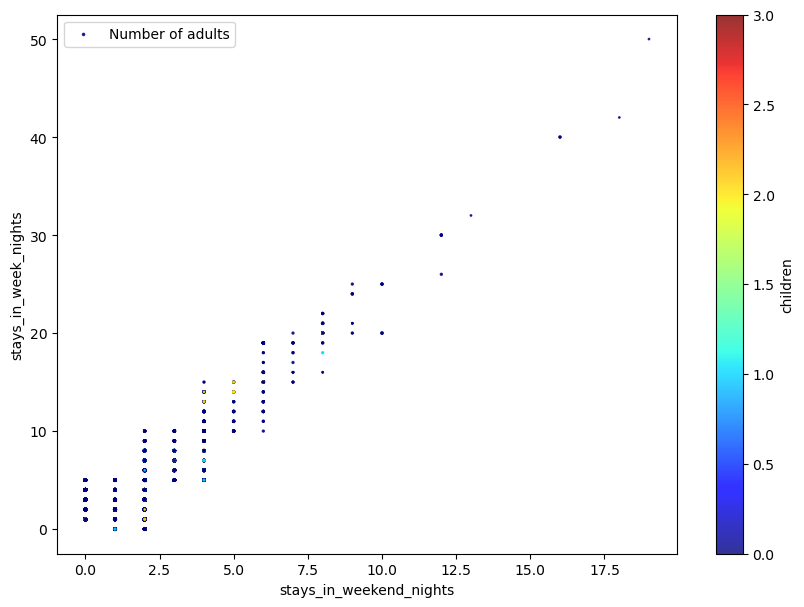

In [30]:
data.plot(kind="scatter", x="stays_in_weekend_nights", y="stays_in_week_nights", alpha=0.8,
             s=data["adults"], label="Number of adults", figsize=(10,7),
             c="children", cmap=plt.get_cmap("jet"), colorbar=True,
             sharex=False)
plt.legend()
plt.show()

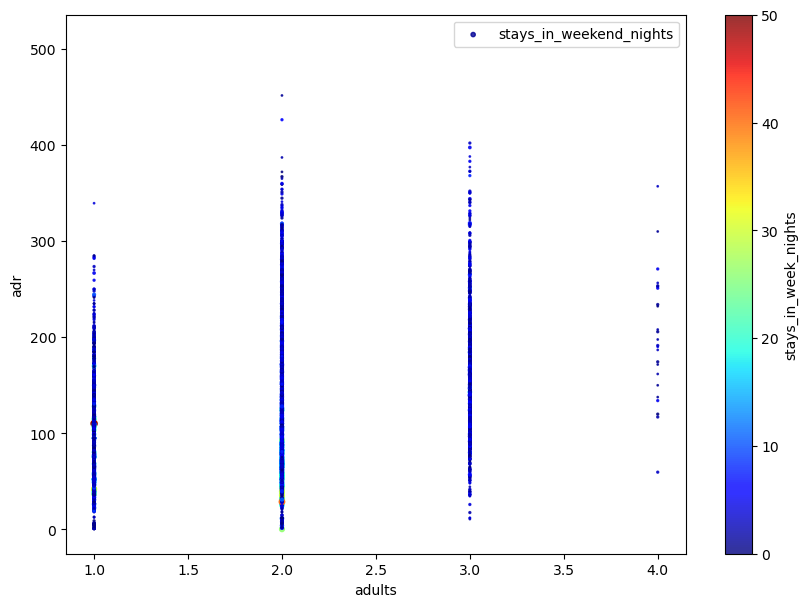

In [31]:
check3 = data[data.reservation_status != 'Canceled']
check3.plot(kind="scatter", x="adults", y="adr", alpha=0.8,
             s=check3["stays_in_weekend_nights"], label="stays_in_weekend_nights", figsize=(10,7),
             c="stays_in_week_nights", cmap=plt.get_cmap("jet"), colorbar=True,
             sharex=False)
plt.legend()
plt.show()

In [32]:
#pd.crosstab(data.children, data.adults)

In [33]:
#pd.crosstab(data.customer_type, data.adults, margins=True)

In [34]:
#pd.crosstab(data.reservation_status, data.adults, margins=True)

In [35]:
#pd.crosstab(data.customer_type, data.adults, normalize='all')

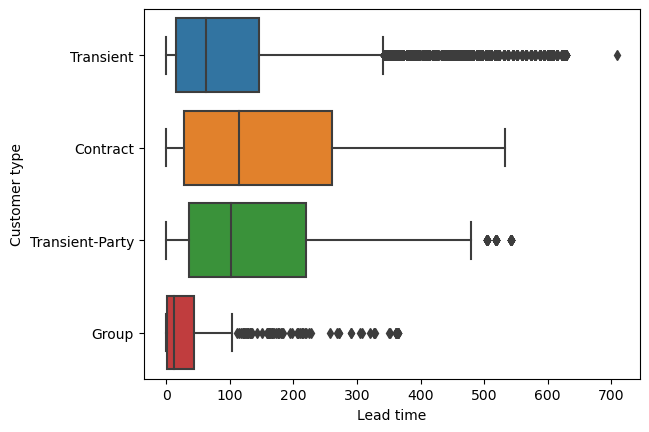

In [36]:
sns.boxplot(data=data, x="lead_time", y="customer_type")
plt.xlabel("Lead time")
#plt.xticks(rotation=45)
plt.ylabel("Customer type")
plt.show()

In [37]:
#data[data.adr > 4000]

In [38]:
#pd.crosstab(check4.assigned_room_type, columns = 'Count')

### ADR by group

In [39]:
data['Guests'] = data.adults + data.children + data.babies
data['Guests'] = data['Guests'].astype(int)
data['Guests'] = data['Guests'].astype(str)
a = data[data.adr == max(data.adr)]
a[['hotel','total_stay','arrival_date','Guests','adults', 'children', 'babies','customer_type','adr']]

,hotel,total_stay,arrival_date,Guests,adults,children,babies,customer_type,adr
111403,City Hotel,1,2017-05-09,1,1,0.0,0,Transient,510.0


In [40]:
pd.crosstab(data['Guests'], columns = 'Count')

col_0,Count
Guests,
1,21721
2,81035
3,10393
4,3893
5,132


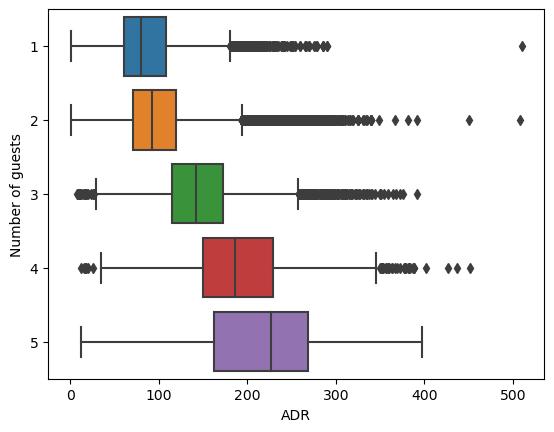

In [41]:
sns.boxplot(data=data, x="adr", y="Guests")
plt.xlabel("ADR")
#plt.xticks(rotation=45)
plt.ylabel("Number of guests")
plt.show();

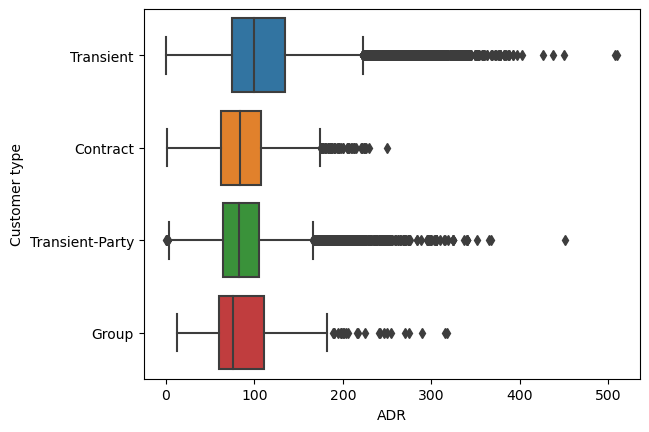

In [42]:
sns.boxplot(data=data, x="adr", y="customer_type")
plt.xlabel("ADR")
#plt.xticks(rotation=45)
plt.ylabel("Customer type")
plt.show();

### Data over time

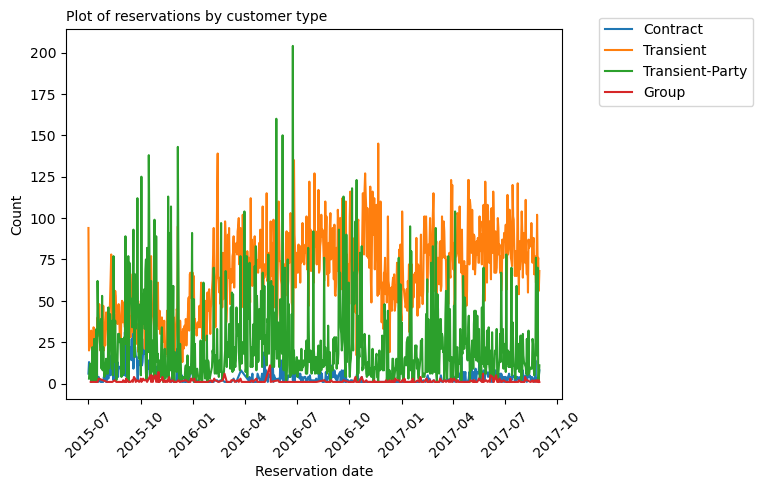

In [43]:
co_data = data[data.reservation_status == 'Check-Out']
a_time_df = co_data.groupby(['arrival_date','customer_type'])['Val'].sum()
a_time_df = a_time_df.reset_index()
a_time_df.arrival_date = pd.to_datetime(a_time_df.arrival_date)

sns.lineplot(data=a_time_df, x="arrival_date", y="Val", hue="customer_type")
plt.title("Plot of reservations by customer type", loc='left', fontsize=10, fontweight=0, color='black')
plt.xlabel("Reservation date")
plt.legend(bbox_to_anchor=(1.4, 1.05))
plt.xticks(rotation=45)
plt.ylabel("Count")
plt.show()

FixedFormatter should only be used together with FixedLocator


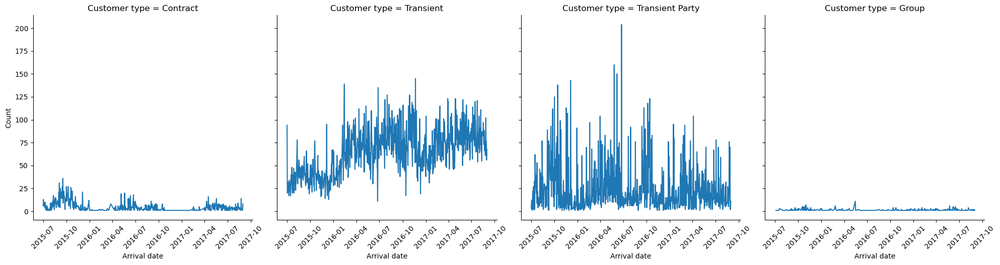

In [44]:
rel = sns.relplot(
    data=a_time_df, x="arrival_date", y="Val",
    col="customer_type", kind="line"
)

rel.set(xlabel="Arrival date", ylabel = "Count")

a0 = rel.fig.axes[0]
a0.set_title("Customer type = Contract")
a1 = rel.fig.axes[1]
a1.set_title("Customer type = Transient")
a2 = rel.fig.axes[2]
a2.set_title("Customer type = Transient Party")
a3 = rel.fig.axes[3]
a3.set_title("Customer type = Group")

for axes in rel.axes.flat:
    _ = axes.set_xticklabels(axes.get_xticklabels(), rotation=45)
plt.show()

### Business performance

In [18]:
data2017 = data[(data.arrival_date.dt.year == 2017) & ((data.reservation_status == 'Check-Out') | (data.deposit_type == 'Non Refund'))]
print(min(data2017.arrival_date),max(data2017.arrival_date))

2017-01-01 00:00:00 2017-08-31 00:00:00


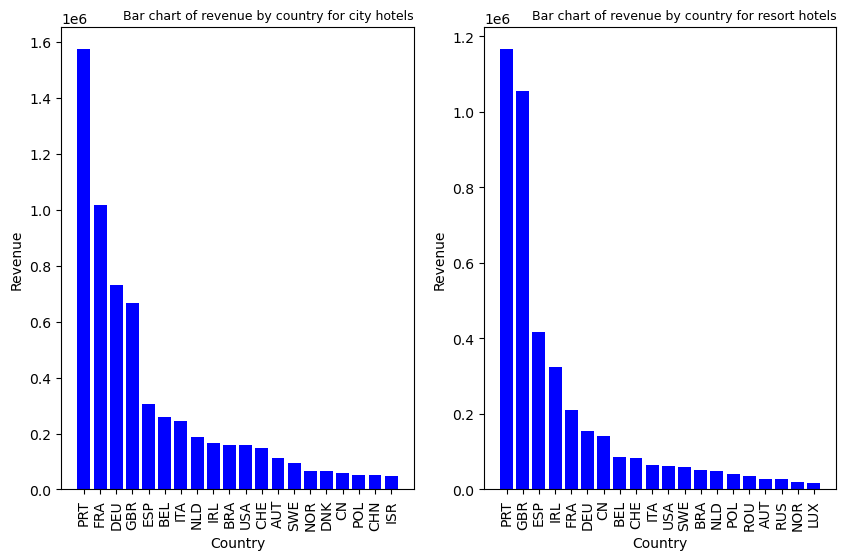

In [19]:
adr_year_t = data2017.groupby(['hotel','country'])['revenue'].sum()
adr_year_t = adr_year_t.reset_index()

adr_year_ch = adr_year_t[adr_year_t.hotel == 'City Hotel']
adr_year_ch = adr_year_ch.sort_values('revenue', ascending = False)
adr_year_ch20 = adr_year_ch.iloc[:20,]

adr_year_r = adr_year_t[adr_year_t.hotel == 'Resort Hotel']
adr_year_r = adr_year_r.sort_values('revenue', ascending = False)
adr_year_r20 = adr_year_r.iloc[:20,]

plt.figure(figsize=(10,6))
plt.subplot(1, 2, 1)

plt.bar('country', 'revenue', data = adr_year_ch20, color = 'blue')
plt.title("Bar chart of revenue by country for city hotels", loc='right', fontsize=9, fontweight=0, color='black')
plt.xlabel("Country")
plt.xticks(rotation=90)
plt.ylabel("Revenue")

plt.subplot(1, 2, 2)

plt.bar('country', 'revenue', data = adr_year_r20, color = 'blue')
plt.title("Bar chart of revenue by country for resort hotels", loc='right', fontsize=9, fontweight=0, color='black')
plt.xlabel("Country")
plt.xticks(rotation=90)
plt.ylabel("Revenue")
plt.show()

In [20]:
adr_year_ch = adr_year_ch.sort_values(by = 'country')
adr_year_r = adr_year_r.sort_values(by = 'country')
adr_year = pd.merge(adr_year_ch, adr_year_r, on = 'country', how = 'inner')
adr_year = adr_year.drop(['hotel_x','hotel_y'], axis = 1)
adr_year.columns = ['country', 'City hotel', 'Resort hotel']
adr_year['Sum'] = adr_year['City hotel'] + adr_year['Resort hotel']
adr_year['Perc_revenue'] = adr_year['Sum']/sum(adr_year['Sum'])*100
adr_year = adr_year.sort_values('Sum', ascending = False)
adr_year = adr_year.reset_index(drop=True)
adr_year['Cum_perc_revenue'] = adr_year['Perc_revenue'].cumsum() 
adr_year[adr_year.Cum_perc_revenue <= 82]

,country,City hotel,Resort hotel,Sum,Perc_revenue,Cum_perc_revenue
0,PRT,1573397.92,1165584.37,2738982.29,25.158430,25.158430
1,GBR,667025.72,1054740.96,1721766.68,15.814979,40.973409
2,FRA,1017866.78,209917.87,1227784.65,11.277595,52.251004
3,DEU,729928.95,154198.18,884127.13,8.120991,60.371995
4,ESP,305945.47,416565.94,722511.41,6.636499,67.008494
5,IRL,167700.21,323437.43,491137.64,4.511257,71.519751
6,BEL,258764.59,86340.77,345105.36,3.169903,74.689654
7,ITA,245361.96,64782.19,310144.15,2.848773,77.538428
8,NLD,186844.03,50149.24,236993.27,2.176859,79.715287
9,CHE,148064.60,83958.04,232022.64,2.131202,81.846489


In [21]:
#adr_year.iloc[:20,]

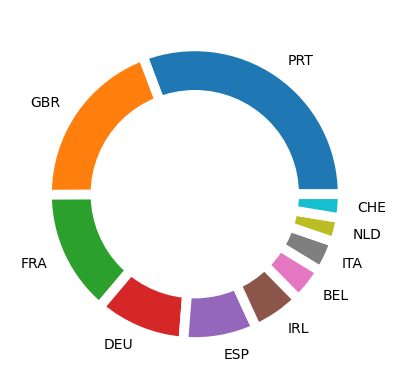

In [22]:
adr_year_d = adr_year[adr_year.Cum_perc_revenue <= 82]

my_circle = plt.Circle( (0,0), 0.7, color='white')

# Custom wedges
plt.pie(adr_year_d.Perc_revenue, labels=adr_year_d.country, wedgeprops = { 'linewidth' : 7, 'edgecolor' : 'white' })
p = plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

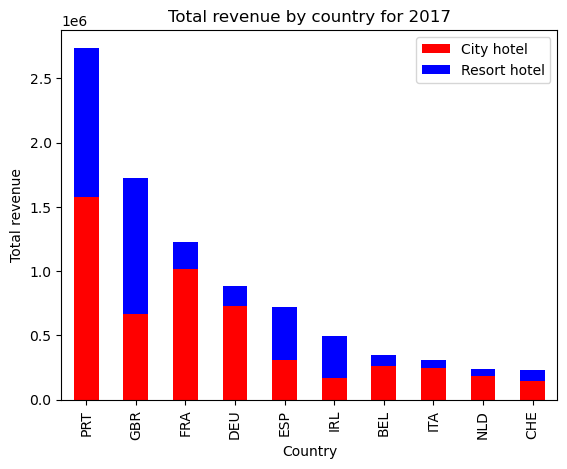

In [50]:
adr_years = adr_year[adr_year.Cum_perc_revenue <= 82]
adr_years = adr_years.drop(['Sum','Cum_perc_revenue','Perc_revenue'], axis = 1)
adr_years.plot(x = 'country', kind = 'bar', stacked = True, title = 'Total revenue by country for 2017', color=['red','blue'])
plt.xlabel("Country")
plt.xticks(rotation=90)
plt.ylabel("Total revenue")
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


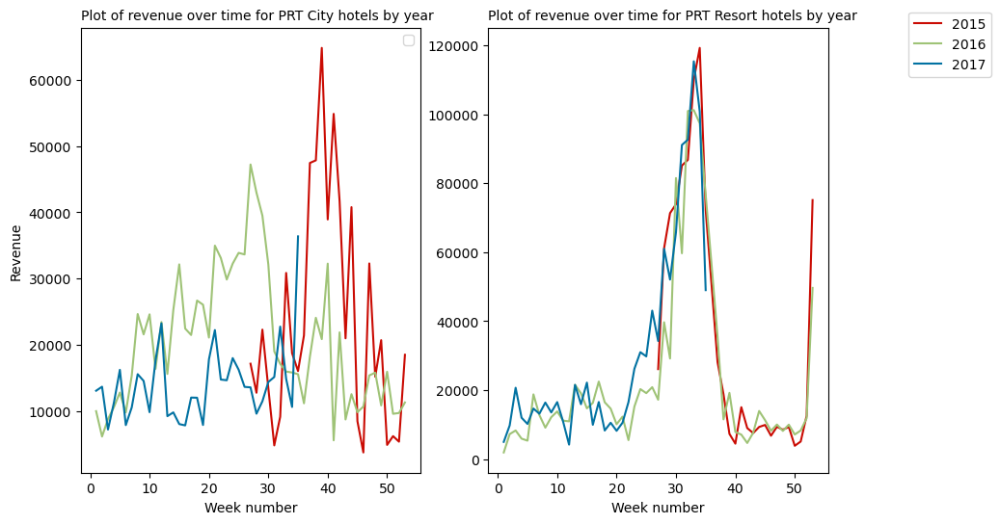

In [51]:
country_lp('PRT')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


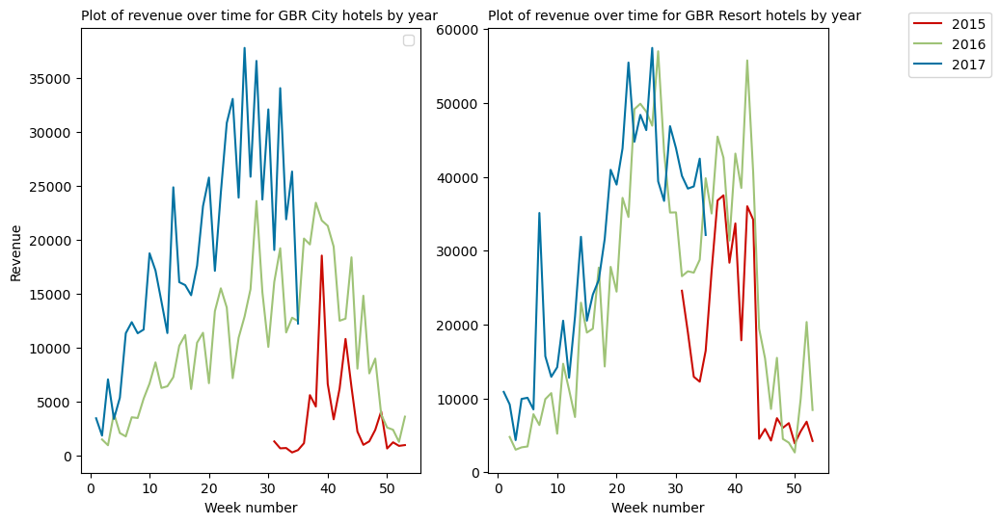

In [52]:
country_lp('GBR')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


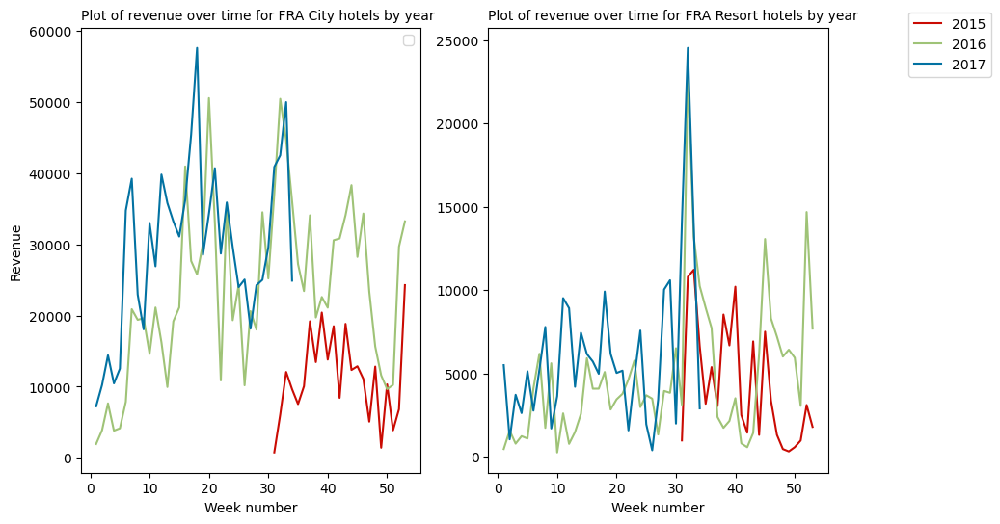

In [53]:
country_lp('FRA')

In [54]:
rev2017 = data[data.arrival_date_year >= 2017]
compare_rev = data[(data.arrival_date_year >= 2016) & 
                   (data.arrival_date_week_number <= max(rev2017.arrival_date_week_number)) &
                   (data.reservation_status == 'Check-Out') &
                   (data.country.isin(list(set(adr_years.country))))]

In [55]:
compare_rev_a = compare_rev.groupby(['country','hotel','arrival_date_year'])['revenue'].sum()
compare_rev_a = compare_rev_a.reset_index()
compare_rev_b = compare_rev_a.pivot(index = ['country','hotel'], columns = 'arrival_date_year', values = 'revenue')
compare_rev_b = compare_rev_b.reset_index()


In [56]:
compare_rev_b.iloc[:,2] = compare_rev_b.iloc[:,2].fillna(0)
compare_rev_b.iloc[:,3] = compare_rev_b.iloc[:,3].fillna(0)
compare_rev_b['diff'] = compare_rev_b.iloc[:,3] - compare_rev_b.iloc[:,2]
compare_rev_b['perc_diff'] = compare_rev_b['diff']/compare_rev_b.iloc[:,2] * 100
compare_rev_c = compare_rev_b[compare_rev_b.iloc[:,2] != 0]
compare_rev_c = compare_rev_c.sort_values('perc_diff', ascending = False)
print(compare_rev_c.shape)
compare_rev_c = compare_rev_c.sort_values('country')
compare_rev_c.head(20)

(20, 6)


arrival_date_year,country,hotel,2016,2017,diff,perc_diff
1,BEL,Resort Hotel,39641.21,86340.77,46699.56,117.805587
0,BEL,City Hotel,163839.55,258764.59,94925.04,57.937806
3,CHE,Resort Hotel,56233.97,83958.04,27724.07,49.301285
2,CHE,City Hotel,105475.87,148064.60,42588.73,40.377700
4,DEU,City Hotel,503691.17,729793.95,226102.78,44.889169
5,DEU,Resort Hotel,130962.70,154198.18,23235.48,17.742059
6,ESP,City Hotel,308270.02,302948.47,-5321.55,-1.726263
7,ESP,Resort Hotel,381142.14,416565.94,35423.80,9.294118
9,FRA,Resort Hotel,154369.75,209917.87,55548.12,35.983812
8,FRA,City Hotel,793513.57,1017866.78,224353.21,28.273393


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


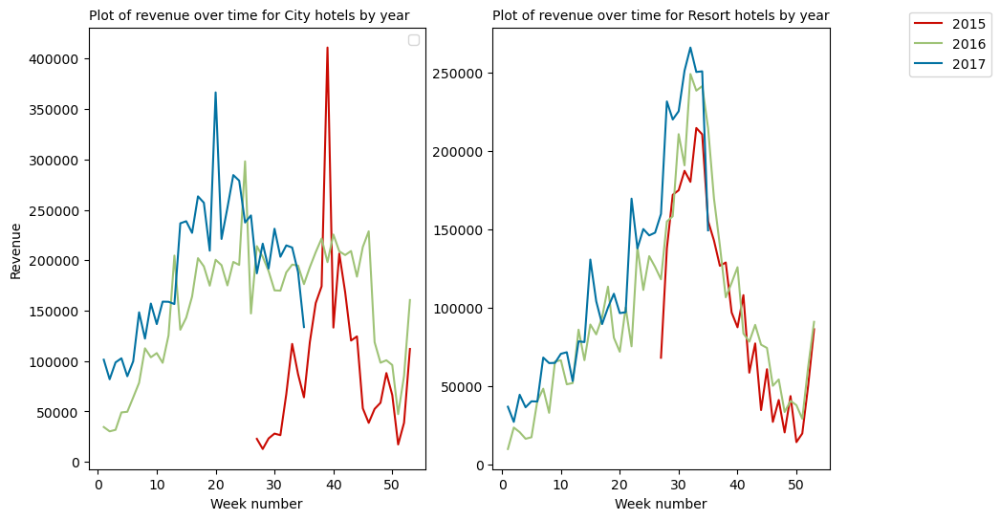

In [57]:
''' Line plots of revenue by country, hotel and year '''

gbr_ch = data[(data.hotel == 'City Hotel') & ((data.reservation_status == 'Check-Out') | (data.deposit_type == 'Non Refund'))]
gbr_rh = data[(data.hotel == 'Resort Hotel') & ((data.reservation_status == 'Check-Out') | (data.deposit_type == 'Non Refund'))]

gbr_ch_my = gbr_ch.groupby(['arrival_date_year','arrival_date_week_number'])['revenue'].sum()
gbr_ch_my = gbr_ch_my.reset_index()
gbr_rh_my = gbr_rh.groupby(['arrival_date_year','arrival_date_week_number'])['revenue'].sum()
gbr_rh_my = gbr_rh_my.reset_index()

gbr = pd.merge(gbr_ch_my, gbr_rh_my, on = ['arrival_date_year','arrival_date_week_number'], how = 'inner')
gbr.columns = ['arrival_date_year','arrival_date_week_number','revenue_ch','revenue_rh']

plt.figure(figsize=(10,6))
plt.subplot(1, 2, 1)

sns.lineplot(data=gbr, x="arrival_date_week_number", y="revenue_ch", palette=['r', 'g', 'b'], hue="arrival_date_year",legend=None)
plt.title("Plot of revenue over time for City hotels by year", loc='left', fontsize=10, fontweight=0, color='black')
plt.xlabel("Week number")
plt.ylabel("Revenue")
plt.legend()
    
plt.subplot(1, 2, 2)
sns.lineplot(data=gbr, x="arrival_date_week_number", y="revenue_rh", palette=['r', 'g', 'b'], hue="arrival_date_year")
plt.title("Plot of revenue over time for Resort hotels by year", loc='left', fontsize=10, fontweight=0, color='black')
plt.xlabel("Week number")
plt.ylabel(" ")
plt.legend(bbox_to_anchor=(1.5, 1.05))
plt.show()

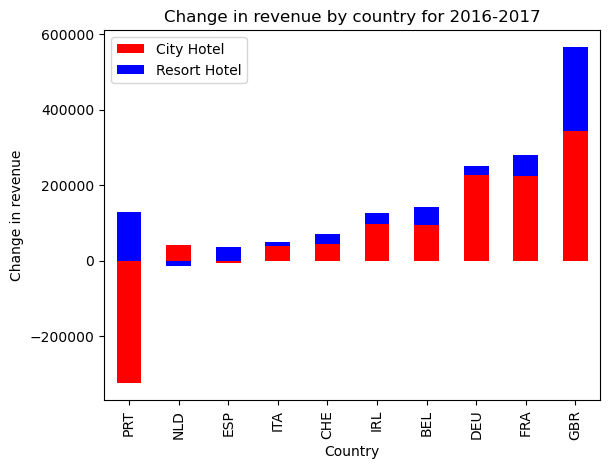

In [58]:
compare_rev_d = compare_rev_c[['country','hotel','diff']]
compare_rev_d = compare_rev_d.reset_index()
compare_rev_d = compare_rev_d.pivot(index = ['country'], columns = 'hotel', values = 'diff')
compare_rev_d['Sum'] = compare_rev_d['City Hotel'] + compare_rev_d['Resort Hotel']
compare_rev_d = compare_rev_d.sort_values('Sum')
compare_rev_d = compare_rev_d.drop(['Sum'], axis = 1)
compare_rev_d = compare_rev_d.reset_index()
compare_rev_d.plot(x = 'country', kind = 'bar', stacked = True, 
                   title = 'Change in revenue by country for 2016-2017', color=['red','blue'])
plt.xlabel("Country")
plt.xticks(rotation=90)
plt.legend()
plt.ylabel("Change in revenue")
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


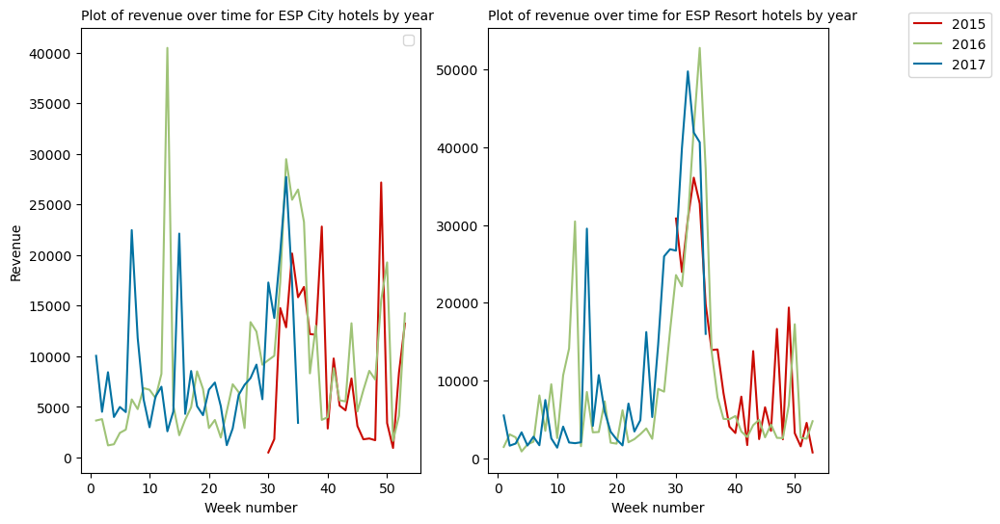

In [59]:
country_lp('ESP')

#### Number of guests

In [60]:
guest_df = data[['adults','children','arrival_date','stays_in_weekend_nights','stays_in_week_nights','arrival_date_year',
                'reservation_status','country','hotel']]        
guest_df = guest_df[(guest_df.arrival_date_year >= 2016) & 
                    (guest_df.reservation_status == 'Check-Out') &
                   (guest_df.country.isin(list(set(adr_years.country))))]
guest_df['guests'] = guest_df.adults + guest_df.children
guest_df['guests'] = guest_df['guests'].astype(int)
guest_df['stay_length'] = guest_df.stays_in_weekend_nights + guest_df.stays_in_week_nights
guest_df = guest_df.drop(['adults','children','stays_in_weekend_nights','stays_in_week_nights','reservation_status','arrival_date_year'], axis = 1)
guest_df.head()

,arrival_date,country,hotel,guests,stay_length
3770,2016-01-02,FRA,Resort Hotel,2,7
3785,2016-01-06,GBR,Resort Hotel,2,1
3786,2016-01-06,DEU,Resort Hotel,2,4
3797,2016-01-08,PRT,Resort Hotel,2,2
3802,2016-01-08,IRL,Resort Hotel,2,4


In [61]:
guest_df = guest_df.reset_index()

date_lst = []
guest_lst = []
country_lst = []
hotel_lst = []

for i in range(guest_df.shape[0]):
    dset = guest_df.iloc[i,:]
    for j in range(dset.stay_length):
        date_lst.append(dset.arrival_date + relativedelta(days=j))
        guest_lst.append(dset.guests)
        country_lst.append(dset.country)
        hotel_lst.append(dset.hotel)
    
dset_g = pd.DataFrame(date_lst, columns = ['arrival_date'])
dset_g['guests'] = guest_lst
dset_g['country'] = country_lst
dset_g['hotel'] = hotel_lst

print(guest_df.shape,dset_g.shape)

(48318, 6) (165908, 4)


In [62]:
dset_g.arrival_date = pd.to_datetime(dset_g.arrival_date)
dset_g = dset_g[(dset_g.arrival_date.dt.year >= 2017)]
dset_g['month_date'] = pd.to_datetime(pd.DataFrame({'day': 1, 
                                                      'month': dset_g['arrival_date'].dt.month, 
                                                      'year': dset_g['arrival_date'].dt.year},
                                                     index=dset_g.index))
dset_g.head(10)

,arrival_date,guests,country,hotel,month_date
6048,2017-01-25,1,PRT,Resort Hotel,2017-01-01
6049,2017-02-22,2,GBR,Resort Hotel,2017-02-01
6050,2017-02-23,2,GBR,Resort Hotel,2017-02-01
6051,2017-02-24,2,GBR,Resort Hotel,2017-02-01
6052,2017-02-25,2,GBR,Resort Hotel,2017-02-01
6053,2017-03-02,1,BEL,Resort Hotel,2017-03-01
6054,2017-03-03,1,BEL,Resort Hotel,2017-03-01
6055,2017-03-04,1,BEL,Resort Hotel,2017-03-01
6056,2017-04-21,2,PRT,Resort Hotel,2017-04-01
6057,2017-04-22,2,PRT,Resort Hotel,2017-04-01


In [63]:
guest_df_c = dset_g.groupby(['country','hotel','month_date'])['guests'].sum()
guest_df_c = guest_df_c.reset_index()
guest_df_c = guest_df_c[guest_df_c.country == 'GBR']

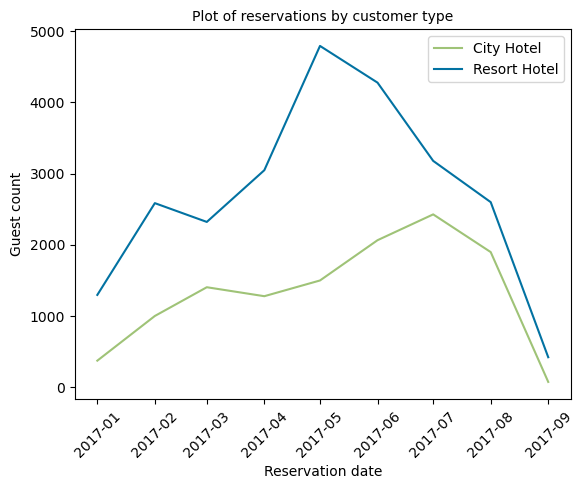

In [64]:
sns.lineplot(data=guest_df_c, x="month_date", y="guests", hue="hotel",palette=['g', 'b'])
plt.title("Plot of reservations by customer type", loc='center', fontsize=10, fontweight=0, color='black')
plt.xlabel("Reservation date")
plt.xticks(rotation=45)
plt.legend()
plt.ylabel("Guest count")
plt.show()

#### Repeat customers

In [65]:
repeat_df = data[['hotel','reservation_status','is_repeated_guest','customer_type','arrival_date',
                 'stays_in_weekend_nights','stays_in_week_nights','adr','country','Val','arrival_date_year']]
repeat_df = repeat_df[(repeat_df.arrival_date_year >= 2017) & 
                      (repeat_df.country.isin(list(set(adr_years.country))))]
repeat_df['stay_length'] = repeat_df.stays_in_weekend_nights + repeat_df.stays_in_week_nights
repeat_df['revenue'] = repeat_df.adr * (repeat_df.stays_in_weekend_nights + repeat_df.stays_in_week_nights)
deck = {0: 'No', 1: 'Yes'}
repeat_df['is_repeated_guest'] = repeat_df['is_repeated_guest'].map(deck)
repeat_df.head()

,hotel,reservation_status,is_repeated_guest,customer_type,arrival_date,stays_in_weekend_nights,stays_in_week_nights,adr,country,Val,arrival_date_year,stay_length,revenue
9775,Resort Hotel,Canceled,No,Transient,2017-01-01,1,0,57.60,PRT,1,2017,1,57.60
9779,Resort Hotel,Canceled,No,Transient,2017-01-01,2,2,32.22,PRT,1,2017,4,128.88
9780,Resort Hotel,Canceled,No,Transient,2017-01-01,2,3,44.64,ITA,1,2017,5,223.20
9781,Resort Hotel,Canceled,No,Transient,2017-01-01,2,5,42.69,BEL,1,2017,7,298.83
9782,Resort Hotel,Canceled,No,Transient,2017-01-01,2,5,42.69,GBR,1,2017,7,298.83


In [66]:
pd.crosstab(repeat_df.is_repeated_guest, columns = 'Count')
pd.DataFrame(pd.crosstab(repeat_df.is_repeated_guest, repeat_df.hotel, normalize='columns'))

re_data = repeat_df.copy()
re_data.rename(columns = {'is_repeated_guest':'Repeat guest',
                        'hotel':'Hotel type'}, inplace = True)
room_t = pd.DataFrame(pd.crosstab(re_data['Repeat guest'], re_data['Hotel type'], normalize='columns'))
room_t = room_t * 100

ax = sns.heatmap(room_t, annot = True, cmap="Greens")
ax.invert_yaxis()

In [67]:
repeat_df_c = repeat_df.groupby(['country','hotel','is_repeated_guest'])['Val'].sum()
repeat_df_c = repeat_df_c.reset_index()
repeat_df_c = repeat_df_c.pivot(index = ['country','hotel'], columns = 'is_repeated_guest', values = 'Val')
repeat_df_c = repeat_df_c.reset_index()
repeat_df_c['No'] = repeat_df_c['No'].fillna(0)
repeat_df_c['Yes'] = repeat_df_c['Yes'].fillna(0)
repeat_df_c.head()

is_repeated_guest,country,hotel,No,Yes
0,BEL,City Hotel,813.0,6.0
1,BEL,Resort Hotel,170.0,4.0
2,CHE,City Hotel,533.0,0.0
3,CHE,Resort Hotel,198.0,2.0
4,DEU,City Hotel,2488.0,10.0


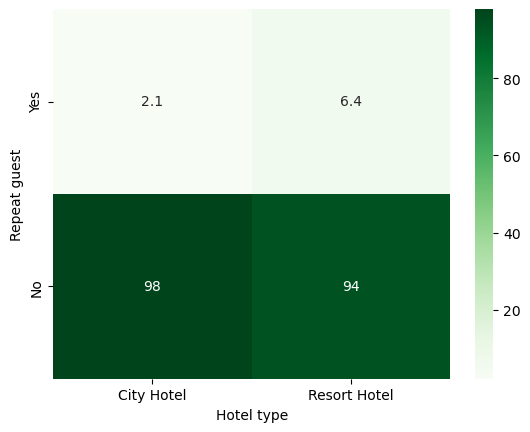

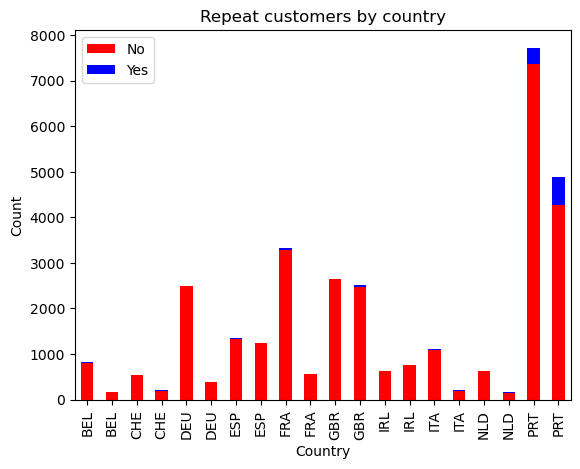

In [68]:
repeat_df_c.plot(x = 'country', kind = 'bar', stacked = True, 
                   title = 'Repeat customers by country', color=['red','blue'])
plt.xlabel("Country")
plt.xticks(rotation=90)
plt.legend()
plt.ylabel("Count")
plt.show()

<Figure size 1000x600 with 0 Axes>

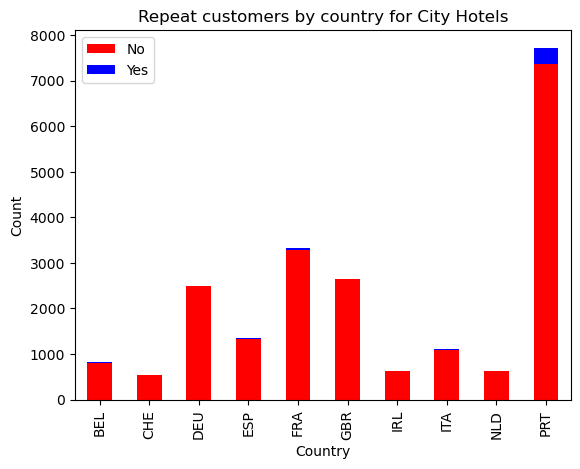

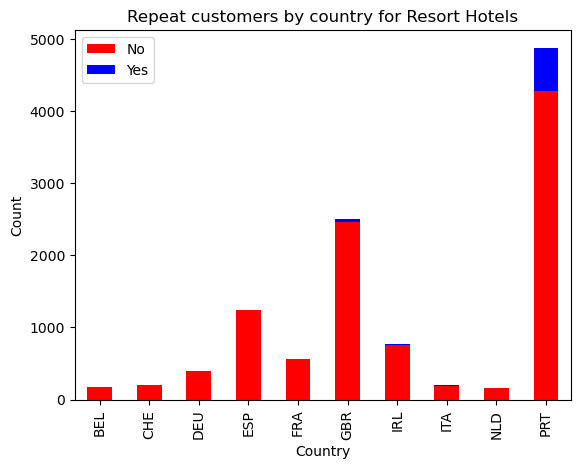

In [69]:
repeat_df_ch = repeat_df_c[repeat_df_c.hotel == 'City Hotel']
repeat_df_rh = repeat_df_c[repeat_df_c.hotel == 'Resort Hotel']
repeat_df_rh = repeat_df_rh.reset_index(drop=True)
repeat_df_ch = repeat_df_ch.reset_index(drop=True)

plt.figure(figsize=(10,6))

repeat_df_ch.plot(x = 'country', kind = 'bar', stacked = True, 
                   title = 'Repeat customers by country for City Hotels', color=['red','blue'])
plt.xlabel("Country")
plt.xticks(rotation=90)
plt.legend()
plt.ylabel("Count")
plt.show()

repeat_df_rh.plot(x = 'country', kind = 'bar', stacked = True, 
                   title = 'Repeat customers by country for Resort Hotels', color=['red','blue'])
plt.xlabel("Country")
plt.xticks(rotation=90)
plt.legend()
plt.ylabel("Count")
plt.show()

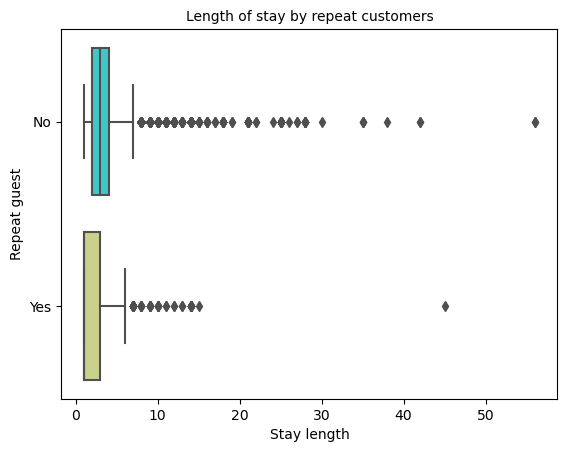

In [70]:
repeat_df['is_repeated_guest'] = repeat_df['is_repeated_guest'].astype(str)
sns.boxplot(data=repeat_df, x="stay_length", y="is_repeated_guest", palette='rainbow')
plt.title("Length of stay by repeat customers", loc='center', fontsize=10, fontweight=0, color='black')
plt.xlabel("Stay length")
plt.ylabel("Repeat guest")
plt.show()

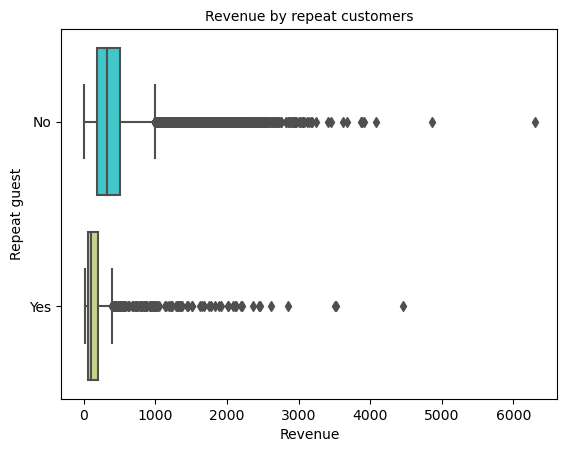

In [71]:
sns.boxplot(data=repeat_df, x="revenue", y="is_repeated_guest", palette='rainbow')
plt.title("Revenue by repeat customers", loc='center', fontsize=10, fontweight=0, color='black')
plt.xlabel("Revenue")
plt.ylabel("Repeat guest")
plt.show()

#### Previously cancelled

In [72]:
pcanc = data[(data.previous_cancellations > 0) &
             (data.arrival_date_year >= 2017) & 
             (data.country.isin(list(set(adr_years.country))))]
pcanc_a = pcanc.groupby(['country','hotel','previous_cancellations'])['Val'].sum()
pcanc_a = pcanc_a.reset_index()
pcanc_c = data.groupby(['country','hotel'])['Val'].sum()
pcanc_c = pcanc_c.reset_index()

pcanc_d = pd.merge(pcanc_a, pcanc_c, on = ['country','hotel'], how = 'inner')
pcanc_d['Perc'] = pcanc_d.Val_x/pcanc_d.Val_y*100


<Figure size 1000x600 with 0 Axes>

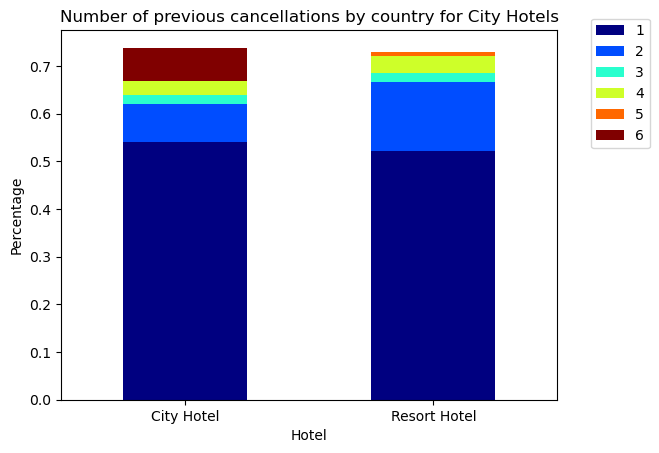

In [73]:
pcanc_z = pcanc.groupby(['hotel','previous_cancellations'])['Val'].sum()
pcanc_z = pcanc_z.reset_index()

pcane = data[
             (data.arrival_date_year >= 2017) & 
             (data.country.isin(list(set(adr_years.country))))]
pcanc_za = pcane.groupby(['hotel'])['Val'].sum()
pcanc_za = pcanc_za.reset_index()

pcanc_zb = pd.merge(pcanc_za, pcanc_z, on = 'hotel', how = 'inner')
pcanc_zb['Perc'] = pcanc_zb.Val_y/pcanc_zb.Val_x * 100

pcanc_z = pcanc_zb.pivot(index = ['hotel'], columns = 'previous_cancellations', values = 'Perc')
pcanc_z = pcanc_z.reset_index()

plt.figure(figsize=(10,6))

pcanc_z.plot(x = 'hotel', kind = 'bar', stacked = True, 
                   title = 'Number of previous cancellations by country for City Hotels', cmap='jet')
plt.xlabel("Hotel")
plt.xticks(rotation=0)
plt.legend(bbox_to_anchor=(1.2, 1.05))
plt.ylabel("Percentage")
plt.show();


<Figure size 1000x600 with 0 Axes>

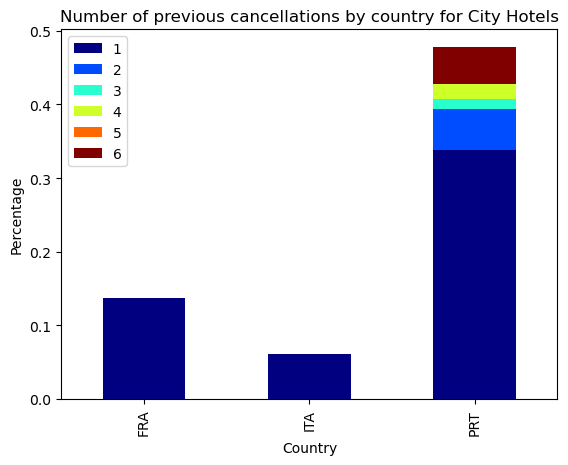

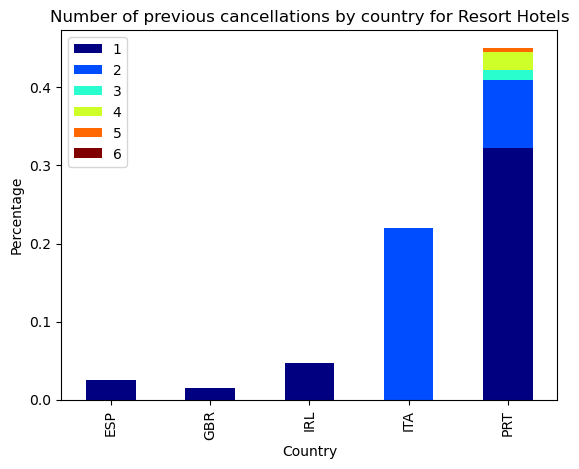

In [74]:
pcanc_a = pcanc_d.pivot(index = ['country','hotel'], columns = 'previous_cancellations', values = 'Perc')
pcanc_a = pcanc_a.reset_index()

pcanc_ch = pcanc_a[pcanc_a.hotel == 'City Hotel']
pcanc_rh = pcanc_a[pcanc_a.hotel == 'Resort Hotel']
pcanc_rh = pcanc_rh.reset_index(drop=True)
pcanc_ch = pcanc_ch.reset_index(drop=True)

plt.figure(figsize=(10,6))

pcanc_ch.plot(x = 'country', kind = 'bar', stacked = True, 
                   title = 'Number of previous cancellations by country for City Hotels', cmap='jet')
plt.xlabel("Country")
plt.xticks(rotation=90)
plt.legend()
plt.ylabel("Percentage")
plt.show()

pcanc_rh.plot(x = 'country', kind = 'bar', stacked = True, 
                   title = 'Number of previous cancellations by country for Resort Hotels', cmap='jet')
plt.xlabel("Country")
plt.xticks(rotation=90)
plt.legend()
plt.ylabel("Percentage")
plt.show()

In [75]:
pcanc_prt = data[(data.previous_cancellations > 0) &
             (data.country == 'PRT')]
pcanc_prt = pcanc_prt.groupby(['hotel','arrival_date_year','previous_cancellations'])['Val'].sum()
pcanc_prt = pcanc_prt.reset_index()


<Figure size 1000x600 with 0 Axes>

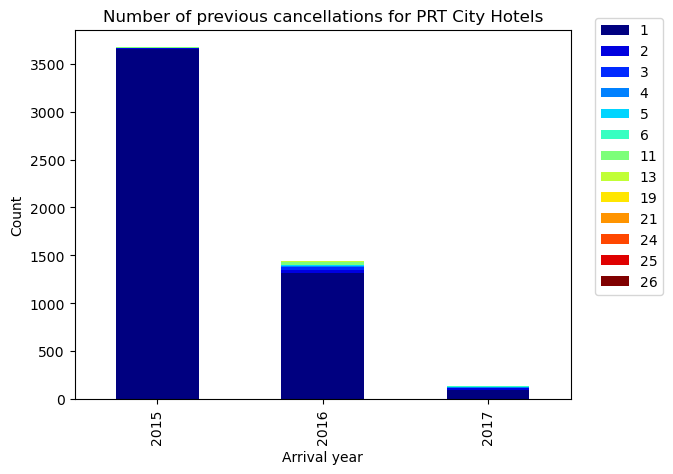

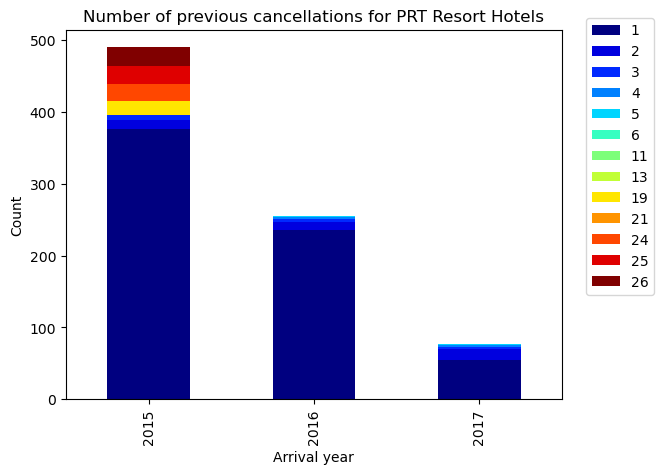

In [76]:
pcanc_prt_a = pcanc_prt.pivot(index = ['arrival_date_year','hotel'], columns = 'previous_cancellations', values = 'Val')
pcanc_prt_a = pcanc_prt_a.reset_index()

pcanc_prt_ch = pcanc_prt_a[pcanc_prt_a.hotel == 'City Hotel']
pcanc_prt_rh = pcanc_prt_a[pcanc_prt_a.hotel == 'Resort Hotel']
pcanc_prt_rh = pcanc_prt_rh.reset_index(drop=True)
pcanc_prt_ch = pcanc_prt_ch.reset_index(drop=True)

plt.figure(figsize=(10,6))

pcanc_prt_ch.plot(x = 'arrival_date_year', kind = 'bar', stacked = True, 
                   title = 'Number of previous cancellations for PRT City Hotels', cmap='jet')
plt.xlabel("Arrival year")
plt.ylabel("Count")
plt.legend(bbox_to_anchor=(1.2, 1.05))
plt.show()

pcanc_prt_rh.plot(x = 'arrival_date_year', kind = 'bar', stacked = True, 
                   title = 'Number of previous cancellations for PRT Resort Hotels', cmap='jet')
plt.xlabel("Arrival year")
plt.legend(bbox_to_anchor=(1.2, 1.05))
plt.ylabel("Count")
plt.show()

#### Room type

In [77]:
r_data = data.copy()
r_data.rename(columns = {'assigned_room_type':'Assigned room type',
                        'reserved_room_type':'Reserved room type'}, inplace = True)
room_t = pd.DataFrame(pd.crosstab(r_data['Reserved room type'], r_data['Assigned room type']))

ax = sns.heatmap(room_t, annot = False, cmap="Greens")
ax.invert_yaxis();

#### Booking changes

In [78]:
bchange = data[(data.booking_changes > 0) &
               (data.arrival_date_year >= 2017) & 
               (data.country.isin(list(set(adr_years.country))))]
bchange_a = bchange.groupby(['country','hotel','booking_changes'])['Val'].sum()
bchange_a = bchange_a.reset_index()

bchange_c = data.groupby(['country','hotel'])['Val'].sum()
bchange_c = bchange_c.reset_index()

bchange_d = pd.merge(bchange_a, bchange_c, on = ['country','hotel'], how = 'inner')
bchange_d['Perc'] = bchange_d.Val_x/bchange_d.Val_y*100

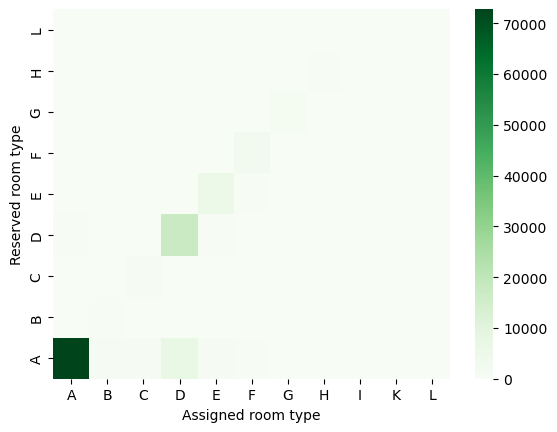

<Figure size 1000x600 with 0 Axes>

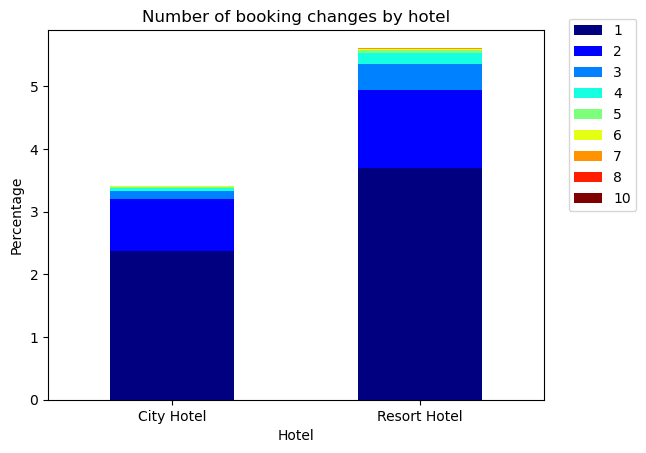

In [79]:
bchange_e = bchange.groupby(['hotel','booking_changes'])['Val'].sum()
bchange_e = bchange_e.reset_index()

bchange_d = data.groupby(['hotel'])['Val'].sum()
bchange_d = bchange_d.reset_index()

bchange_f = pd.merge(bchange_e, bchange_d, on = ['hotel'], how = 'inner')
bchange_f['Perc'] = bchange_f.Val_x/bchange_f.Val_y*100

bchange_f = bchange_f.pivot(index = ['hotel'], columns = 'booking_changes', values = 'Perc')
bchange_f = bchange_f.reset_index()

plt.figure(figsize=(10,6))

bchange_f.plot(x = 'hotel', kind = 'bar', stacked = True, 
                   title = 'Number of booking changes by hotel', cmap='jet')
plt.xlabel("Hotel")
plt.xticks(rotation=0)
plt.legend(bbox_to_anchor=(1.2, 1.05))
plt.ylabel("Percentage")
plt.show();

<Figure size 1000x600 with 0 Axes>

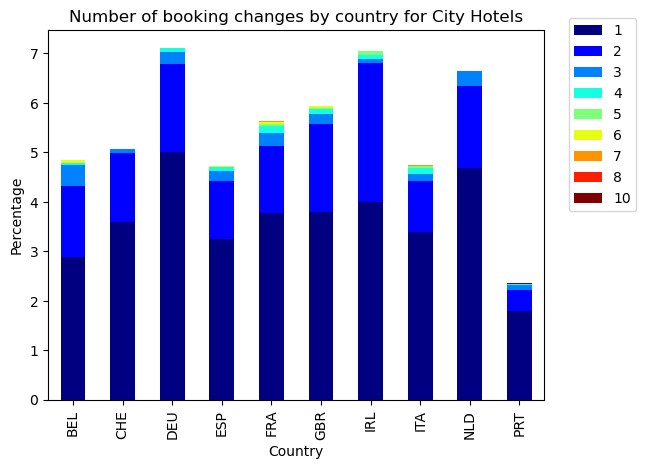

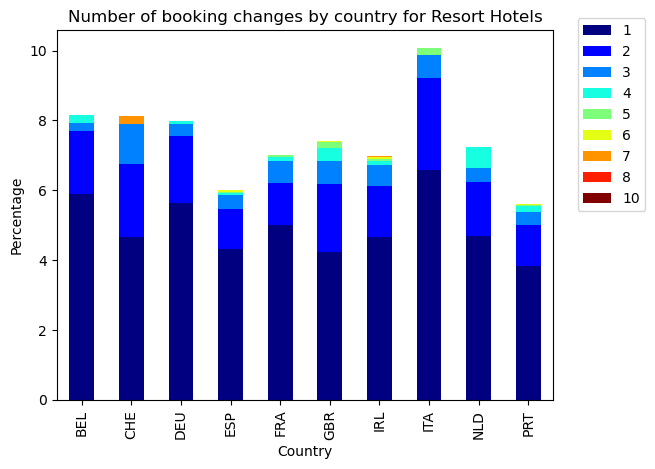

In [80]:
bchange_d = pd.merge(bchange_a, bchange_c, on = ['country','hotel'], how = 'inner')
bchange_d['Perc'] = bchange_d.Val_x/bchange_d.Val_y*100

bchange_b = bchange_d.pivot(index = ['country','hotel'], columns = 'booking_changes', values = 'Perc')
bchange_b = bchange_b.reset_index()

bchange_ch = bchange_b[bchange_b.hotel == 'City Hotel']
bchange_rh = bchange_b[bchange_b.hotel == 'Resort Hotel']
bchange_rh = bchange_rh.reset_index(drop=True)
bchange_ch = bchange_ch.reset_index(drop=True)

plt.figure(figsize=(10,6))

bchange_ch.plot(x = 'country', kind = 'bar', stacked = True, 
                   title = 'Number of booking changes by country for City Hotels', cmap='jet')
plt.xlabel("Country")
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.2, 1.05))
plt.ylabel("Percentage")
plt.show()

bchange_rh.plot(x = 'country', kind = 'bar', stacked = True, 
                   title = 'Number of booking changes by country for Resort Hotels', cmap='jet')
plt.xlabel("Country")
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.2, 1.05))
plt.ylabel("Percentage")
plt.show()

#### Days in the waiting list

In [81]:
pd.crosstab(data.reservation_status, data.days_in_waiting_list)

days_in_waiting_list,0,1,2,3,4,5,6,7,8,9,...,193,207,215,223,224,236,259,330,379,391
reservation_status,,,,,,,,,,,,,,,,,,,,,
Canceled,40391,3,1,59,8,5,0,3,4,14,...,1,5,13,25,6,6,0,1,9,45
Check-Out,71940,9,3,0,17,3,15,1,3,2,...,0,10,8,36,4,29,10,14,6,0
No-Show,1177,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


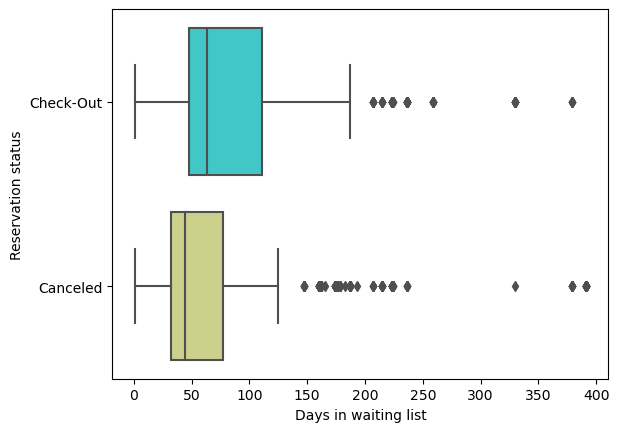

In [82]:
wlist = data[data.days_in_waiting_list > 0]
sns.boxplot(data=wlist, x="days_in_waiting_list", y="reservation_status", palette='rainbow')

plt.xlabel("Days in waiting list")
#plt.xticks(rotation=45)
plt.ylabel("Reservation status")
plt.show()

#### High ADR

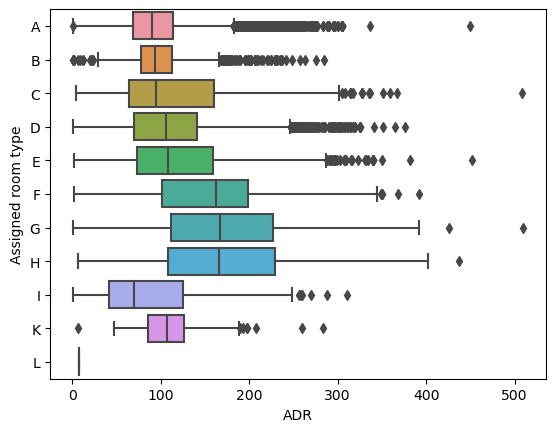

In [83]:
check4 = data[data.adr < 1000]
check4 = check4.sort_values(by = "assigned_room_type")
sns.boxplot(data=check4, x="adr", y="assigned_room_type")
plt.ylabel("Assigned room type")
#plt.xticks(rotation=45)
plt.xlabel("ADR")
plt.show();

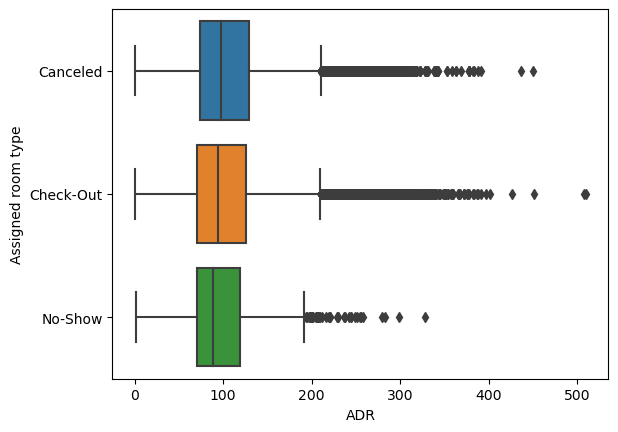

In [84]:
check4 = data[data.adr < 1000]
check4 = check4.sort_values(by = "reservation_status")
sns.boxplot(data=check4, x="adr", y="reservation_status")
plt.ylabel("Assigned room type")
#plt.xticks(rotation=45)
plt.xlabel("ADR")
plt.show();

#### Market and distribution

In [44]:
pd.crosstab(data.market_segment, data.reservation_status)

reservation_status,Canceled,Check-Out,No-Show
market_segment,,,
Aviation,41,180,10
Complementary,4,57,1
Corporate,911,4223,76
Direct,1685,10438,210
Groups,12001,7484,72
Offline TA/TO,8039,15612,229
Online TA,20065,35257,579


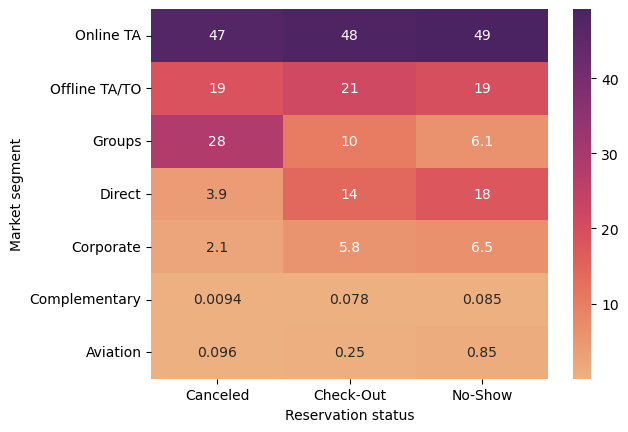

In [47]:
ms_data = data.copy()
ms_data.rename(columns = {'market_segment':'Market segment',
                        'reservation_status':'Reservation status'}, inplace = True)

mark_seg = pd.DataFrame(pd.crosstab(ms_data['Market segment'], ms_data['Reservation status'], normalize='columns'))
mark_seg = mark_seg * 100


ax = sns.heatmap(mark_seg, annot = True, cmap="flare")
ax.invert_yaxis()
plt.show();

In [87]:
pd.crosstab(data.distribution_channel, data.reservation_status)

reservation_status,Canceled,Check-Out,No-Show
distribution_channel,,,
Corporate,1360,5034,88
Direct,2234,11355,216
GDS,34,152,3
TA/TO,39118,56709,870
Undefined,0,1,0


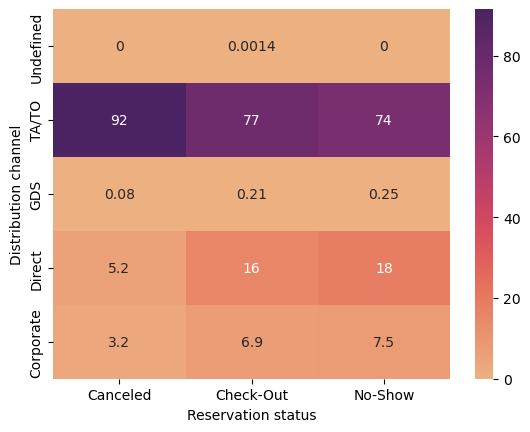

In [50]:
pd.crosstab(data.distribution_channel, data.reservation_status, normalize='columns')
dc_data = data.copy()
dc_data.rename(columns = {'distribution_channel':'Distribution channel',
                        'reservation_status':'Reservation status'}, inplace = True)

dist_c = pd.DataFrame(pd.crosstab(dc_data['Distribution channel'], dc_data['Reservation status'], normalize='columns'))
dist_c = dist_c * 100


ax = sns.heatmap(dist_c, annot = True, cmap="flare")
ax.invert_yaxis()
plt.show();

In [89]:
print(list(data.columns))

['hotel', 'is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_month', 'arrival_date_week_number', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'reserved_room_type', 'assigned_room_type', 'booking_changes', 'deposit_type', 'agent', 'company', 'days_in_waiting_list', 'customer_type', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'reservation_status', 'reservation_status_date', 'weekdates', 'arrival_date', 'arrival_month', 'revenue', 'total_stay', 'Val', 'Guests']


In [51]:
ms_data_a = datavalas('distribution_channel')
mars_data_a = datavalas('market_segment')

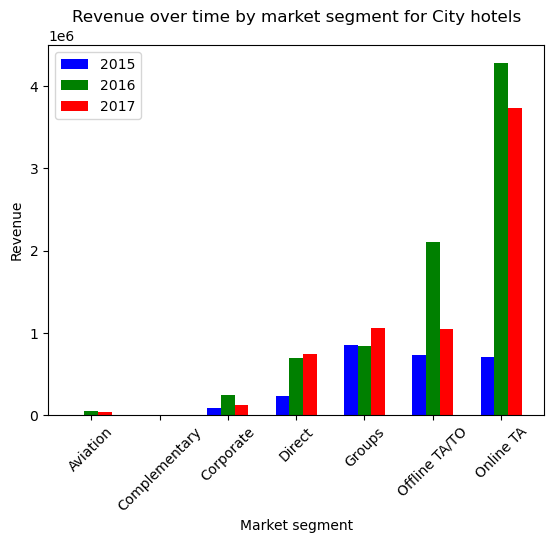

In [89]:
mars_data_a = data[((data.reservation_status == 'Check-Out') | (data.deposit_type == 'Non Refund'))]
                        
mars_data_ch = mars_data_a[(mars_data_a.market_segment != 'Undefined')  & (mars_data_a.hotel == 'City Hotel')]
mars_data_ch = mars_data_ch.reset_index()

mars_data_ch = mars_data_ch.groupby(['hotel','arrival_date_year','market_segment'])['revenue'].sum()
mars_data_ch = mars_data_ch.reset_index()
mars_data_ch = mars_data_ch.sort_values(by = ['hotel','market_segment','arrival_date_year'])
mars_data_ch = mars_data_ch.reset_index(drop=True)
    
X = list(set(mars_data_ch.market_segment))
X.sort()
val2015 = [0] + list(mars_data_ch.loc[(mars_data_ch.arrival_date_year == 2015),'revenue']) 
val2016 = list(mars_data_ch.loc[(mars_data_ch.arrival_date_year == 2016),'revenue']) 
val2017 = list(mars_data_ch.loc[(mars_data_ch.arrival_date_year == 2017),'revenue']) 
X_axis = np.arange(len(X))
plt.bar(X_axis - 0.2, val2015, 0.2, label = '2015', color = 'blue')
plt.bar(X_axis, val2016, 0.2, label = '2016', color = 'green')
plt.bar(X_axis + 0.2, val2017, 0.2, label = '2017', color = 'red')

plt.xticks(X_axis, X)
plt.xlabel("Market segment")
plt.ylabel("Revenue")
plt.xticks(rotation=45)
plt.title("Revenue over time by market segment for City hotels")
plt.legend()
plt.show();

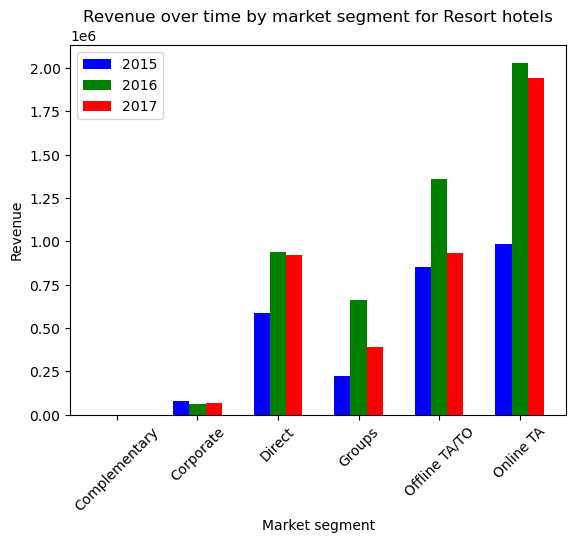

In [95]:
mars_data_rh = mars_data_a[(mars_data_a.market_segment != 'Undefined')  & (mars_data_a.hotel == 'Resort Hotel')]

mars_data_rh = mars_data_rh.groupby(['hotel','arrival_date_year','market_segment'])['revenue'].sum()
mars_data_rh = mars_data_rh.reset_index()
mars_data_rh = mars_data_rh.sort_values(by = ['hotel','market_segment','arrival_date_year'])
mars_data_rh = mars_data_rh.reset_index(drop=True)

X = list(set(mars_data_rh.market_segment))
X.sort()
val2015 = list(mars_data_rh.loc[(mars_data_rh.arrival_date_year == 2015),'revenue']) 
val2016 = list(mars_data_rh.loc[(mars_data_rh.arrival_date_year == 2016),'revenue']) 
val2017 = list(mars_data_rh.loc[(mars_data_rh.arrival_date_year == 2017),'revenue']) 
X_axis = np.arange(len(X))
plt.bar(X_axis - 0.2, val2015, 0.2, label = '2015', color = 'blue')
plt.bar(X_axis, val2016, 0.2, label = '2016', color = 'green')
plt.bar(X_axis + 0.2, val2017, 0.2, label = '2017', color = 'red')

plt.xticks(X_axis, X)
plt.xlabel("Market segment")
plt.ylabel("Revenue")
plt.title("Revenue over time by market segment for Resort hotels")
plt.xticks(rotation=45)
plt.legend()
plt.show();

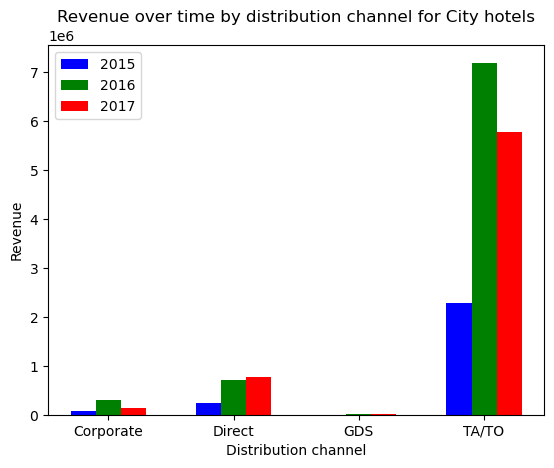

In [97]:
ms_data_a = ms_data_a[ms_data_a.distribution_channel != 'Undefined']

ms_data_a = ms_data_a.groupby(['hotel','arrival_date_year','distribution_channel'])['revenue'].sum()
ms_data_a = ms_data_a.reset_index()
ms_data_a = ms_data_a.sort_values(by = ['hotel','distribution_channel','arrival_date_year'])
ms_data_a = ms_data_a.reset_index(drop=True)

X = list(set(ms_data_a.distribution_channel))
X.sort()
val2015 = list(ms_data_a.loc[(ms_data_a.arrival_date_year == 2015) & (ms_data_a.hotel == 'City Hotel'),'revenue'])
val2016 = list(ms_data_a.loc[(ms_data_a.arrival_date_year == 2016) & (ms_data_a.hotel == 'City Hotel'),'revenue'])
val2017 = list(ms_data_a.loc[(ms_data_a.arrival_date_year == 2017) & (ms_data_a.hotel == 'City Hotel'),'revenue'])
X_axis = np.arange(len(X))
plt.bar(X_axis - 0.2, val2015, 0.2, label = '2015', color = 'blue')
plt.bar(X_axis, val2016, 0.2, label = '2016', color = 'green')
plt.bar(X_axis + 0.2, val2017, 0.2, label = '2017', color = 'red')

plt.xticks(X_axis, X)
plt.xlabel("Distribution channel")
plt.ylabel("Revenue")
plt.title("Revenue over time by distribution channel for City hotels")
plt.legend()
plt.show();

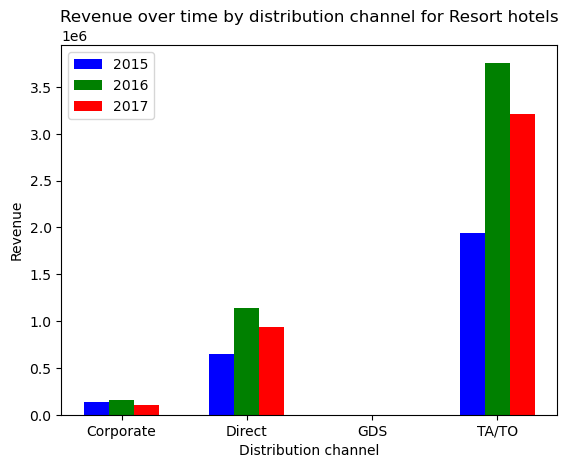

In [102]:
ms_data_b = ms_data_a[(ms_data_a.distribution_channel != 'Undefined')]

ms_data_b = ms_data_b.groupby(['hotel','arrival_date_year','distribution_channel'])['revenue'].sum()
ms_data_b = ms_data_b.reset_index()
ms_data_b = ms_data_b.sort_values(by = ['hotel','distribution_channel','arrival_date_year'])
ms_data_b = ms_data_b.reset_index(drop=True)

X = list(set(ms_data_b.distribution_channel))
X.sort()
val2015 = list(ms_data_a.loc[(ms_data_a.arrival_date_year == 2015) & (ms_data_a.hotel == 'Resort Hotel'),'revenue'])
val2015 = [133925.49, 648611.81, 0, 1944696.8]
val2016 = list(ms_data_a.loc[(ms_data_a.arrival_date_year == 2016) & (ms_data_a.hotel == 'Resort Hotel'),'revenue'])
val2016 = [157752.76, 1136363.89, 0, 3758126.49]
val2017 = list(ms_data_a.loc[(ms_data_a.arrival_date_year == 2017) & (ms_data_a.hotel == 'Resort Hotel'),'revenue'])
val2017 = [108193.43, 935952.27, 0, 3215511.78]
X_axis = np.arange(len(X))
plt.bar(X_axis - 0.2, val2015, 0.2, label = '2015', color = 'blue')
plt.bar(X_axis, val2016, 0.2, label = '2016', color = 'green')
plt.bar(X_axis + 0.2, val2017, 0.2, label = '2017', color = 'red')

plt.xticks(X_axis, X)
plt.xlabel("Distribution channel")
plt.ylabel("Revenue")
plt.title("Revenue over time by distribution channel for Resort hotels")
plt.legend()
plt.show();

### Time series prediction

In [96]:
adr0 = data[data.adr == 0]
adr0['Stay'] = (adr0.stays_in_weekend_nights + adr0.stays_in_week_nights)
pd.crosstab(adr0.reservation_status, adr0.Stay)

Stay
reservation_status


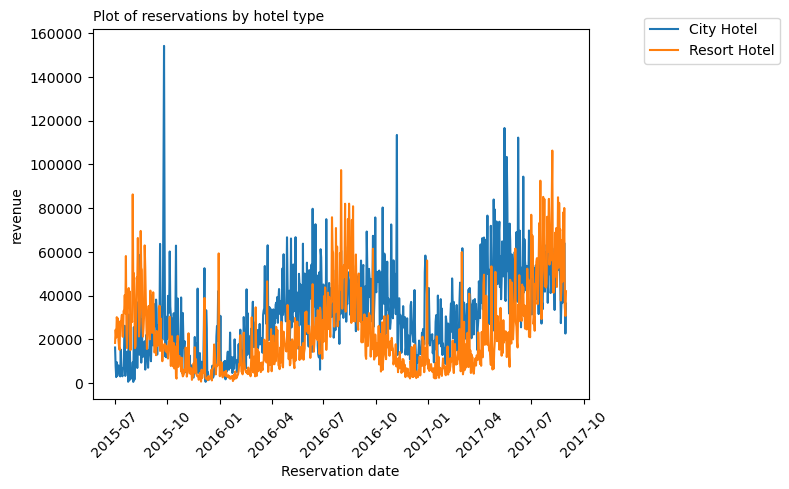

In [97]:
time_df = data.groupby(['arrival_date', 'hotel'])['revenue'].sum()
time_df = time_df.reset_index()
time_df.arrival_date = pd.to_datetime(time_df.arrival_date)

sns.lineplot(data=time_df, x="arrival_date", y="revenue", hue="hotel")
plt.title("Plot of reservations by hotel type", loc='left', fontsize=10, fontweight=0, color='black')
plt.xlabel("Reservation date")
plt.legend(bbox_to_anchor=(1.4, 1.05))
plt.xticks(rotation=45)
plt.show()

In [98]:
ch_time = time_df[time_df.hotel == 'City Hotel']
print(ch_time.shape)


(793, 3)


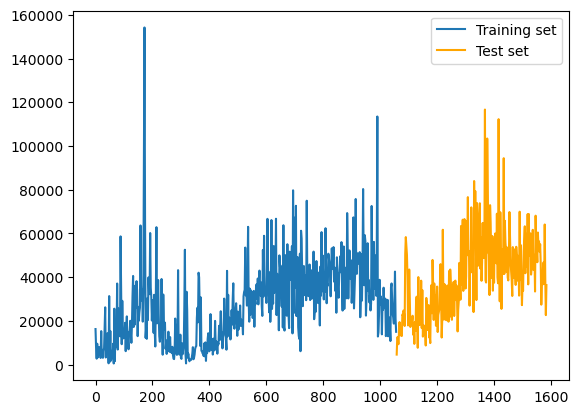

In [99]:
test_size = int(ch_time.shape[0]/3)

ch_df_train = ch_time[:-test_size]
ch_df_test = ch_time[-test_size:]

plt.plot(ch_df_train.revenue, label='Training set')
plt.plot(ch_df_test.revenue, label='Test set', color='orange')
plt.legend();
plt.show()

### Occupancy

In [100]:
print(list(data.columns))

['hotel', 'is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_month', 'arrival_date_week_number', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'reserved_room_type', 'assigned_room_type', 'booking_changes', 'deposit_type', 'agent', 'company', 'days_in_waiting_list', 'customer_type', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'reservation_status', 'reservation_status_date', 'weekdates', 'arrival_date', 'arrival_month', 'revenue', 'total_stay', 'Val', 'Guests']


In [101]:
occ_data = data[(data.reservation_status == 'Check-Out')]
occ_data = occ_data.reset_index()

date_lst = []
guest_lst = []
country_lst = []
hotel_lst = []

for i in tqdm(range(occ_data.shape[0])):
    dset = occ_data.iloc[i,:]
    for j in range(dset.total_stay):
        date_lst.append(dset.arrival_date + relativedelta(days=j))
        guest_lst.append(dset.reserved_room_type)
        hotel_lst.append(dset.hotel)
    
dset_g = pd.DataFrame(date_lst, columns = ['arrival_date'])
dset_g['guests'] = guest_lst
dset_g['hotel'] = hotel_lst

dset_ga = pd.merge(dset_g,data[['weekdates','arrival_date']], on = 'arrival_date', how = 'inner')

print(occ_data.shape,dset_ga.shape)
dset_ga.head()

100%|██████████| 73251/73251 [00:42<00:00, 1723.27it/s]


(73251, 39) (39787007, 4)


,arrival_date,guests,hotel,weekdates
0,2015-07-01,A,Resort Hotel,2015-06-28
1,2015-07-01,A,Resort Hotel,2015-06-28
2,2015-07-01,A,Resort Hotel,2015-06-28
3,2015-07-01,A,Resort Hotel,2015-06-28
4,2015-07-01,A,Resort Hotel,2015-06-28


In [102]:
occ_df = dset_ga.groupby(['arrival_date', 'hotel', 'guests']).size()
occ_df = occ_df.reset_index()
occ_df.arrival_date = pd.to_datetime(occ_df.arrival_date)
occ_df.columns = ['arrival_date','hotel','room','Count']
occ_df.head()

,arrival_date,hotel,room,Count
0,2015-07-01,City Hotel,A,7616
1,2015-07-01,Resort Hotel,A,2142
2,2015-07-01,Resort Hotel,C,238
3,2015-07-01,Resort Hotel,D,1190
4,2015-07-01,Resort Hotel,E,357


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


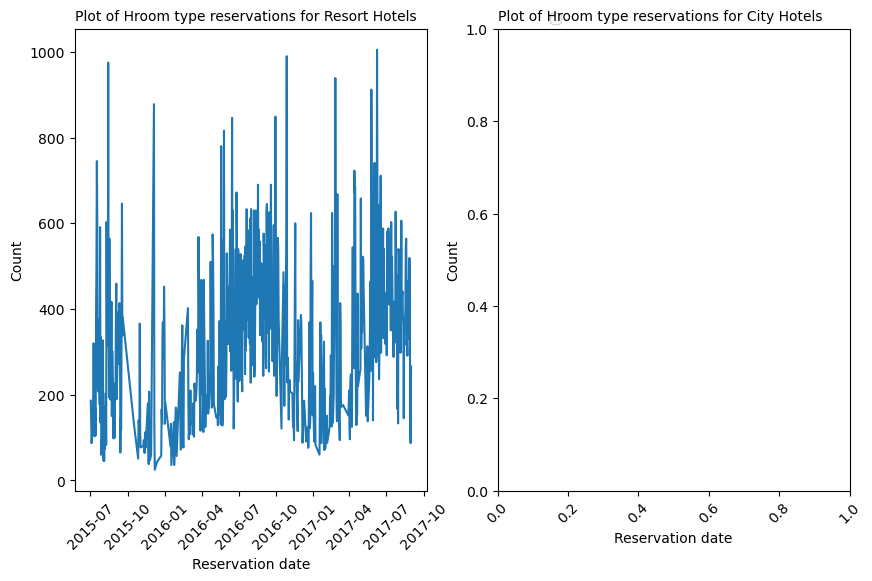

In [103]:
plt.show();
plot_occ('H')    

(570, 4)


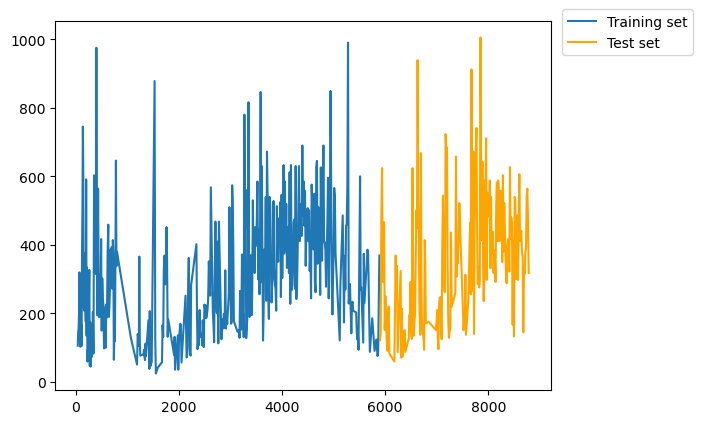

In [104]:
occ_df_ch = occ_df[(occ_df.hotel == 'Resort Hotel') & (occ_df.room == 'H')]
occ_df_ch = occ_df_ch.sort_values(by = 'arrival_date')
occ_df_cha = occ_df_ch.iloc[2:-10,:]
print(occ_df_cha.shape)

test_size = int(occ_df_cha.shape[0]/3)

ch_df_train = occ_df_cha[:-test_size]
ch_df_test = occ_df_cha[-test_size:]

plt.plot(ch_df_train.Count, label='Training set')
plt.plot(ch_df_test.Count, label='Test set', color='orange')
plt.legend(bbox_to_anchor=(1.3, 1.05));
plt.show()

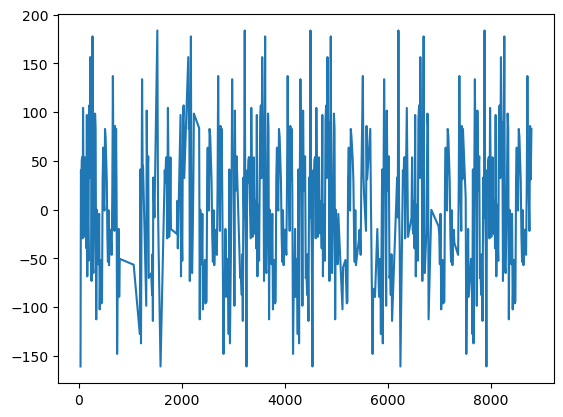

In [105]:
result = seasonal_decompose(occ_df_cha['Count'], model='additive', period=100)
result.seasonal.plot()
plt.show();

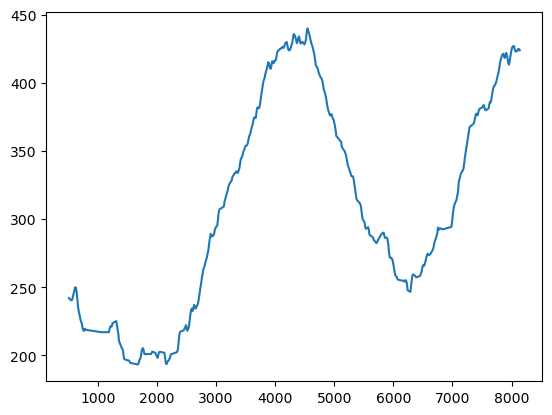

In [106]:
result.trend.plot()
plt.show();

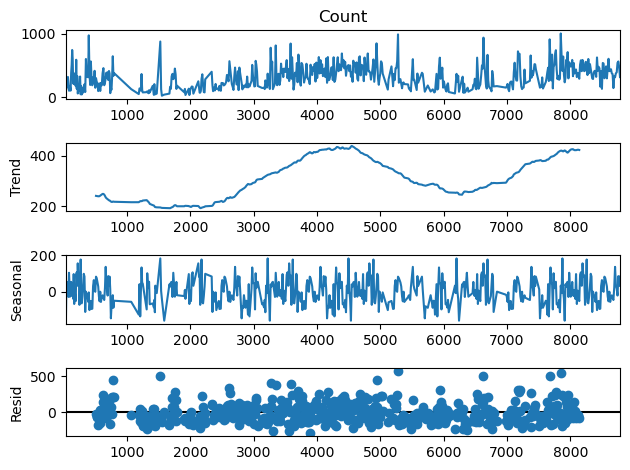

In [107]:
result = seasonal_decompose(occ_df_cha['Count'], model='additive', period=100)
result.plot();
plt.show();

In [108]:
occ_df_cha.head()

,arrival_date,hotel,room,Count
36,2015-07-05,Resort Hotel,H,106
44,2015-07-06,Resort Hotel,H,146
52,2015-07-07,Resort Hotel,H,156
60,2015-07-08,Resort Hotel,H,201
68,2015-07-09,Resort Hotel,H,320


In [109]:
add_datepart(ch_df_train, 'arrival_date', drop = False)
add_datepart(ch_df_test, 'arrival_date', drop = False)

ch_train_ph = train_dset(ch_df_train)
ch_test_ph = train_dset(ch_df_test)
ch_train_ph.head()


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

,ds,y,Year,Month,Week,Day,Dayofweek,Dayofyear,Is_month_end,Is_month_start,Is_quarter_end,Is_quarter_start,Is_year_end,Is_year_start
0,2015-07-05,106,2015,7,27,5,6,186,0,0,0,0,0,0
1,2015-07-06,146,2015,7,28,6,0,187,0,0,0,0,0,0
2,2015-07-07,156,2015,7,28,7,1,188,0,0,0,0,0,0
3,2015-07-08,201,2015,7,28,8,2,189,0,0,0,0,0,0
4,2015-07-09,320,2015,7,28,9,3,190,0,0,0,0,0,0


In [109]:
import logging
logger = logging.getLogger('cmdstanpy')
logger.addHandler(logging.NullHandler())
logger.propagate = False
logger.setLevel(logging.CRITICAL)

In [ ]:

cha_res = cap_floor(ch_train_ph, ch_test_ph, 'Babycare', initial = '300 days', period = '30 days', 
                    horizon =  '60 days') 


In [ ]:
###############
### Results ###
###############
        
res_dset = pd.DataFrame()

res_dset = res_data(cha_res,'smape','Room A',res_dset) 
res_dset

### Clustering

In [23]:
print(list(data.columns))

['hotel', 'is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_month', 'arrival_date_week_number', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'reserved_room_type', 'assigned_room_type', 'booking_changes', 'deposit_type', 'agent', 'company', 'days_in_waiting_list', 'customer_type', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'reservation_status', 'reservation_status_date', 'weekdates', 'arrival_date', 'arrival_month', 'revenue', 'total_stay', 'Val']


In [24]:
clust_data = data[data.reservation_status == 'Check-Out']
clust_data = clust_data.drop(['Val','is_canceled','reservation_status','arrival_month','reservation_status_date'], axis = 1)
clust_data.agent = clust_data.agent.astype(str)
clust_data.agent = clust_data.agent.str.replace('.0','')
clust_data.customer_type = clust_data.customer_type.str.replace('-','_')
clust_data.market_segment = clust_data.market_segment.str.replace(' ','_')
clust_data.distribution_channel = clust_data.distribution_channel.str.replace('/','_')
clust_data.arrival_date_year = clust_data.arrival_date_year.astype(str)
clust_data.loc[~clust_data.company.isna(), 'company'] = 1
clust_data.loc[clust_data.company.isna(), 'company'] = 0

### Categorical data ###

cat_cols = list(clust_data.select_dtypes(include=['object']))
print('Object data: ', cat_cols)

print('Datetime data: ',list(clust_data.select_dtypes(include=['datetime']).columns))

print('Timedelta data: ',list(clust_data.select_dtypes(include=['timedelta']).columns))

### Numerical data ###

num_cols = list(clust_data.select_dtypes(include=['number'], exclude=['datetime', 'timedelta']).columns)
print('Numeric data: ', num_cols)

The default value of regex will change from True to False in a future version.


Object data:  ['hotel', 'arrival_date_year', 'arrival_date_month', 'meal', 'country', 'market_segment', 'distribution_channel', 'reserved_room_type', 'assigned_room_type', 'deposit_type', 'agent', 'customer_type']
Datetime data:  ['weekdates', 'arrival_date']
Timedelta data:  []
Numeric data:  ['lead_time', 'arrival_date_week_number', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'company', 'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'revenue', 'total_stay']


In [25]:
num_data = clust_data[list(clust_data.select_dtypes(include=['number'], exclude=['datetime', 'timedelta']).columns)]
print(num_data.shape)
# (74869, 21)
num_data.describe()

(73251, 18)


,lead_time,arrival_date_week_number,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,revenue,total_stay
count,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000,73251.000000
mean,80.989584,27.036518,0.941311,2.492976,1.843552,0.099644,0.010048,0.037419,0.014252,0.187028,0.286167,0.071494,1.600825,102.424139,0.100340,0.715785,354.258804,3.434288
std,91.187412,13.863500,0.986549,1.897068,0.495483,0.383654,0.101498,0.189788,0.264514,1.754455,0.707670,0.257650,14.871308,47.276996,0.304651,0.832611,322.394464,2.534708
min,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.260000,0.000000,0.000000,1.000000,1.000000
25%,9.000000,16.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,70.000000,0.000000,0.000000,147.000000,2.000000
50%,47.000000,28.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,94.500000,0.000000,1.000000,264.600000,3.000000
75%,126.000000,38.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,126.000000,0.000000,1.000000,447.000000,4.000000
max,709.000000,53.000000,19.000000,50.000000,4.000000,3.000000,2.000000,1.000000,13.000000,72.000000,18.000000,1.000000,379.000000,510.000000,8.000000,5.000000,7590.000000,69.000000


In [26]:
#####################
### Normalisation ###
#####################

numerical_features = pd.DataFrame(MinMaxScaler(feature_range=(0, 1)).fit_transform(
    num_data[num_cols]), index=num_data.index, columns=num_cols)

print(
    f'Data min:max {numerical_features.min().min(),numerical_features.max().max()}')

Data min:max (0.0, 1.0000000000000002)


In [27]:
################################### 
### High cardinality adjustment ###
################################### 

card_vars = []
cat_data = clust_data[cat_cols]
cat_data_vals = cat_data.copy()
for i in range(cat_data.shape[1]):
    
    if (len(list(set(cat_data.iloc[:,i]))) > 60):
        print(cat_data.columns[i],len(list(set(cat_data.iloc[:,i]))))        

        a = pd.crosstab(cat_data[cat_data.columns[i]],columns='Count')        
        a = pd.DataFrame(a).sort_values('Count',ascending=False).reset_index()
        val_list = list(a.iloc[:20,0])
        cat_data_vals.loc[~cat_data_vals[cat_data.columns[i]].isin(val_list),cat_data.columns[i]] = 'Other'
        
    elif cat_data.iloc[:,i].nunique() > 100:
        print(cat_data.columns[i],len(list(set(cat_data.iloc[:,i]))))     
        card_vars.append(cat_data.columns[i])

print(card_vars)

country 166
agent 264
[]


In [28]:
print(cat_data_vals.shape)
print(list(cat_data_vals.columns))

(73251, 12)
['hotel', 'arrival_date_year', 'arrival_date_month', 'meal', 'country', 'market_segment', 'distribution_channel', 'reserved_room_type', 'assigned_room_type', 'deposit_type', 'agent', 'customer_type']


In [29]:
ohe = OneHotEncoder()

transformed_dset = ohe.fit_transform(cat_data_vals[cat_cols])
cat_data = pd.DataFrame(transformed_dset.toarray())
cat_data.columns = ohe.get_feature_names_out(input_features=cat_data_vals[cat_cols].columns)

In [30]:
print(cat_data.shape)
print(list(cat_data.columns))
print(
    f'Data min:max {cat_data.min().min(),cat_data.max().max()}')

(73251, 102)
['hotel_City Hotel', 'hotel_Resort Hotel', 'arrival_date_year_2015', 'arrival_date_year_2016', 'arrival_date_year_2017', 'arrival_date_month_April', 'arrival_date_month_August', 'arrival_date_month_December', 'arrival_date_month_February', 'arrival_date_month_January', 'arrival_date_month_July', 'arrival_date_month_June', 'arrival_date_month_March', 'arrival_date_month_May', 'arrival_date_month_November', 'arrival_date_month_October', 'arrival_date_month_September', 'meal_BB', 'meal_FB', 'meal_HB', 'meal_SC', 'meal_Undefined', 'country_AUT', 'country_BEL', 'country_BRA', 'country_CHE', 'country_CHN', 'country_CN', 'country_DEU', 'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL', 'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR', 'country_Other', 'country_POL', 'country_PRT', 'country_SWE', 'country_USA', 'country_Unknown', 'market_segment_Aviation', 'market_segment_Complementary', 'market_segment_Corporate', 'market_segment_Direct', 'market_segment_Groups

In [31]:
numerical_features = numerical_features.reset_index(drop=True)
cat_data = cat_data.reset_index(drop=True)
print(list(numerical_features.columns))
print(list(cat_data.columns))
all_data = pd.concat([numerical_features,cat_data], axis = 1)
print(all_data.shape)

['lead_time', 'arrival_date_week_number', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'company', 'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'revenue', 'total_stay']
['hotel_City Hotel', 'hotel_Resort Hotel', 'arrival_date_year_2015', 'arrival_date_year_2016', 'arrival_date_year_2017', 'arrival_date_month_April', 'arrival_date_month_August', 'arrival_date_month_December', 'arrival_date_month_February', 'arrival_date_month_January', 'arrival_date_month_July', 'arrival_date_month_June', 'arrival_date_month_March', 'arrival_date_month_May', 'arrival_date_month_November', 'arrival_date_month_October', 'arrival_date_month_September', 'meal_BB', 'meal_FB', 'meal_HB', 'meal_SC', 'meal_Undefined', 'country_AUT', 'country_BEL', 'country_BRA', 'country_CHE', 'country_CHN', 'country_CN', 'country_DEU', 'country_ES

100%|██████████| 19/19 [00:47<00:00,  2.48s/it]


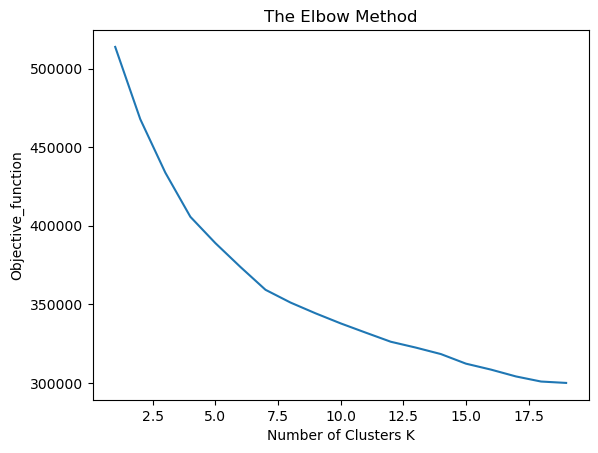

In [32]:
objective_function = []
for i in tqdm(range(1, 20)):
    clustering = KMeans(n_clusters=i, init='k-means++')
    clustering.fit(all_data)
    objective_function.append(clustering.inertia_)
    
plt.plot(range(1, 20), objective_function)
plt.title('The Elbow Method')
plt.xlabel('Number of Clusters K')
plt.ylabel('Objective_function')
plt.show()

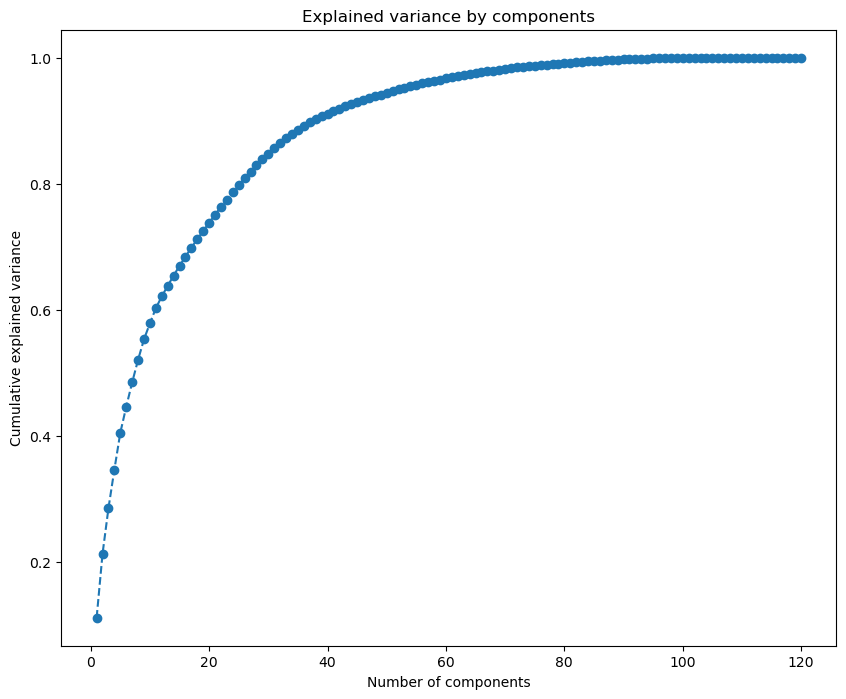

In [33]:
###########
### PCA ###
###########

pca = PCA()
pca.fit(all_data)

plt.figure(figsize=(10,8))
plt.plot(range(1,len(pca.explained_variance_ratio_.cumsum())+1), pca.explained_variance_ratio_.cumsum(),
         marker='o',linestyle='--')
plt.title("Explained variance by components")
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.show();

In [34]:
pca = PCA(n_components=25)
pca.fit(all_data)
scores_pca = pca.transform(all_data)

100%|██████████| 39/39 [01:12<00:00,  1.85s/it]


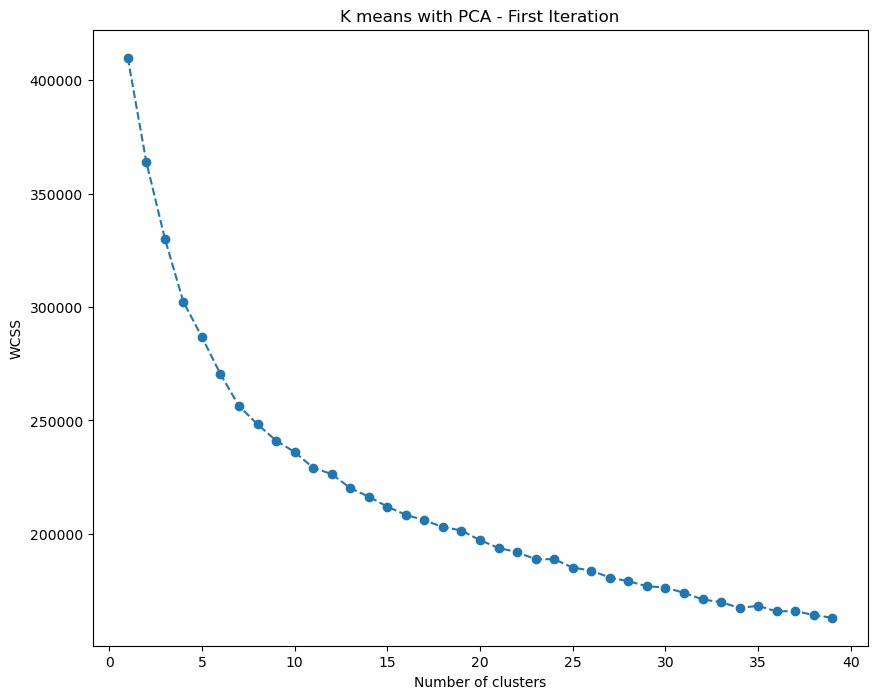

In [35]:
wcss = []
for i in tqdm(range(1,40)):
    kmeans_pca = KMeans(n_clusters = i, init = "k-means++", random_state = 42)
    kmeans_pca.fit(scores_pca)
    wcss.append(kmeans_pca.inertia_)
    
plt.figure(figsize=(10, 8))
plt.plot(range(1, len(wcss)+1), wcss,
         marker='o', linestyle='--')
plt.title("K means with PCA - First Iteration")
plt.xlabel("Number of clusters")
plt.ylabel("WCSS")
plt.show();

In [36]:
tuned_clustering = KMeans(n_clusters=10, init='k-means++', random_state=0)
labels = tuned_clustering.fit_predict(all_data)

metrics.silhouette_score(
    all_data, tuned_clustering.labels_, metric='euclidean')

# 0.1158537989474098

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


0.1158537989474098

In [37]:
tuned_clustering = KMeans(n_clusters=5, init='k-means++', random_state=0)
labels = tuned_clustering.fit_predict(all_data)

metrics.silhouette_score(
    all_data, tuned_clustering.labels_, metric='euclidean')

# 0.09154681398867756

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


0.09154681398867756

In [38]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(all_data)

In [37]:
kmeans_pca = KMeans(n_clusters=10, init="k-means++", random_state=42)
kmeans_pca.fit(scores_pca)
df_segm_pca_means = pd.concat(
    [all_data.reset_index(drop=True), pd.DataFrame(scores_pca)],axis=1)

df_segm_pca_means.columns.values[-10:] = ['Component 1', 'Component 2','Component 3',
                                         'Component 4','Component 5','Component 6',
                                         'Component 7','Component 8',
                                         'Component 9','Component 10']
df_segm_pca_means['Clusters'] = kmeans_pca.labels_

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


In [38]:
pd.crosstab(kmeans_pca.labels_, columns='Count')

col_0,Count
row_0,
0,6314
1,8530
2,6820
3,9719
4,10437
5,6332
6,8753
7,4524
8,4997


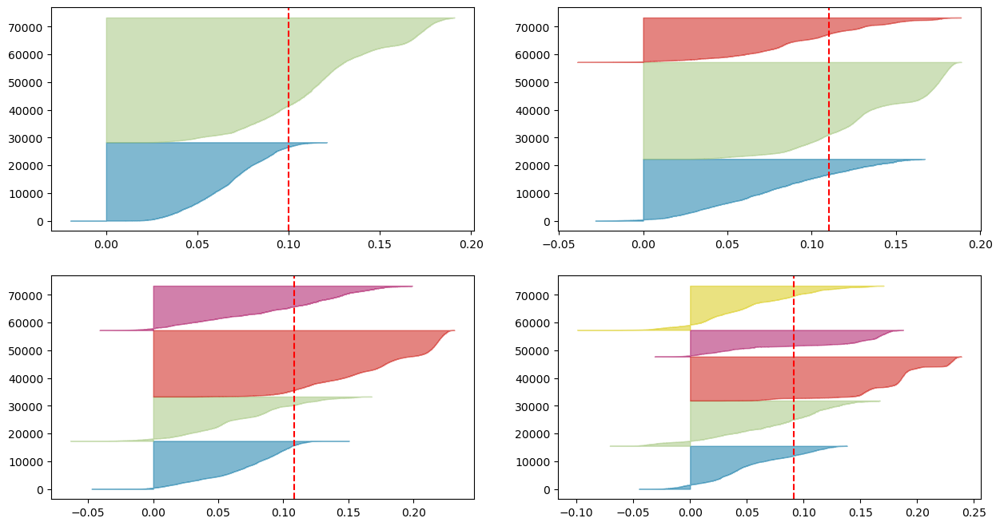

In [ ]:
x_axis = df_segm_pca_means['Component 1']
y_axis = df_segm_pca_means['Component 2']
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=x_axis, y=y_axis, hue=df_segm_pca_means['Clusters'], palette="bright")
plt.title("K means with PCA")
plt.show()

#### Calculate important columns

In [39]:
print(list(all_data.columns))

['lead_time', 'arrival_date_week_number', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'company', 'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'revenue', 'total_stay', 'hotel_City Hotel', 'hotel_Resort Hotel', 'arrival_date_year_2015', 'arrival_date_year_2016', 'arrival_date_year_2017', 'arrival_date_month_April', 'arrival_date_month_August', 'arrival_date_month_December', 'arrival_date_month_February', 'arrival_date_month_January', 'arrival_date_month_July', 'arrival_date_month_June', 'arrival_date_month_March', 'arrival_date_month_May', 'arrival_date_month_November', 'arrival_date_month_October', 'arrival_date_month_September', 'meal_BB', 'meal_FB', 'meal_HB', 'meal_SC', 'meal_Undefined', 'country_AUT', 'country_BEL', 'country_BRA', 'country_CHE', 'country_CHN', 'country_CN', 'country_DEU', 'country_ESP

In [40]:
a = list(all_data.columns)
try:
    a.remove('index')
except:
    a = list(all_data.columns)

clust_check = df_segm_pca_means.groupby(['Clusters']).mean()
clust_checks = clust_check[a]
print(clust_checks.shape)
clust_checks

(10, 120)


,lead_time,arrival_date_week_number,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,...,agent_8,agent_83,agent_85,agent_9,agent_Other,agent_nan,customer_type_Contract,customer_type_Group,customer_type_Transient,customer_type_Transient_Party
Clusters,,,,,,,,,,,,,,,,,,,,,
0,0.162111,0.520793,0.094719,0.088733,0.300655,0.014571,0.008473,0.019164,0.000037,0.000504,...,0.045455,0.001109,0.000000,0.000000,0.495407,0.013145,0.245803,0.013621,0.623693,0.116883
1,0.104767,0.497234,0.048615,0.048525,0.394568,0.086479,0.003400,0.004807,0.000604,0.000275,...,0.031067,0.014068,0.010434,0.744314,0.038101,0.004924,0.035522,0.009965,0.887925,0.066589
2,0.086573,0.491343,0.056482,0.055897,0.314907,0.080890,0.006965,0.031085,0.000056,0.000957,...,0.000440,0.000000,0.000000,0.000000,0.030352,0.012023,0.000147,0.006158,0.894428,0.099267
3,0.087159,0.577297,0.044135,0.042175,0.280070,0.016085,0.002830,0.006276,0.001678,0.000293,...,0.038276,0.005968,0.000000,0.761704,0.051651,0.007202,0.080975,0.003395,0.829818,0.085811
4,0.066131,0.485403,0.043721,0.045601,0.288046,0.057264,0.011929,0.056817,0.000516,0.001954,...,0.000096,0.000000,0.000096,0.000192,0.004982,0.489796,0.001246,0.009198,0.901121,0.088435
5,0.119580,0.336748,0.044777,0.044880,0.285850,0.023479,0.002448,0.006001,0.000000,0.000233,...,0.030638,0.016740,0.012634,0.746052,0.036639,0.006475,0.000000,0.004106,0.948989,0.046905
6,0.177956,0.547419,0.041381,0.043798,0.259492,0.007274,0.002399,0.008454,0.000185,0.000398,...,0.000000,0.023535,0.030732,0.000000,0.479950,0.004913,0.010282,0.005712,0.395979,0.588027
7,0.097627,0.516591,0.056645,0.055203,0.288830,0.011568,0.009063,0.029620,0.000017,0.000789,...,0.001105,0.000000,0.000000,0.000000,0.056808,0.011715,0.000000,0.009505,0.864058,0.126437
8,0.043505,0.499011,0.026490,0.034409,0.082783,0.003469,0.001101,0.286972,0.010237,0.029131,...,0.000200,0.000000,0.000000,0.000800,0.081449,0.904142,0.003802,0.005603,0.641585,0.349009


In [41]:
for name in a:
    
    mean_val = np.mean(clust_checks[name])
    print(name, mean_val)
    clust_checks[str('Index_') + str(name)] = (clust_checks[name]/mean_val) * 100

lead_time 0.11430151959925579
arrival_date_week_number 0.4964868515356692
stays_in_weekend_nights 0.05026017310150692
stays_in_week_nights 0.05063716055593823
adults 0.2737739923205511
children 0.0303373468311179
babies 0.004904609168720311
is_repeated_guest 0.04540314923446258
previous_cancellations 0.0013329447973729179
previous_bookings_not_canceled 0.003466392068710565
booking_changes 0.015910946123393475
company 0.0993660442983548
days_in_waiting_list 0.0041251935425688615
adr 0.19556838699895723
required_car_parking_spaces 0.01309198296468396
total_of_special_requests 0.14219856165012296
revenue 0.046185450829392724
total_stay 0.036570607598905056
hotel_City Hotel 0.5595776321005799
hotel_Resort Hotel 0.44042236789942
arrival_date_year_2015 0.18293481680461307
arrival_date_year_2016 0.4638306673879778
arrival_date_year_2017 0.3532345158074091
arrival_date_month_April 0.08743315461097169
arrival_date_month_August 0.11306429049886224
arrival_date_month_December 0.05529456705029503



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [42]:
import_col = []
index_col = [col for col in clust_checks if col.startswith('Index')]
for name in index_col:
    if ((min(clust_checks[name]) < 60) | (max(clust_checks[name]) > 250)) & (min(clust_checks[name]) != 0):
        import_col.append(name)
        


In [43]:
print(len(import_col), import_col)

54 ['Index_lead_time', 'Index_stays_in_weekend_nights', 'Index_adults', 'Index_children', 'Index_babies', 'Index_is_repeated_guest', 'Index_previous_bookings_not_canceled', 'Index_company', 'Index_required_car_parking_spaces', 'Index_total_of_special_requests', 'Index_revenue', 'Index_total_stay', 'Index_arrival_date_month_August', 'Index_arrival_date_month_January', 'Index_arrival_date_month_July', 'Index_arrival_date_month_June', 'Index_meal_HB', 'Index_meal_SC', 'Index_country_AUT', 'Index_country_BEL', 'Index_country_BRA', 'Index_country_CHE', 'Index_country_CHN', 'Index_country_CN', 'Index_country_DEU', 'Index_country_ESP', 'Index_country_FRA', 'Index_country_GBR', 'Index_country_IRL', 'Index_country_ITA', 'Index_country_NLD', 'Index_country_NOR', 'Index_country_Other', 'Index_country_PRT', 'Index_country_SWE', 'Index_country_USA', 'Index_market_segment_Direct', 'Index_market_segment_Groups', 'Index_market_segment_Online_TA', 'Index_distribution_channel_Direct', 'Index_distributio

In [44]:
print(clust_checks.shape)

(10, 240)


In [45]:
cluster_index = pd.concat(
    [clust_checks[import_col], df_segm_pca_means['Clusters']], axis=1)

In [46]:
import_cols = [re.sub('^Index_', "", x) for x in cluster_index.columns]
import_cols.remove('Clusters')
print(import_cols)

['lead_time', 'stays_in_weekend_nights', 'adults', 'children', 'babies', 'is_repeated_guest', 'previous_bookings_not_canceled', 'company', 'required_car_parking_spaces', 'total_of_special_requests', 'revenue', 'total_stay', 'arrival_date_month_August', 'arrival_date_month_January', 'arrival_date_month_July', 'arrival_date_month_June', 'meal_HB', 'meal_SC', 'country_AUT', 'country_BEL', 'country_BRA', 'country_CHE', 'country_CHN', 'country_CN', 'country_DEU', 'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL', 'country_ITA', 'country_NLD', 'country_NOR', 'country_Other', 'country_PRT', 'country_SWE', 'country_USA', 'market_segment_Direct', 'market_segment_Groups', 'market_segment_Online_TA', 'distribution_channel_Direct', 'distribution_channel_TA_TO', 'reserved_room_type_A', 'assigned_room_type_A', 'assigned_room_type_B', 'assigned_room_type_C', 'assigned_room_type_F', 'assigned_room_type_G', 'agent_1', 'agent_6', 'agent_Other', 'agent_nan', 'customer_type_Group', 'customer_type

#### Second PCA iteration

In [47]:
all_data2 = all_data[import_cols]
print(all_data2.shape)
print(
    f'Data min:max {all_data2.min().min(),all_data2.max().max()}')

(73251, 54)
Data min:max (0.0, 1.0)


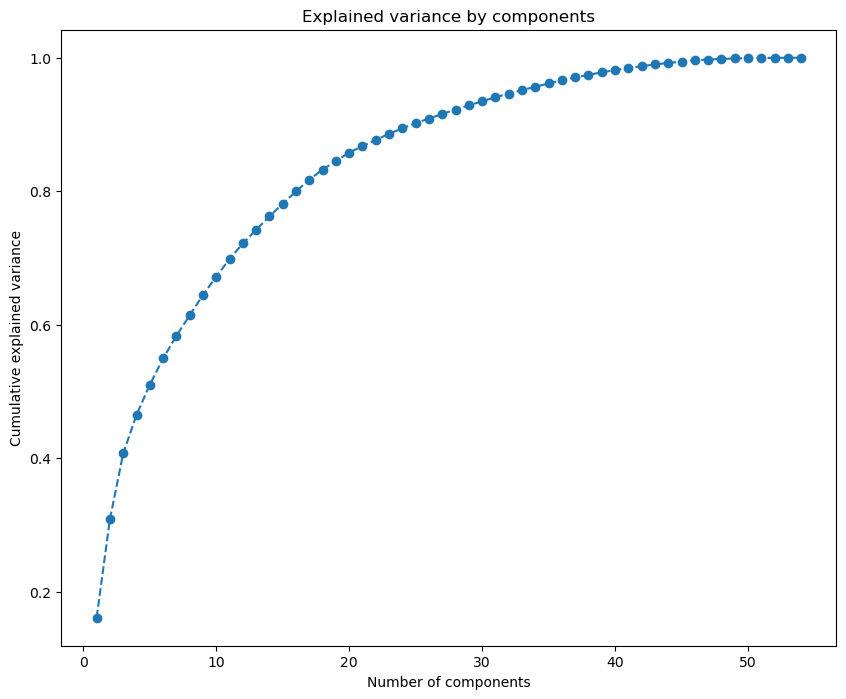

In [48]:
###########
### PCA ###
###########

pca2 = PCA()
pca2.fit(all_data2)
plt.figure(figsize=(10,8))
plt.plot(range(1,len(pca2.explained_variance_ratio_.cumsum())+1), pca2.explained_variance_ratio_.cumsum(),
         marker='o',linestyle='--')
plt.title("Explained variance by components")
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.show();

In [49]:
pca2 = PCA(n_components=15)
pca2.fit(all_data2)
scores_pca2 = pca2.transform(all_data2)

100%|██████████| 39/39 [00:56<00:00,  1.45s/it]


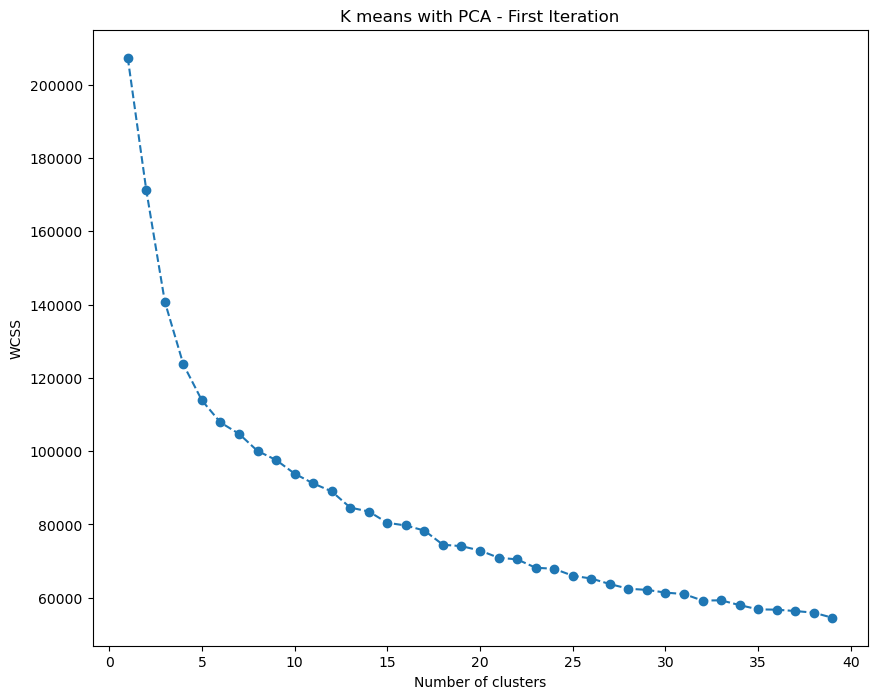

In [50]:
wcss = []
for i in tqdm(range(1,40)):
    kmeans_pca = KMeans(n_clusters = i, init = "k-means++", random_state = 42)
    kmeans_pca.fit(scores_pca2)
    wcss.append(kmeans_pca.inertia_)
    
plt.figure(figsize=(10, 8))
plt.plot(range(1, len(wcss)+1), wcss,
         marker='o', linestyle='--')
plt.title("K means with PCA - First Iteration")
plt.xlabel("Number of clusters")
plt.ylabel("WCSS")
plt.show();

In [51]:
kmeans_pca2 = KMeans(n_clusters=10, init="k-means++", random_state=42)
kmeans_pca2.fit(scores_pca2)
df_segm_pca_means2 = pd.concat(
    [all_data2.reset_index(drop=True), pd.DataFrame(scores_pca2)], axis=1)
df_segm_pca_means2.columns.values[-10:] = ['Component 1', 'Component 2','Component 3',
                                          'Component 4','Component 5','Component 6',
                                          'Component 7', 'Component 8','Component 9','Component 10']

df_segm_pca_means2['Clusters'] = kmeans_pca2.labels_

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


In [52]:
pd.crosstab(df_segm_pca_means2.Clusters, columns='Count')

col_0,Count
Clusters,
0,6973
1,15248
2,3849
3,3070
4,4265
5,12888
6,13801
7,6088
8,3160


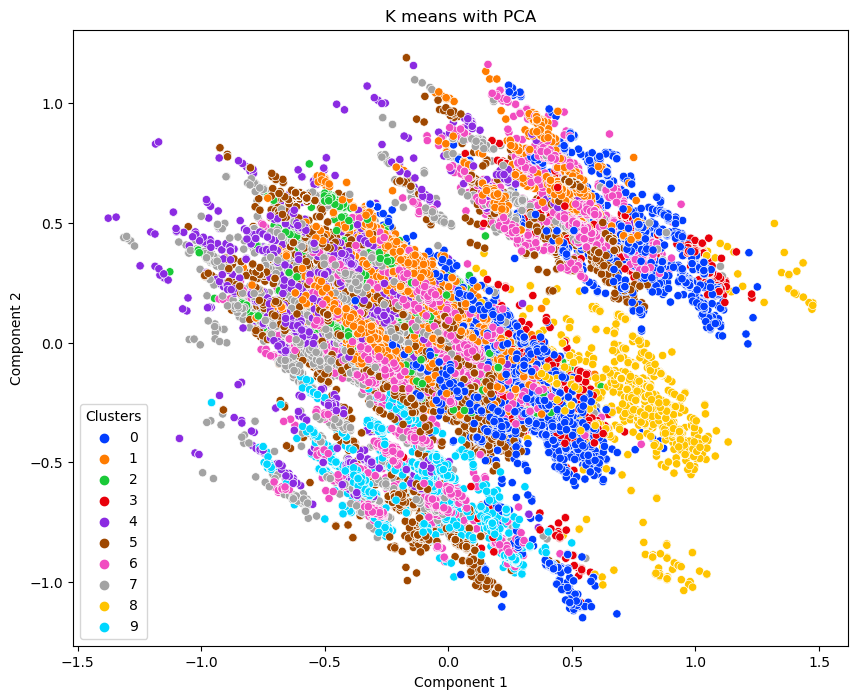

In [53]:
x_axis = df_segm_pca_means2['Component 1']
y_axis = df_segm_pca_means2['Component 2']
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=x_axis, y=y_axis, hue=df_segm_pca_means2['Clusters'], palette="bright")
plt.title("K means with PCA")
plt.show()

#### Important columns

In [54]:
a = list(all_data2.columns)
try:
    a.remove('index')
except:
    a = list(all_data2.columns)

clust_check2 = df_segm_pca_means2.groupby(['Clusters']).mean()
clust_checks2 = clust_check2[a]
print(clust_checks2.shape)
clust_checks2

(10, 54)


,lead_time,stays_in_weekend_nights,adults,children,babies,is_repeated_guest,previous_bookings_not_canceled,company,required_car_parking_spaces,total_of_special_requests,...,assigned_room_type_C,assigned_room_type_F,assigned_room_type_G,agent_1,agent_6,agent_Other,agent_nan,customer_type_Group,customer_type_Transient,customer_type_Transient_Party
Clusters,,,,,,,,,,,,,,,,,,,,,
0,0.133082,0.076264,0.290836,0.014819,0.006597,0.026101,0.001340,0.002581,0.006436,0.077614,...,0.033415,0.012620,0.004733,0.005306,0.058081,0.623978,0.005450,0.010182,0.857880,0.000000
1,0.096460,0.046633,0.279578,0.014494,0.003312,0.010756,0.000400,0.000656,0.009395,0.207030,...,0.001180,0.000787,0.000590,0.000000,0.001443,0.041579,0.005247,0.005378,0.939795,0.013969
2,0.065375,0.042007,0.317225,0.077942,0.010652,0.059496,0.001956,0.004157,0.025136,0.188361,...,0.057937,0.074305,0.062873,0.001819,0.020525,0.096389,0.013250,0.010652,0.876332,0.075604
3,0.132139,0.034579,0.183713,0.004777,0.001792,0.051140,0.003565,0.696091,0.013640,0.028730,...,0.052117,0.019218,0.013029,0.000651,0.000000,0.026384,0.970033,0.004235,0.000000,0.995765
4,0.063115,0.040489,0.254162,0.015006,0.007034,0.043142,0.001377,0.006096,0.015914,0.101055,...,0.000234,0.000000,0.000000,0.000000,0.000703,0.006565,0.484642,0.009613,0.893552,0.094021
5,0.203023,0.042242,0.241620,0.003776,0.001513,0.006595,0.000191,0.003647,0.002163,0.077778,...,0.025140,0.007449,0.002561,0.139898,0.117318,0.450419,0.004112,0.002483,0.000000,0.993017
6,0.114225,0.060976,0.364901,0.077265,0.004710,0.005434,0.000173,0.000797,0.015425,0.206782,...,0.029346,0.088689,0.057460,0.000580,0.007173,0.019636,0.006304,0.008985,0.867618,0.060430
7,0.068238,0.046321,0.314772,0.087111,0.015276,0.056176,0.002062,0.009198,0.031106,0.131767,...,0.067838,0.147011,0.081307,0.000164,0.000000,0.003121,0.485381,0.008870,0.911465,0.079336
8,0.023537,0.023701,0.047152,0.003270,0.000633,0.416456,0.041970,0.921203,0.020688,0.068038,...,0.021203,0.018987,0.009494,0.000316,0.000316,0.001582,0.993354,0.009494,0.988924,0.000000


In [55]:
for name in a:
    
    mean_val = np.mean(clust_checks2[name])
    print(name, mean_val)
    clust_checks2[str('Index_') + str(name)] = (clust_checks2[name]/mean_val) * 100

lead_time 0.09911478713000114
stays_in_weekend_nights 0.04651019818038244
adults 0.26064861038847115
children 0.03174766687026138
babies 0.0055483341045862175
is_repeated_guest 0.0677086264227817
previous_bookings_not_canceled 0.005315196360606001
company 0.16457053706546715
required_car_parking_spaces 0.014722597777752292
total_of_special_requests 0.12587587091596075
revenue 0.04352695440084557
total_stay 0.033590169450453074
arrival_date_month_August 0.10907997743228923
arrival_date_month_January 0.062154048239441095
arrival_date_month_July 0.09701365516043889
arrival_date_month_June 0.07695197097899635
meal_HB 0.10990467769377614
meal_SC 0.06650877422705934
country_AUT 0.010839856196607595
country_BEL 0.019834402944490737
country_BRA 0.012994050708719998
country_CHE 0.012464511004293615
country_CHN 0.004933919179991392
country_CN 0.010064649106736236
country_DEU 0.05711655885488896
country_ESP 0.0694980523750138
country_FRA 0.15107623881547214
country_GBR 0.11479141938241247
country


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [56]:
import_col2 = []
index_col = [col for col in clust_checks2 if col.startswith('Index')]
for name in index_col:
    if ((min(clust_checks2[name]) < 60) | (max(clust_checks2[name]) > 250)) & (min(clust_checks2[name]) != 0):
        import_col2.append(name)
        
print(len(import_col2), import_col2)

28 ['Index_lead_time', 'Index_stays_in_weekend_nights', 'Index_adults', 'Index_children', 'Index_babies', 'Index_is_repeated_guest', 'Index_previous_bookings_not_canceled', 'Index_company', 'Index_required_car_parking_spaces', 'Index_total_of_special_requests', 'Index_revenue', 'Index_total_stay', 'Index_arrival_date_month_August', 'Index_arrival_date_month_January', 'Index_arrival_date_month_July', 'Index_arrival_date_month_June', 'Index_meal_HB', 'Index_meal_SC', 'Index_market_segment_Online_TA', 'Index_distribution_channel_Direct', 'Index_distribution_channel_TA_TO', 'Index_reserved_room_type_A', 'Index_assigned_room_type_A', 'Index_assigned_room_type_B', 'Index_assigned_room_type_C', 'Index_agent_Other', 'Index_agent_nan', 'Index_customer_type_Group']


In [57]:
clust_checks3 = clust_checks2.sort_values(by='Index_revenue')
clust_checks3[index_col]

,Index_lead_time,Index_stays_in_weekend_nights,Index_adults,Index_children,Index_babies,Index_is_repeated_guest,Index_previous_bookings_not_canceled,Index_company,Index_required_car_parking_spaces,Index_total_of_special_requests,...,Index_assigned_room_type_C,Index_assigned_room_type_F,Index_assigned_room_type_G,Index_agent_1,Index_agent_6,Index_agent_Other,Index_agent_nan,Index_customer_type_Group,Index_customer_type_Transient,Index_customer_type_Transient_Party
Clusters,,,,,,,,,,,,,,,,,,,,,
8,23.747107,50.958429,18.090217,10.300102,11.407233,615.070366,789.621565,559.761515,140.520657,54.051642,...,70.935481,50.987529,40.688447,2.102346,1.363059,1.218006,334.051450,130.120044,136.482869,0.000000
3,133.319292,74.347391,70.483152,15.048085,32.289529,75.529615,67.071193,422.974378,92.647136,22.823788,...,174.364233,51.607573,55.841691,4.327957,0.000000,20.310144,326.208629,58.038343,0.000000,422.166632
5,204.836641,90.824119,92.699559,11.894173,27.270084,9.740683,3.588690,2.215951,14.690782,61.789267,...,84.107608,20.002556,10.974010,929.397631,505.321894,346.723326,1.382928,34.030982,0.000000,421.001283
4,63.678858,87.053333,97.511274,47.266030,126.776750,63.716921,25.916093,3.704267,108.095188,80.281550,...,0.784435,0.000000,0.000000,0.000000,3.029731,5.053652,162.978595,131.757349,123.320455,39.861366
1,97.321049,100.262995,107.262283,45.652816,59.691967,15.884991,7.523152,0.398506,63.811257,164.471895,...,3.949439,2.113334,2.529686,0.000000,6.214578,32.006835,1.764356,73.707384,129.702549,5.922343
9,92.775709,111.569182,119.903439,59.897145,71.466650,2.644773,2.205954,0.777235,49.738809,136.327947,...,35.090858,8.930535,5.482028,11.896624,114.596016,22.646367,1.978661,42.075143,125.619042,19.739337
2,65.958685,90.317417,121.706098,245.505671,191.987671,87.870595,36.795911,2.525922,170.733450,149.639968,...,193.835246,199.534465,269.466263,12.082074,88.405856,74.198028,4.455859,145.997687,120.943807,32.053239
0,134.270708,163.972826,111.581674,46.677647,118.898277,38.548521,25.219913,1.568559,43.711967,61.658880,...,111.792342,33.889316,20.282955,35.251161,250.171141,480.325652,1.832623,139.556064,118.397341,0.000000
7,68.847223,99.592417,120.764975,274.386327,275.325033,82.967396,38.800916,5.589350,211.282514,104.680437,...,226.960984,394.773681,348.471688,1.091231,0.000000,2.402400,163.226989,121.570764,125.792656,33.635611


In [58]:
clust_checks3['Index_revenue']

Clusters
8     39.507019
3     66.730402
5     80.427909
4     91.648853
1     98.537983
9    100.546619
2    117.138541
0    117.973017
7    137.453717
6    150.035940
Name: Index_revenue, dtype: float64

In [ ]:
clust_checks3[index_col].to_csv('index_cols.csv', sep=';', index=False)

### Cancellation predictor

In [62]:
pd.crosstab(data.reservation_status, columns = 'Count')

col_0,Count
reservation_status,
Canceled,42746
Check-Out,73251
No-Show,1177


In [25]:
class_data = data.copy()

#class_data['Clusters'] = 'Cluster ' + df_segm_pca_means2['Clusters'].astype(str)
class_data.agent = class_data.agent.astype(str)
class_data.arrival_date_month = class_data.arrival_date_month.astype(str)
class_data.agent = class_data.agent.str.replace('.0','')
class_data.customer_type = class_data.customer_type.str.replace('-','_')
class_data.market_segment = class_data.market_segment.str.replace(' ','_')
class_data.distribution_channel = class_data.distribution_channel.str.replace('/','_')
class_data.arrival_date_year = class_data.arrival_date_year.astype(str)
class_data.loc[~class_data.company.isna(), 'company'] = 1
class_data.loc[class_data.company.isna(), 'company'] = 0
class_data.loc[~class_data.country.isin(list(set(adr_year_d.country))),'country'] = 'Other'
add_datepart(class_data, 'arrival_date', drop=False)
class_data = class_data.drop(['Val','arrival_month','reservation_status_date','reservation_status',
                             'arrival_date_year', 'arrival_Month','arrival_Elapsed','arrival_date_week_number',
                             'arrival_Week'], axis = 1)

### Categorical data ###

cat_cols = list(class_data.select_dtypes(include=['object']))
print('Object data: ', cat_cols)

print('Datetime data: ',list(class_data.select_dtypes(include=['datetime']).columns))

print('Timedelta data: ',list(class_data.select_dtypes(include=['timedelta']).columns))

### Numerical data ###

num_cols = list(class_data.select_dtypes(include=['number'], exclude=['datetime', 'timedelta']).columns)
print('Numeric data: ', num_cols)

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_20897/3692172063.py:6: FutureWarning: The default value of regex will change from True to False in a future version.
  class_data.agent = class_data.agent.str.replace('.0','')
/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_20897/3872412967.py:18: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  for n in attr: df[targ_pre + n] = getattr(fld.dt, n.lower())


Object data:  ['hotel', 'arrival_date_month', 'meal', 'country', 'market_segment', 'distribution_channel', 'reserved_room_type', 'assigned_room_type', 'deposit_type', 'agent', 'customer_type']
Datetime data:  ['weekdates', 'arrival_date']
Timedelta data:  []
Numeric data:  ['is_canceled', 'lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'company', 'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'revenue', 'total_stay', 'arrival_Year', 'arrival_Day', 'arrival_Dayofweek', 'arrival_Dayofyear']


In [26]:
check = class_data.isnull().sum()
check = pd.DataFrame(check)
check.columns = ['Count']
check['perc'] = check.Count/data.shape[0]*100
check[check.Count != 0]

,Count,perc


#### Cancellation over time

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_20897/3455082850.py:6: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=canc_rate, x="arrival_date", y="is_canceled",palette=['g', 'b'])
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


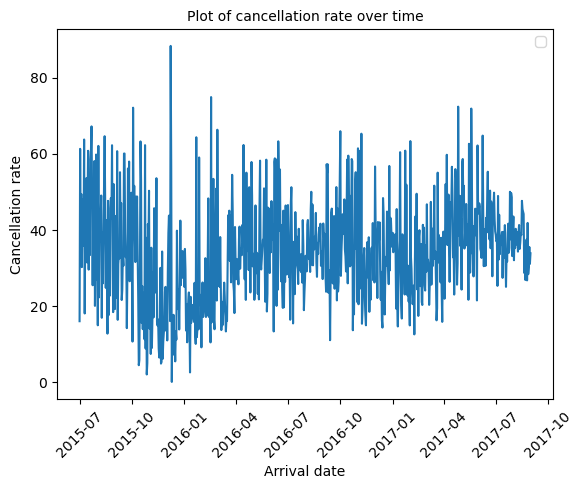

In [28]:
canc_rate = class_data.groupby(['arrival_date'])['is_canceled'].mean()
canc_rate = canc_rate.reset_index()
canc_rate['is_canceled'] = canc_rate['is_canceled'] * 100
canc_rate = canc_rate.sort_values(by = 'arrival_date')

sns.lineplot(data=canc_rate, x="arrival_date", y="is_canceled",palette=['g', 'b'])
plt.title("Plot of cancellation rate over time", loc='center', fontsize=10, fontweight=0, color='black')
plt.xlabel("Arrival date")
plt.xticks(rotation=45)
plt.legend()
plt.ylabel("Cancellation rate")
plt.show()

In [29]:
print(canc_rate.shape)

(793, 2)


In [30]:
canc_rate_mean = class_data.groupby(['arrival_date'])['is_canceled'].mean()
canc_rate_mean = canc_rate_mean.reset_index()
canc_rate_count = class_data.groupby(['arrival_date'])['is_canceled'].count()
canc_rate_count = canc_rate_count.reset_index()
canc_rate_sum = class_data.groupby(['arrival_date'])['is_canceled'].sum()
canc_rate_sum = canc_rate_sum.reset_index()
canc_rate_all1 = pd.merge(canc_rate_mean, canc_rate_count, on = 'arrival_date', how = 'inner')
canc_rate_all = pd.merge(canc_rate_all1, canc_rate_sum, on = 'arrival_date', how = 'inner')
canc_rate_all.head()

,arrival_date,is_canceled_x,is_canceled_y,is_canceled
0,2015-07-01,0.159664,119,19
1,2015-07-02,0.612903,93,57
2,2015-07-03,0.339286,56,19
3,2015-07-04,0.494253,87,43
4,2015-07-05,0.301887,53,16


In [76]:
pd.crosstab(data.is_canceled, columns = 'Count')

col_0,Count
is_canceled,
0,73251
1,43923


#### Test/Train/OOT split

In [33]:
print('Date ranges for all data are ',min(canc_rate_all.arrival_date),max(canc_rate_all.arrival_date))
X_oot = class_data[class_data.arrival_date >= '2017-07-01']

y_oot = X_oot.is_canceled
X_oot = X_oot.drop(['is_canceled'], axis = 1)

print('Date ranges for OOT set are ',min(X_oot.arrival_date),max(X_oot.arrival_date))
testtrain = class_data[class_data.arrival_date < '2017-07-01']

y = testtrain.is_canceled
X = testtrain.drop(['is_canceled'], axis = 1)

X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.4,
                                                    stratify = y,
                                                    random_state = 222)

print(X_train.shape, X_test.shape)
# (64215, 34) (42811, 34)

print('Cancellation rate train (%): ', round(y_train[y_train == 1].shape[0]/y_train.shape[0]*100,2))
print('Cancellation rate test (%): ', round(y_test[y_test == 1].shape[0]/y_test.shape[0]*100,2))

X_train = X_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

Date ranges for all data are  2015-07-01 00:00:00 2017-08-31 00:00:00
Date ranges for OOT set are  2017-07-01 00:00:00 2017-08-31 00:00:00
(64215, 40) (42811, 40)
Cancellation rate train (%):  37.5
Cancellation rate test (%):  37.5


In [34]:
#########################################
### Check for single non varying data ###
#########################################

lst = []
for name in list(X_train.columns):
    if (X_train[name].nunique() == 1):
        lst.append(name)

print(lst)

################################
### Remove non zero variance ###
################################

#num_cols = list(X_train.select_dtypes(include=['number'], exclude=['datetime', 'timedelta']).columns)
#variance = X_train[num_cols].var()

#variable = [ ]

#for i in range(len(columns)):
#    if variance[i] < 0.006:
#        variable.append(num_cols[i])
#    elif str(variance[i]) == 'nan':
#        variable.append(num_cols[i])

#print(variable)

[]


['total_stay']


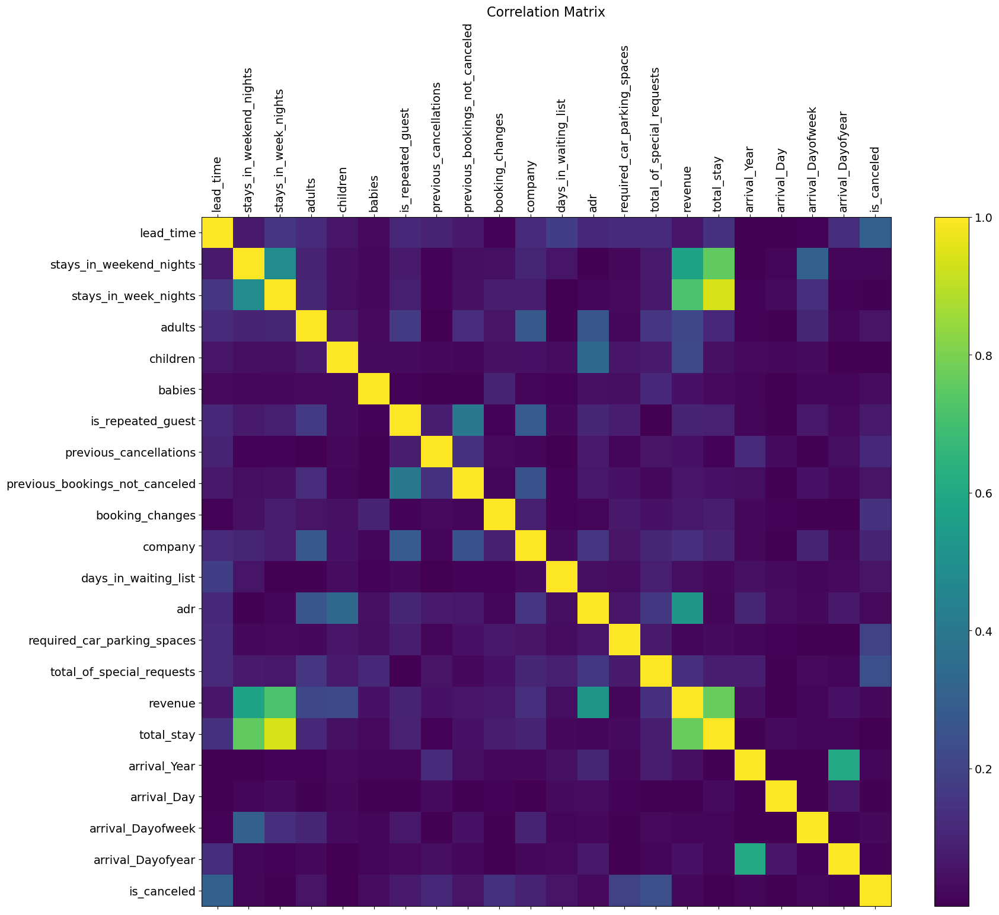

In [36]:
###################
### Correlation ###
###################

num_cols = list(X_train.select_dtypes(include=['number'], exclude=['datetime', 'timedelta']).columns)

corre_data = pd.concat([X_train[num_cols],
                        pd.DataFrame(y_train)],
                       axis = 1)

cor_matrix = corre_data.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(bool))

to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]
print(to_drop)

f = plt.figure(figsize=(19, 15))
plt.matshow(cor_matrix, fignum=f.number)
plt.xticks(range(corre_data.select_dtypes(['number']).shape[1]),
           corre_data.select_dtypes(['number']).columns, fontsize=14, rotation=90)
plt.yticks(range(corre_data.select_dtypes(['number']).shape[1]),
           corre_data.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16)
plt.show();

In [37]:
X_train = X_train.drop(to_drop, axis=1)
X_test = X_test.drop(to_drop, axis=1)
X_oot = X_oot.drop(to_drop, axis=1)

In [40]:
#####################
### MinMax scaler ###
#####################

num_cols = list(X_train.select_dtypes(include=['number'], exclude=['datetime', 'timedelta']).columns)

print(X_train[num_cols].shape)

transformer_train = MinMaxScaler().fit(X_train[num_cols])
num_data_train = pd.DataFrame(transformer_train.transform(X_train[num_cols]))
num_data_train.columns = num_cols
print(num_data_train.shape)

num_data_test = minmax_dset(X_test,num_cols) ### Test ###

num_data_oot = minmax_dset(X_oot,num_cols)   ### OOT ###



(64215, 20)
(64215, 20)
(42811, 20)
(10148, 20)


In [41]:
###################################
### High cardinality adjustment ###
###################################

cat_cols = list(X_train.select_dtypes(include=['object']))

card_vars = []
cat_data = X_train[cat_cols]
for i in range(cat_data.shape[1]):
    X_train.loc[X_train[cat_data.columns[i]].isnull(),cat_data.columns[i]] = 'Missing'
    X_test.loc[X_test[cat_data.columns[i]].isnull(),cat_data.columns[i]] = 'Missing'
    X_oot.loc[X_oot[cat_data.columns[i]].isnull(),cat_data.columns[i]] = 'Missing'

    if (len(list(set(cat_data.iloc[:,i]))) > 60): # & (len(list(set(cat_data.iloc[:,i]))) < 100):
        print(cat_data.columns[i],len(list(set(cat_data.iloc[:,i]))))

        a = pd.crosstab(cat_data[cat_data.columns[i]],columns='Count')
        a = pd.DataFrame(a).sort_values('Count',ascending=False).reset_index()
        val_list = list(a.iloc[:10,0])
        X_train.loc[~X_train[cat_data.columns[i]].isin(val_list),cat_data.columns[i]] = 'Other'
        X_test.loc[~X_test[cat_data.columns[i]].isin(val_list),cat_data.columns[i]] = 'Other'
        X_oot.loc[~X_oot[cat_data.columns[i]].isin(val_list),cat_data.columns[i]] = 'Other'

    if (len(list(set(cat_data.iloc[:,i]))) > 100):
        card_vars.append(cat_data.columns[i])

print(card_vars)

agent 252
['agent']


In [44]:
########################
### One hot encoding ###
########################

ohe = OneHotEncoder()
print(X_train.shape)
# (357127, 56)

### Train ###

ohe.fit(X_train[cat_cols])
colnames = ohe.get_feature_names_out(cat_cols)


cat_data_train = ohe_dset(X_train,cat_cols)  ### Train ###
cat_data_test = ohe_dset(X_test,cat_cols)    ### Test ###
cat_data_oot = ohe_dset(X_oot,cat_cols)      ### OOT ###

(64215, 39)
(64215, 80)
(42811, 78)
(10148, 66)


In [45]:
###########################
### Bring data together ###
###########################

print(cat_data_train.shape, num_data_train.shape)
cat_data_train = cat_data_train.reset_index()
num_data_train = num_data_train.reset_index()

X_train = pd.concat([cat_data_train,num_data_train],axis = 1)
print(X_train.shape)

print(cat_data_test.shape, num_data_test.shape)
cat_data_test = cat_data_test.reset_index()
num_data_test = num_data_test.reset_index()
X_test = pd.concat([cat_data_test,num_data_test],axis = 1)

cat_data_oot = cat_data_oot.reset_index()
num_data_oot = num_data_oot.reset_index()
X_oot = pd.concat([cat_data_oot,num_data_oot],axis = 1)
print(X_train.shape, X_test.shape, X_oot.shape)

# (64215, 105) (42811, 103) (10148, 89)

(64215, 80) (64215, 20)
(64215, 102)
(42811, 78) (42811, 20)
(64215, 102) (42811, 100) (10148, 88)


In [46]:
####################################################
### Check that train/test sets have same columns ###
####################################################

mod_cols = (list(set(list(X_train.columns)) - set(['index'])))
X_train = X_train[mod_cols]
miss_lst = list(set(list(X_train.columns)) - set(list(X_test.columns)))

for name in miss_lst:
    X_test[name] = 0
X_test = X_test[list(X_train.columns)]

drop_test_lst = list(set(list(X_test.columns)) - set(list(X_train.columns)))
X_test = X_test.drop(drop_test_lst, axis = 1)

miss_oot_lst = list(set(list(X_train.columns)) - set(list(X_oot.columns)))

for name in miss_oot_lst:
    X_oot[name] = 0
X_oot = X_oot[list(X_train.columns)]

drop_oot_lst = list(set(list(X_oot.columns)) - set(list(X_train.columns)))
X_oot = X_oot.drop(drop_oot_lst, axis = 1)


print(X_train.shape, X_test.shape, X_oot.shape)
# (64215, 105) (42811, 135) (10148, 107)

(64215, 100) (42811, 100) (10148, 100)


### Baseline models

In [59]:
############################################
### Check the accuracy on all the models ###
############################################

models = select_model(X_train, y_train)



100%|██████████| 11/11 [09:33<00:00, 52.18s/it]


In [60]:
models.head(20)

,model,run_time,accuracy
10,CatBoostClassifier,1.71,0.958724
0,AdaBoostClassifier,1.85,0.920346
1,RidgeClassifier,0.04,0.905033
2,SGDClassifier,0.12,0.901020
3,KNeighborsClassifier,1.56,0.896596
4,RandomForestClassifier,3.69,0.894323
5,DecisionTreeClassifier,0.41,0.850731
6,ExtraTreeClassifier,0.07,0.837802
7,ExtraTreesClassifier,0.07,0.835188
8,BernoulliNB,0.03,0.832666


### LGBM hyperopt

In [65]:
lgbm_search_space = {
    'num_leaves' : scope.int(hp.quniform('num_leaves', 20, 80, 10)),              
    'learning_rate': hp.loguniform('learning_rate', -7, 0),
    'feature_fraction': hp.loguniform('feature_fraction', -7, 0),
    'bagging_fraction': hp.loguniform('bagging_fraction', -7, 0),
    'max_depth': scope.int(hp.quniform('max_depth', 4, 15, 1)),
    'max_bin' : hp.randint('max_bin', 20, 90),          
    'min_data_in_leaf' : hp.randint('min_data_in_leaf', 20, 80),          
    'min_sum_hessian_in_leaf' : hp.randint('min_sum_hessian_in_leaf', 0, 100),            
    'application':hp.choice('application',['binary']),
    'metric':hp.choice('metric',['auc'])
}

algorithm = tpe.suggest

train_data = lgb.Dataset(data = X_train,
                         label = y_train,
                         free_raw_data = False)

#mlflow.set_experiment('lgbm_hyp_exp')

try:
    EXPERIMENT_ID = mlflow.create_experiment('lgbm-hyperopt')
except:
    EXPERIMENT_ID = dict(mlflow.get_experiment_by_name('lgbm-hyperopt'))['experiment_id']
    

def lgbm_objective(params):
    
    mlflow.lightgbm.autolog()

    with mlflow.start_run(experiment_id = EXPERIMENT_ID, nested = True):
        
        run = mlflow.active_run()
        print(f"Active run_id: {run.info.run_id}")

        cv_result = lgb.cv(params,
                           train_data,
                           nfold = 5,
                           seed = 6,
                           stratified = True,
                           verbose_eval = 200,
                           metrics = ['auc', 'accuracy'])
        loss = -np.mean(cv_result['auc-mean'])
        
        metric_names = ['auc']

        train_auc = round(np.mean(cv_result['auc-mean']), 4)
        training_metrics = {
            'AUC': train_auc
        }
        training_metrics_values = list(training_metrics.values())
        
        # Logging model signature, class, and name
        signature = infer_signature(X_train, y_train)
        mlflow.lightgbm.log_model(lgb, 'model', signature = signature)
        mlflow.set_tag('estimator_name', lgb.__class__.__name__)
        mlflow.set_tag('estimator_class', lgb.__class__)

        # Logging each metric
        for name, metric in list(zip(metric_names, training_metrics_values)):
            mlflow.log_metric(f'training_{name}', metric)

        return {'loss': loss, 'params': params, 'status': STATUS_OK}

trials = Trials()    

with mlflow.start_run(experiment_id = EXPERIMENT_ID, run_name = 'lgbm_models'):
    
    lgbm_best_params = fmin(
        fn = lgbm_objective,
        space = lgbm_search_space,
        algo = algorithm,
        trials=trials,
        max_evals = 200)

print(lgbm_best_params)

Active run_id: 0da1e16901974640906ff27fbeb90139        
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 450                       
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013448 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 450                       
[LightGBM] [Info] Number of data points in the train set: 5

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 91eb1ee699554c7f94ef570388835ae9                                  
  0%|          | 1/200 [00:13<43:57, 13.25s/trial, best loss: -0.840816340685147]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines  
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106           
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 754                                                 
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106           
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 754                                                 
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106    

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no mo

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there ar

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split require

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: c0223ff714b546a0884d4591d39f1884                                  
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines  
  1%|          | 2/200 [00:23<36:40, 11.11s/trial, best loss: -0.840816340685147]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106           
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 471                                                 
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106           
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 471                                                 
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106           
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead 

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: 

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 6f70efbf35534b03a3e3a8a518747eb0                                  
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines  
  2%|▏         | 3/200 [00:32<33:35, 10.23s/trial, best loss: -0.840816340685147]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106           
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634                                                 
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106           
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634                                                 
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of 

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warn

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 0b0b6b49d92944b3b2845f984e0850da                                   
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106            
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634                                                  
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106            
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019393 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634                                                  
[LightGBM] [Info] Number of data p

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: ffd55de898254f95adfec872357e139e                                   
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines   
  2%|▎         | 5/200 [00:51<31:37,  9.73s/trial, best loss: -0.8680220491514938]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106            
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 411                                                  
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106            
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 411                                                  
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 2c50c9c21bc74c2488656ffc0ba94a3f                                   
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines   
  3%|▎         | 6/200 [01:00<30:43,  9.50s/trial, best loss: -0.8680220491514938]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106            
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 749                                                  
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106            
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 749                                                  
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 18cc80ab716a41ec8cb18abc2a049606                                   
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines   
  4%|▎         | 7/200 [01:09<29:58,  9.32s/trial, best loss: -0.9185862896448753]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106            
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 700                                                  
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106            
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016492 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 700                                                  
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 5bd2645f676f4f3fbd0d0a332e5b30dd                                   
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines   
  4%|▍         | 8/200 [01:20<31:05,  9.72s/trial, best loss: -0.9185862896448753]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106            
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016075 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 500                                                  
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106            
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 500                                                  
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106            
[Ligh

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: ccd0f7927eee4af6ac325acc96cafc2f                                   
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines   
  4%|▍         | 9/200 [01:29<31:07,  9.78s/trial, best loss: -0.9185862896448753]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106            
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692                                                  
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106            
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013978 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692                                                  
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[Lig

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 587246418be14a408fb3a7989917d02c                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
  5%|▌         | 10/200 [01:42<33:53, 10.70s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 506                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 506                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
  5%|▌         | 10/200 [01:49<33:53, 10.70s/trial, best loss: -0.9398261846648654]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 8b37d65c58de4a0fbad6a874df9634a3                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
  6%|▌         | 11/200 [01:54<34:25, 10.93s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014182 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: a05c7aac22594eddbf8f3a7aeb0399f5                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
  6%|▌         | 12/200 [02:02<32:16, 10.30s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 690                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 690                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             


/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requireme

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: ec468ce51fd4400386c7a1339fb3d7b6                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
  6%|▋         | 13/200 [02:12<31:07,  9.98s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015730 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 436                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 436                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
  6%|▋         | 13/200 [02:17<31:07,  9.98s/trial, best loss: -0.9398261846648654]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: f0181b633adc48aabc93dfea52e4a955                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
  7%|▋         | 14/200 [02:22<30:52,  9.96s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013498 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 714                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012899 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 714                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warn

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warn

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf      

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 0fcc807bba6d4405b4ac6104bfeb5ac7                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
  8%|▊         | 15/200 [02:31<30:26,  9.87s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 694                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 694                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped trainin

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf      

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, b

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: c547698436cf4e36997119c166d15f2f                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
  8%|▊         | 16/200 [02:41<29:59,  9.78s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 685                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 685                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 95ecefb25b7849488d3d4d8311457645                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
  8%|▊         | 17/200 [02:51<30:09,  9.89s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015702 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 607                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 607                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
  8%|▊         | 17/200 [02:56<30:09,  9.89s/trial, best loss: -0.9398261846648654]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: e8b31b81aaa547d2aa6d6f7748522756                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
  9%|▉         | 18/200 [03:01<29:52,  9.85s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 488                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             


/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, b

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 0fbbd07bafd0487080b98f6cd3e93dfb                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 10%|▉         | 19/200 [03:10<29:08,  9.66s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 646                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 646                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             


/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: a973602675ed4e5aa98211e70934e089                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 10%|█         | 20/200 [03:20<29:31,  9.84s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016576 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 74667c764fc440ada79c41c35d92bcc3                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 10%|█         | 21/200 [03:30<29:06,  9.76s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 615                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 615                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 5453a03caf324bea9c3e6aa7a2874a9c                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 11%|█         | 22/200 [03:40<29:43, 10.02s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017846 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 729                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 729                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: cde6e47f102e4f7da0dd4505460f62c0                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 12%|█▏        | 23/200 [03:53<31:24, 10.65s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016044 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 504                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015949 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 504                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
 12%|█▏        | 23/200 [04:00<31:24, 10.65s/trial, best loss: -0.9398261846648654]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: e6c32b6d1dbf4e3294f976a1809f6330                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 12%|█▏        | 24/200 [04:04<32:17, 11.01s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 743                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016930 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 743                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: c985a0b4524349008a905dce33aae4e9                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 12%|█▎        | 25/200 [04:19<35:09, 12.05s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 556                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 556                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 567b4a42a1f242dd890d03a75ebdea2e                                    
 13%|█▎        | 26/200 [04:30<34:32, 11.91s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 528                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055214 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 528                                                   
[LightGBM] [Info] Number of d

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 2d78b65be09a49258715a40e27a56231                                    
 14%|█▎        | 27/200 [04:46<37:45, 13.09s/trial, best loss: -0.9398261846648654]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021577 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612                                                   
[LightGBM] [Info] Number of d

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 7d9f374c32fd4e2bbdd2a05a3f5ae783                                    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612                                                   
[LightGBM] [Info] Number of d

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 3a45efa191e0429d95d75649f9772b47                                    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010517 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612                                                   
[LightGBM] [Info] Number of d

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 1082f31d73b745829448ec30bcf270dd                                    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612                                                   
[LightGBM] [Info] Number of d

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 21c45ecb25b348449b4811fe82ce9651                                    
 16%|█▌        | 31/200 [05:25<28:16, 10.04s/trial, best loss: -0.9502384686827358]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 492                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95


/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no m

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warn

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 4dc01726809346f09300eb23b3585efb                                    
 16%|█▌        | 32/200 [05:36<28:11, 10.07s/trial, best loss: -0.9502384686827358]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019933 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 545                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018940 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 545                                                   
[LightGBM] [Info] Number of d

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped trainin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf      

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warn

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 36b9be3e4553443da5781aa88f153d51                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 16%|█▋        | 33/200 [05:48<29:30, 10.60s/trial, best loss: -0.9502384686827358]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017649 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 536                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 536                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 28592764d7814590a08e405a98496f64                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 17%|█▋        | 34/200 [05:56<27:46, 10.04s/trial, best loss: -0.9502384686827358]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016962 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 575                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 575                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.375010 -> initscore=-0.510784    
[LightGBM] [Info] Start training from score -0.510784                              
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 89148fbc51864b0fb53e69d061a13c8b                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 18%|█▊        | 35/200 [06:09<30:08, 10.96s/trial, best loss: -0.9502384686827358]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018412 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 624                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 624                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 07e6ead092134248b548760069337bf2                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 18%|█▊        | 36/200 [06:21<30:36, 11.20s/trial, best loss: -0.9502384686827358]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015792 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 542                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016618 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 542                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 3429ff73402a4f9c945af5b3846d116b                                    
 18%|█▊        | 37/200 [06:33<30:58, 11.40s/trial, best loss: -0.9502384686827358]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016952 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 483                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018944 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 483                                                   
[LightGBM] [Info] Number of d

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: ab8f759a39154df58de4c9325e1c7015                                    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 483                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 483                                                   
[LightGBM] [Info] Number of d

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 1ad3cf3dde52486faee63164611a9916                                    
 20%|█▉        | 39/200 [06:57<31:15, 11.65s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 677                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 677                                                   
[LightGBM] [Info] Number of d

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 2ad7160c84804a62b79625ed96d2ed88                                    
 20%|██        | 40/200 [07:09<31:25, 11.78s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 620                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 620                                                   
[LightGBM] [Info] Number of d

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: bf49b32d77524d42b0225168334d28b6                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 20%|██        | 41/200 [07:26<34:50, 13.15s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 741                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 741                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             


/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
 20%|██        | 41/200 [07:32<34:50, 13.15s/trial, best loss: -0.9518398144904111]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 2880eba289604913ac45a86a13c95b82                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 21%|██        | 42/200 [07:37<33:03, 12.55s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 388                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 388                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 6e82dec4856049c8a35c6c43a640c88a                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 22%|██▏       | 43/200 [07:46<30:14, 11.56s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 571                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 571                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             


/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
 22%|██▏       | 43/200 [07:52<30:14, 11.56s/trial, best loss: -0.9518398144904111]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: b332f1a3df3840f3beb398adc058cdb2                                    
 22%|██▏       | 44/200 [07:56<28:59, 11.15s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 719                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 719                                                   
[LightGBM] [Info] Number of d

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.375010 -> initscore=-0.510784
[LightGBM] [Info] Start training from score -0.510784                              
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf      

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 67586e9e99294b828520d377048f09eb                                    
 22%|██▎       | 45/200 [08:09<30:15, 11.72s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 454                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 454                                                   
[LightGBM] [Info] Number of d

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
 22%|██▎       | 45/200 [08:15<30:15, 11.72s/trial, best loss: -0.9518398144904111]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 966a33da303b4d0ca5f59f5ecc01716c                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 23%|██▎       | 46/200 [08:19<28:45, 11.21s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019032 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 759                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 759                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 3ea638aa7f8f4943915b96a766d33756                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 24%|██▎       | 47/200 [08:31<28:39, 11.24s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017919 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 631                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017652 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 631                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 6b63544709164b7db3da18e5552a717f                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 24%|██▍       | 48/200 [08:41<27:50, 10.99s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 605                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017048 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 605                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 51b211573f994851aa70280b6de45acd                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 24%|██▍       | 49/200 [08:51<27:20, 10.87s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 565                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 565                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 23768d8eef0d4944bce8f471758e0fd7                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 25%|██▌       | 50/200 [09:01<26:15, 10.50s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018035 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 652                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017705 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 652                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 7ff89c3ecfa04291941ab480aa404e57                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 26%|██▌       | 51/200 [09:14<27:49, 11.21s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 425                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017792 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 425                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 8f6ceb292a3746dfa3926839a11bdb97                                    
 26%|██▌       | 52/200 [09:27<29:06, 11.80s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510                                                   
[LightGBM] [Info] Number of d

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: f85e5c8bd752424a83f6b5e85dd76db9                                    


[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 589                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019583 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 589                                                   
[LightGBM] [Info] Number of data 

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 23418951e9d34f19a0795e0634d633a3                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 27%|██▋       | 54/200 [09:50<28:02, 11.52s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 520                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018094 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 520                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: ec6bc5466e1a4764b6a587708255af8f                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 28%|██▊       | 55/200 [10:01<27:34, 11.41s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016891 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 483                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 483                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: eb865f4dc4fe4e27a115e64008065a7a                                    
                                                                                   

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 583                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 583                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 321

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 1389ed075a6344e2a393dc8b0ccb148d                                    
 28%|██▊       | 57/200 [10:27<29:06, 12.21s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 479                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 479                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative:

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: c2af419874ff4539aaeaa7bc3d9b40c5                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 29%|██▉       | 58/200 [10:38<28:28, 12.03s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 591                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019914 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 591                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 52cd8435885341d2949a73ecc47afb67                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 30%|██▉       | 59/200 [10:50<28:00, 11.92s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 725                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015541 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 725                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 0fe9550401f0496595f964a614bb4c67                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 30%|███       | 60/200 [10:57<24:33, 10.52s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 659                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 659                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 0217ae10c2d748b0bbc24f1b2e8a2e68                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 30%|███       | 61/200 [11:08<24:16, 10.48s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010194 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 699                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 699                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 52830ba33e9e469f83698172662c5472                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 31%|███       | 62/200 [11:15<21:50,  9.50s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013903 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 403                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 403                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 6a9ad07266654c50876ded3f9004a606                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 32%|███▏      | 63/200 [11:22<19:53,  8.71s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 647                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017482 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 647                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 0f870090405c4fe78c75878264bf10a0                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 32%|███▏      | 64/200 [11:31<19:49,  8.75s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 463                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012013 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 463                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: e7dd65bf92f04ab9814d46c0f7ab55a0                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 32%|███▎      | 65/200 [11:40<20:13,  8.99s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 456                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 456                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 006f48bfa81845d1a0bca933635f6983                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 33%|███▎      | 66/200 [11:47<18:57,  8.49s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014957 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 721                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015765 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 721                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: cc5de00fed8142c0b7216320cbf1d298                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 34%|███▎      | 67/200 [11:54<17:31,  7.91s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014760 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 524                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014092 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 524                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: f2ecdbadba744eef84115d3d2bd758b1                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 34%|███▍      | 68/200 [12:01<16:45,  7.62s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
 34%|███▍      | 68/200 [12:04<16:45,  7.62s/trial, best loss: -0.9518398144904111]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 761d83a45ea04724a6e8bb51c225ea2b                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 34%|███▍      | 69/200 [12:09<17:02,  7.80s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015745 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 456                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 456                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
 34%|███▍      | 69/200 [12:12<17:02,  7.80s/trial, best loss: -0.9518398144904111]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: fe021007650345f3a4119dd378a266ea                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 35%|███▌      | 70/200 [12:17<16:38,  7.68s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014804 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 442                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 442                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 6c590bfc9f5c439ba48d36e3bf15df97                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 36%|███▌      | 71/200 [12:23<15:51,  7.38s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016836 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 599                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 599                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 54174ecdf61d42c2ae6af90021fc52c3                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 36%|███▌      | 72/200 [12:31<15:41,  7.35s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 00dca26e1212408d9340d8d57dc731ad                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 36%|███▋      | 73/200 [12:39<16:14,  7.68s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 663                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 663                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: f2e765b57b44454fb6edf086ab917520                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 37%|███▋      | 74/200 [12:47<16:07,  7.68s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 736                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 736                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 49d5c4bc933f4974a9b76727bd592d30                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 38%|███▊      | 75/200 [12:54<15:57,  7.66s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015709 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 672                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 672                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
 38%|███▊      | 75/200 [13:00<15:57,  7.66s/trial, best loss: -0.9518398144904111]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: b59ddcef395540d7b5b601c6d6314ad4                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 38%|███▊      | 76/200 [13:05<17:33,  8.50s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014830 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 558                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 558                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: e9bac95bbc2f4d17be2f65d5239062b2                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 38%|███▊      | 77/200 [13:13<17:32,  8.56s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 395                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 395                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 3dc8d88f8e024533975054336cf71ab9                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 39%|███▉      | 78/200 [13:21<16:42,  8.22s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014572 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 707                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 707                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 4a6ee02c17d84475a9a793158d86fce6                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 40%|███▉      | 79/200 [13:32<18:19,  9.09s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 421                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013624 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 421                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 9180a294d7c3469e9f7c2482f6b9fd89                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 40%|████      | 80/200 [13:41<18:02,  9.02s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 752                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 752                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: f0ef84cea0cd4d4aa0a941d6bba4e2ad                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 40%|████      | 81/200 [13:48<17:00,  8.58s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 684                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013997 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 684                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 8ef1a9b761404fa38a46784c6656ab82                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 41%|████      | 82/200 [13:55<15:52,  8.07s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014872 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 473                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 473                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             


/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped trainin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requireme

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: bc33b4d41b58429f92ea43c257b40b69                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 42%|████▏     | 83/200 [14:04<16:22,  8.39s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014921 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 747                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 747                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
 42%|████▏     | 83/200 [14:10<16:22,  8.39s/trial, best loss: -0.9518398144904111]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 783bd154ebd44e97abe57c57a64bc5a2                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 42%|████▏     | 84/200 [14:14<16:53,  8.74s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015084 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 450                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 450                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             


/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 69b7f2f374964ebab85833dfcf38fda9                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 42%|████▎     | 85/200 [14:23<16:54,  8.82s/trial, best loss: -0.9518398144904111]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 636                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013816 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 636                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
 42%|████▎     | 85/200 [14:27<16:54,  8.82s/trial, best loss: -0.9518398144

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 871742e7e9224dde8991dee9f048b3f4                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 43%|████▎     | 86/200 [14:31<16:32,  8.70s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013696 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 617                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016194 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 617                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 246ef80eecf3422ab83c6d5f992e89f3                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 44%|████▎     | 87/200 [14:39<15:45,  8.37s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: d8dac58e5e814dd588d786a91e8be03b                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 44%|████▍     | 88/200 [14:48<15:51,  8.50s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 77595e00232e442b8575b2bcd10ff016                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 44%|████▍     | 89/200 [14:57<16:08,  8.72s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013978 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 502                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 502                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
 44%|████▍     | 89/200 [14:59<16:08,  8.72s/trial, best loss: -0.9525009520947735]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 771db53f5b424e1f9c0dae0d868ee3fa                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 45%|████▌     | 90/200 [15:04<14:46,  8.06s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013381 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 714                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 714                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 1931ccc1a5ad47ffa725a639f9dbcb1e                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 46%|████▌     | 91/200 [15:11<14:10,  7.81s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 632                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 632                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
 46%|████▌     | 91/200 [15:14<14:10,  7.81s/trial, best loss: -0.9525009520947735]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: df8bf71fbcc24088acdf318e90d8a1b9                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 46%|████▌     | 92/200 [15:18<13:45,  7.65s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 644                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 644                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: abc70f0c4b0b4f448c9b7b4f691550b6                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 46%|████▋     | 93/200 [15:27<14:15,  7.99s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 700                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 700                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 1ffe08f0a2b647fba73629191f34c3e7                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 47%|████▋     | 94/200 [15:34<13:35,  7.70s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 411                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013630 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 411                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 059faf443bfc4902bab7d862c1bf3a83                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 48%|████▊     | 95/200 [15:41<13:17,  7.59s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 485                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 485                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requireme

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
 48%|████▊     | 95/200 [15:47<13:17,  7.59s/trial, best loss: -0.9525009520947735]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 722512108a3a4bc5bb50512d1a4b47e9                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 48%|████▊     | 96/200 [15:51<14:17,  8.24s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014588 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: bb474c3ac6654e0fac1bed5a0349f0d5                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 48%|████▊     | 97/200 [16:02<15:40,  9.13s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 605                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 605                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 2baf7122638a42b4a32398509a6a2435                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 49%|████▉     | 98/200 [16:12<15:49,  9.31s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 549                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 549                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf      

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: aa4c2093e01649889dde9e49634c0333                                    
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines    
 50%|████▉     | 99/200 [16:21<15:36,  9.27s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 434                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106             
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 434                                                   
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Nu

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf  

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: ac903997b1fa4737b58b0d8e30416273                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 50%|█████     | 100/200 [16:30<15:30,  9.30s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 685                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 685                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 50%|█████     | 100/200 [16:33<15:30,  9.30s/trial, best loss: -0.9525009520947735]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 48ff53f10fdd48baa892376c04face6b                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 50%|█████     | 101/200 [16:38<14:18,  8.67s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 28d01efe68f14fa899f61d9d1e0d7f03                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 51%|█████     | 102/200 [16:45<13:18,  8.15s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010182 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 731                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014979 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 731                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 51%|█████     | 102/200 [16:49<13:18,  8.15s/trial, best loss: -0.9525009520947735]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 25a224cde0cb4f52a84a3f73d0e0e326                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 52%|█████▏    | 103/200 [16:53<13:20,  8.25s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 454                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 454                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 20133902a3464e71aca0023c2993c495                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 52%|█████▏    | 104/200 [17:02<13:41,  8.56s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 530                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015915 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 530                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: ed014ddad2b44b3aa6eccacc5fa777f0                                     
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 530                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014045 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 530                                                    
[LightGBM] [Info] Number

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 09c3cacab18b4d0cb893f16ac53d750f                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 53%|█████▎    | 106/200 [17:23<14:43,  9.40s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: e96c419a895b44978f48156f5bf96266                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 54%|█████▎    | 107/200 [17:33<14:34,  9.41s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015084 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 530                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 530                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: e7426b32a7044b2b8bde1d80f5c8cf86                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 54%|█████▍    | 108/200 [17:40<13:35,  8.86s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 556                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 556                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 54%|█████▍    | 108/200 [17:45<13:35,  8.86s/trial, best loss: -0.9525009520947735]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 32db52650bb84f9ca90f8663a4673bc9                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 55%|█████▍    | 109/200 [17:49<13:30,  8.90s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 745                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 745                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 55%|█████▍    | 109/200 [17:53<13:30,  8.90s/trial, best loss: -0.9525009520947735]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 60a6d96511274e6c856da000f7aa3caf                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 55%|█████▌    | 110/200 [17:58<13:12,  8.80s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 538                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017427 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 538                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 3d90df26cff74a5a85ea783cf3f1d9ad                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 56%|█████▌    | 111/200 [18:07<13:10,  8.88s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 675                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013495 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 675                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 18b44493d1c1407e881fcbc73b43045c                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 56%|█████▌    | 112/200 [18:15<12:48,  8.73s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 624                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 624                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 819fa12647234093ad845b68f2c32864                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 56%|█████▋    | 113/200 [18:25<13:14,  9.14s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 577                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 577                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 37e973328f034b79aa0993d86a0b2af3                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 57%|█████▋    | 114/200 [18:34<12:56,  9.03s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 544                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 544                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 3d4c2c3369a94d848189e96198d500ed                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 57%|█████▊    | 115/200 [18:43<12:52,  9.08s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: c3300d1230ce4c1b86a84cddaa248823                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 58%|█████▊    | 116/200 [18:52<12:42,  9.07s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 690                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 690                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 7846fe23286546b7a8fddf752b19e698                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 58%|█████▊    | 117/200 [19:00<11:52,  8.59s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 739                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 739                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: cb3ee6d065ec4a4fae36213e31166366                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 59%|█████▉    | 118/200 [19:10<12:18,  9.00s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013455 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 622                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 622                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 59%|█████▉    | 118/200 [19:15<12:18,  9.00s/trial, best loss: -0.9525009520947735]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 2a4daf2779684fc9bfa8f74b998cd30a                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 60%|█████▉    | 119/200 [19:20<12:31,  9.28s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 571                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012789 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 571                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 60%|█████▉    | 119/200 [19:26<12:31,  9.28s/trial, best loss: -0.9525009520947735]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 980d0c44b76a48e4afc9bbc8a367d2ef                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 60%|██████    | 120/200 [19:30<12:47,  9.59s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014877 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 388                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 388                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: a79551db531745dab89f5b4e4a6bf9b7                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 60%|██████    | 121/200 [19:40<12:52,  9.77s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 607                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016441 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 607                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 60%|██████    | 121/200 [19:44<12:52,  9.77s/trial, best loss: -0.9525009520947735]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 56830130ee0e4c028c2abb82a3902bcf                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 61%|██████    | 122/200 [19:48<11:54,  9.16s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 425                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 425                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 1c6e60ff0e974a85ad30f4d2b1aab811                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 62%|██████▏   | 123/200 [19:57<11:52,  9.25s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012940 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 50310de45ee24fff932aed96d5c57a64                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 62%|██████▏   | 124/200 [20:05<10:58,  8.67s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 516                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 516                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: bc6be6a16cd744c596929de5eba26373                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 62%|██████▎   | 125/200 [20:15<11:36,  9.29s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 483                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013903 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 483                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 5c7220b28598468eb10eb7fe579099b2                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 63%|██████▎   | 126/200 [20:25<11:28,  9.30s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 03829256c63a49568fe315c42ed5fc08                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 64%|██████▎   | 127/200 [20:34<11:17,  9.28s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 632                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 632                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 09ad2f23eee2450abb6e4ec8c74d6eaf                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 64%|██████▍   | 128/200 [20:42<10:33,  8.80s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 759                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034054 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 759                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: a5c67eee007a4dc99bb51908fd554b10                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 64%|██████▍   | 129/200 [20:51<10:30,  8.88s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 512                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 512                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: b2b2f7cd4e1247d4a53a290bd0d71687                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 65%|██████▌   | 130/200 [21:01<10:55,  9.36s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 652                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 652                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 24a07f4e997b493daf888b309fd2a037                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 66%|██████▌   | 131/200 [21:10<10:40,  9.28s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 475                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 475                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: abb596057f1e4a7b91412ae6f99f4653                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 66%|██████▌   | 132/200 [21:19<10:26,  9.21s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 699                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014052 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 699                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split re

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 67ce76aee0e0438897552c3afb85a2c7                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 66%|██████▋   | 133/200 [21:28<10:12,  9.14s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013789 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 565                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015820 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 565                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: ab66de75d1af4cc7a17db7be19594af6                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 67%|██████▋   | 134/200 [21:40<10:51,  9.87s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 581                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016031 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 581                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: f2add58d56204d4583e7735189c5db29                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 68%|██████▊   | 135/200 [21:51<11:02, 10.19s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 68%|██████▊   | 135/200 [21:55<11:02, 10.19s/trial, best loss: -0.9525009520947735]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: f1b30a45fb22492298c07e955fa207b2                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 68%|██████▊   | 136/200 [21:59<10:18,  9.66s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 593                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 593                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 9b0cc11bf852450a86a51a51b7a25b86                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 68%|██████▊   | 137/200 [22:07<09:32,  9.08s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 721                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 721                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: e3345d34a7e447819840b5da2a967a20                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 69%|██████▉   | 138/200 [22:18<09:55,  9.61s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 725                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 725                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 69%|██████▉   | 138/200 [22:23<09:55,  9.61s/trial, best loss: -0.9525009520947735]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 7e2d63d9dcbc45e8b9ba7b67c6aa8813                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 70%|██████▉   | 139/200 [22:27<09:38,  9.48s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 530                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 530                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: ebafa172d98c483d84bba94839a32c3f                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 70%|███████   | 140/200 [22:37<09:32,  9.55s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 463                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 463                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 5c79feba2d27418b9f7daae7156ba77f                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 70%|███████   | 141/200 [22:47<09:32,  9.71s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 661                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 661                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGB

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive ga

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 8be1032cd1ae48b18a8a0c382abe685e                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 71%|███████   | 142/200 [22:56<09:13,  9.54s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 661                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 661                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 9623b66d8c38443eb51d592af17beb9a                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 72%|███████▏  | 143/200 [23:09<10:02, 10.56s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 649                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014961 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 649                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: cc791f3570114c139c46eb2a1701b133                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 72%|███████▏  | 144/200 [23:19<09:35, 10.27s/trial, best loss: -0.9525009520947735]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: dd809c5394fd437c8763999f039dd37e                                     
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016943 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: c2004048430a45ccbda360a69f2d2228                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 73%|███████▎  | 146/200 [23:36<08:27,  9.40s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 526                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 526                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 9538408748a0417b98b0c0ac32ec6cf7                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 74%|███████▎  | 147/200 [23:46<08:31,  9.65s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017459 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.375010 -> initscore=-0.510784     
[LightGBM] [Info] Start training from score -0.510784                               
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 19e3bb0201b5485dacdf5959876ad6e0                                     
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 73646ab6993547e2b404f602991501e6                                     
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 74%|███████▍  | 149/200 [24:14<09:11, 10.81s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 24dfa7fb14ce43c1a020c0828cf9ca6c                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 75%|███████▌  | 150/200 [24:19<08:35, 10.32s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 405                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017622 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 405                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: e9514426a49f48a994b4d148f1c7d932                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 76%|███████▌  | 151/200 [24:26<07:49,  9.59s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016690 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 76%|███████▌  | 151/200 [24:35<07:49,  9.59s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 83e71c6d44664c7d9d1a5e56f227971f                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 76%|███████▌  | 152/200 [24:39<08:30, 10.64s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014814 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 601                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012454 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 601                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: ecae606aba9d4c82921409a2d4bdd6fa                                     
 76%|███████▋  | 153/200 [24:52<08:52, 11.33s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023056 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 76%|███████▋  | 153/200 [24:59<08:52, 11.33s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 9911881c1ffe4e09892dfdadbab7a60c                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 77%|███████▋  | 154/200 [25:04<08:41, 11.34s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Reducing `min_data_in_leaf` with `feature_pre_filter=true` may cause unexpected behaviour for features that were pre-filtered by the larger `min_data_in_leaf`.
You need to set `feature_pre_filter=false` to dynamically change the `min_data_in_leaf`.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011081 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 6ca52da0e0b84a62ae9ff9ca340bbd07                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 78%|███████▊  | 155/200 [25:15<08:29, 11.32s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 442                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014796 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 442                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 04a00650675442749a01dbc79852514b                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 78%|███████▊  | 156/200 [25:23<07:31, 10.26s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 395                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 395                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 00e6c1a967cf47a8972ec0a83954b47a                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 78%|███████▊  | 157/200 [25:33<07:24, 10.34s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 738                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 738                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 308d1d2969cd4d21b6f9d9376e51e3b4                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 79%|███████▉  | 158/200 [25:42<06:58,  9.96s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013006 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013911 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 79%|███████▉  | 158/200 [25:46<06:58,  9.96s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 41322c55b0a34f238c1482d7c8bab951                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 80%|███████▉  | 159/200 [25:50<06:22,  9.33s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 707                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013483 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 707                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: df3dbb2c62ce4dd2adb496730eccd492                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 80%|████████  | 160/200 [25:58<05:55,  8.89s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 29e0deeae6c54b27a6698f326d1fb0ff                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 80%|████████  | 161/200 [26:08<05:55,  9.12s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 672                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 672                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 81f42cd211d449b28337a67db02ae9fa                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 81%|████████  | 162/200 [26:17<05:50,  9.23s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: db3758e8bd064327beac1d88a49249f8                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 82%|████████▏ | 163/200 [26:28<05:55,  9.61s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 502                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014930 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 502                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: f14f6893ee1e4cdc9075206ada10f483                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 82%|████████▏ | 164/200 [26:37<05:44,  9.57s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014534 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 450                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014058 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 450                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 82%|████████▏ | 164/200 [26:44<05:44,  9.57s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 08d7832508bb46078b04205fef488422                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 82%|████████▎ | 165/200 [26:49<05:56, 10.19s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 680                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.038930 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 680                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: ddf9e5ff6b0f441cab324020f597408d                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 83%|████████▎ | 166/200 [27:01<06:06, 10.77s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 747                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 747                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 43532af2d8d8463b87ef1c5fd0c54c7b                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 84%|████████▎ | 167/200 [27:12<05:56, 10.82s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015501 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 469                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 469                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stoppe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No fur

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: fdbb5aa3b54e4622a34f391d7a3f10c8                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 84%|████████▍ | 168/200 [27:21<05:31, 10.35s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 421                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 421                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 84%|████████▍ | 168/200 [27:25<05:31, 10.35s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 5036a302298e4d7eaf1fccf84dfa8c0c                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 84%|████████▍ | 169/200 [27:29<04:58,  9.64s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010509 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 85bdcdbae24c4b80a39ec1308ab86652                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 85%|████████▌ | 170/200 [27:41<05:08, 10.28s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 609                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 609                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: b94dccf7ae634ae4aa8e3a2e6c6663e6                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 86%|████████▌ | 171/200 [27:50<04:46,  9.88s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 756                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013318 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 756                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 97a7ff4e3264487095e51bb85b306bd3                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 86%|████████▌ | 172/200 [28:02<04:55, 10.55s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 712                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 712                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 86%|████████▌ | 172/200 [28:08<04:55, 10.55s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 6806d60a4a184a22bdbe76dfa91a9b40                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 86%|████████▋ | 173/200 [28:12<04:44, 10.52s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 615                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 615                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: a7c14d5d3c3d4a11ae6a36c545318f40                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 87%|████████▋ | 174/200 [28:21<04:20, 10.03s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 646                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 646                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 3f75ba0e1c734e37856b796690a49aa4                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 88%|████████▊ | 175/200 [28:30<03:59,  9.59s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 702                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 702                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: c120f6c6cb1f4eb1901cf899743d3aca                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 88%|████████▊ | 176/200 [28:39<03:48,  9.51s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032785 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 608                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014797 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 608                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 2c86f81d60a347ea96cd4a69e43916db                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 88%|████████▊ | 177/200 [28:50<03:49,  9.97s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 411                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 411                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 58368a06df124a8997b90c63e7e2e484                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 89%|████████▉ | 178/200 [28:59<03:31,  9.60s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 6de16e5ee33740f8b1340dda4bda411d                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 90%|████████▉ | 179/200 [29:08<03:20,  9.56s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015018 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 607                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014200 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 607                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves tha

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 950f200fb5a9460985d1d2acfed9056e                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 90%|█████████ | 180/200 [29:20<03:22, 10.13s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014142 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 436                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 436                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 90%|█████████ | 180/200 [29:24<03:22, 10.13s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: e886265d624544968c2b9c06bae165da                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 90%|█████████ | 181/200 [29:29<03:04,  9.73s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106          

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 0f44e796ebc74354959d9634e1066656                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 91%|█████████ | 182/200 [29:44<03:23, 11.30s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016032 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 747                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014789 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 747                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 1dfb26aeb56741289e5ec5606a69931e                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 92%|█████████▏| 183/200 [29:55<03:14, 11.43s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016435 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 8b21f9f0333844669cbc949b78b6f3a4                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 92%|█████████▏| 184/200 [30:07<03:03, 11.47s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015886 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013510 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 25347690b6334af4a5508d13f97332d7                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 92%|█████████▎| 185/200 [30:18<02:51, 11.41s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 622                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 622                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 11e31a53cefe44f7a5b0f74c0baee965                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 93%|█████████▎| 186/200 [30:30<02:42, 11.61s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 552                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 552                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 93%|█████████▎| 186/200 [30:35<02:42, 11.61s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: cce40b74696a48248980ba4fb90dbe62                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 94%|█████████▎| 187/200 [30:40<02:22, 10.97s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 731                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015998 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 731                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.375010 -> initscore=-0.510784     
[LightGBM] [Info] Start training from score -0.510784                               
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 94%|█████████▎| 187/200 [30:49<02:22, 10.97s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: b04f8f78393d40b9a7c0cb5f09976466                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 94%|█████████▍| 188/200 [30:54<02:21, 11.82s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015482 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 496                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 496                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 85dc091dd5434581a2e2e9a20f02e4d4                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 94%|█████████▍| 189/200 [31:06<02:11, 11.92s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 741                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 741                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 94%|█████████▍| 189/200 [31:12<02:11, 11.92s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 39d3292366b24afca708a980542c9f95                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 95%|█████████▌| 190/200 [31:16<01:55, 11.51s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015110 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014067 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: de0d5ee96a1148c28e532147d2d2e039                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 96%|█████████▌| 191/200 [31:26<01:39, 11.08s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012940 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 687                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013471 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 687                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.375010 -> initscore=-0.510784     
[LightGBM] [Info] Start training from score -0.510784                               
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.375010 -> initscore=-0.510784     
[LightGBM] [Info] Start training from score -0.510784                               
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: db16f259a2da40248271c02b725f036c                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 96%|█████████▌| 192/200 [31:38<01:30, 11.28s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 388                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 388                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 96%|█████████▌| 192/200 [31:46<01:30, 11.28s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: d8d1ee39676a42d5ac2deedfb84f7bf7                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 96%|█████████▋| 193/200 [31:51<01:22, 11.72s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 534                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018053 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 534                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: 052a3907f4fb40cab1de4a3d0d9fabc5                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 97%|█████████▋| 194/200 [31:59<01:03, 10.63s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 545                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015413 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 545                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 97%|█████████▋| 194/200 [32:02<01:03, 10.63s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: fda752f90fe5402f9417aadbd30ec3ba                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 98%|█████████▊| 195/200 [32:07<00:49,  9.87s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011754 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 636                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013701 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 636                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: b54923446c1c499fa9f6d977cb91e04c                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 98%|█████████▊| 196/200 [32:18<00:40, 10.08s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 605                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013754 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 605                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 96
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have

Active run_id: 3671450fbbf64a939e70b28ba2fae910                                     
 98%|█████████▊| 197/200 [32:27<00:29,  9.96s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 577                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 97
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 577                                                    
[LightGBM] [Info] Number

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
 98%|█████████▊| 197/200 [32:35<00:29,  9.96s/trial, best loss: -0.9538841487530907]

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: bb7d16ef1f6448d09900c4b333c34e2c                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
 99%|█████████▉| 198/200 [32:40<00:21, 10.64s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 540                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017952 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 540                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



Active run_id: a5438121d2964dc1b8a29e2ce0899ef9                                     
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines     
100%|█████████▉| 199/200 [32:51<00:10, 10.83s/trial, best loss: -0.9538841487530907]

[LightGBM] [Fatal] Cannot change max_bin after constructed Dataset handle.


[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 675                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info] Number of positive: 19266, number of negative: 32106              
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 675                                                    
[LightGBM] [Info] Number of data points in the train set: 51372, number of used features: 95
[LightGBM] [Info

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/lightgbm/engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf          
[LightGBM] [Warning] No further splits with positive gain, best g

/Users/keithlowton/anaconda3/envs/Binary_classifier/lib/python3.10/site-packages/mlflow/models/signature.py:215: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None



100%|██████████| 200/200 [32:59<00:00,  9.90s/trial, best loss: -0.9538841487530907]
{'application': 0, 'bagging_fraction': 0.0030458541505359506, 'feature_fraction': 0.8315711386893594, 'learning_rate': 0.13016527258210356, 'max_bin': 64, 'max_depth': 12.0, 'metric': 0, 'min_data_in_leaf': 36, 'min_sum_hessian_in_leaf': 6, 'num_leaves': 70.0}


In [66]:
space_eval(lgbm_search_space, lgbm_best_params)

{'application': 'binary',
 'bagging_fraction': 0.0030458541505359506,
 'feature_fraction': 0.8315711386893594,
 'learning_rate': 0.13016527258210356,
 'max_bin': 64,
 'max_depth': 12,
 'metric': 'auc',
 'min_data_in_leaf': 36,
 'min_sum_hessian_in_leaf': 6,
 'num_leaves': 70}

In [68]:
lgbm_bo = lgb.LGBMClassifier(seed = 0, 
                              application = space_eval(lgbm_search_space, lgbm_best_params)['application'], 
                              bagging_fraction = space_eval(lgbm_search_space, lgbm_best_params)['bagging_fraction'], 
                              feature_fraction = space_eval(lgbm_search_space, lgbm_best_params)['feature_fraction'], 
                              learning_rate = space_eval(lgbm_search_space, lgbm_best_params)['learning_rate'], 
                              max_bin = space_eval(lgbm_search_space, lgbm_best_params)['max_bin'], 
                              max_depth = space_eval(lgbm_search_space, lgbm_best_params)['max_depth'], 
                              min_data_in_leaf = space_eval(lgbm_search_space, lgbm_best_params)['min_data_in_leaf'],
                              min_sum_hessian_in_leaf = space_eval(lgbm_search_space, lgbm_best_params)['min_sum_hessian_in_leaf'],                           
                              num_leaves = space_eval(lgbm_search_space, lgbm_best_params)['num_leaves']).fit(X_train, y_train)

2023/09/22 15:47:28 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'a9e471ae9d14444e8e1e46674141631c', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current lightgbm workflow


[LightGBM] [Warning] min_sum_hessian_in_leaf is set=6, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=6
[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Warning] feature_fraction is set=0.8315711386893594, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8315711386893594
[LightGBM] [Warning] bagging_fraction is set=0.0030458541505359506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.0030458541505359506


In [69]:
lgbm_hyp_res, lgbm_hyp_threshold = train_diag(lgbm_bo, X_train_mod, y_train, n_splits, 'LGBM_hyp_optimized')

NameError: name 'train_diag' is not defined

### XGB hyperopt

In [ ]:
xgb_search_space = {
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'max_depth': scope.int(hp.quniform('max_depth', 4, 15, 1)),
    'subsample': hp.uniform('subsample', .5, 1.0),
    'learning_rate': hp.loguniform('learning_rate', -7, 0),
    'min_child_weight': hp.loguniform('min_child_weight', -1, 7),
    'reg_alpha': hp.loguniform('reg_alpha', -10, 10),
    'reg_lambda': hp.loguniform('reg_lambda', -10, 10),
    'gamma': hp.loguniform('gamma', -10, 10),
    'use_label_encoder': False,
    'verbosity': 0,
    'random_state': 42
}

try:
    EXPERIMENT_ID = mlflow.create_experiment('xgb-hyperopt')
except:
    EXPERIMENT_ID = dict(mlflow.get_experiment_by_name('xgb-hyperopt'))['experiment_id']

def xgb_objective(params):
    
    mlflow.xgboost.autolog()

    with mlflow.start_run(experiment_id = EXPERIMENT_ID, nested = True):
        
        run = mlflow.active_run()
        print(f"Active run_id: {run.info.run_id}")

        kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=0)
    
        model = xgb.XGBClassifier(**params)
        model = model.fit(X_train, y_train)
        score = cross_val_score(estimator = model, 
                                X = X_train_mod, 
                                y = y_train, 
                                cv = kfold, 
                                scoring = 'roc_auc', 
                                n_jobs = -1).mean()
        loss = -score
        
        metric_names = ['auc']

        train_auc = round(-score, 4)
        training_metrics = {
            'AUC': train_auc
        }
        training_metrics_values = list(training_metrics.values())
        
        # Logging model signature, class, and name
        signature = infer_signature(X_train, y_train)
        mlflow.xgboost.log_model(model, 'model', signature = signature)
        mlflow.set_tag('estimator_name', model.__class__.__name__)
        mlflow.set_tag('estimator_class', model.__class__)

        # Logging each metric
        for name, metric in list(zip(metric_names, training_metrics_values)):
            mlflow.log_metric(f'training_{name}', metric)

        return {'loss': loss, 'params': params, 'status': STATUS_OK}
    
trials = Trials()    

with mlflow.start_run(experiment_id = EXPERIMENT_ID, run_name = 'xgboost_models'):
    
    xgboost_best_params = fmin(
        fn = xgb_objective, 
        space = xgb_search_space, 
        algo = tpe.suggest,
        trials = trials,
        max_evals = 50
    )

print(xgboost_best_params)
print(space_eval(xgb_search_space, xgboost_best_params))    

In [ ]:
xgboost_bo = XGBClassifier(seed = 0, 
                           eval_metric = space_eval(xgb_search_space, xgboost_best_params)['eval_metric'], 
                           gamma = space_eval(xgb_search_space, xgboost_best_params)['gamma'], 
                           learning_rate = space_eval(xgb_search_space, xgboost_best_params)['learning_rate'], 
                           max_depth = space_eval(xgb_search_space, xgboost_best_params)['max_depth'], 
                           min_child_weight = space_eval(xgb_search_space, xgboost_best_params)['min_child_weight'], 
                           objective = space_eval(xgb_search_space, xgboost_best_params)['objective'], 
                           reg_alpha = space_eval(xgb_search_space, xgboost_best_params)['reg_alpha'],
                           reg_lambda = space_eval(xgb_search_space, xgboost_best_params)['reg_lambda'],                           
                           subsample = space_eval(xgb_search_space, xgboost_best_params)['subsample']).fit(X_train_mod, y_train)

In [ ]:
xgb_hyp_res, xgb_hyp_threshold = train_diag(xgboost_bo, X_train_mod, y_train, n_splits, 'XGB_hyp_optimized')

### Models

In [ ]:
n_splits = 10

cv = StratifiedKFold(n_splits = n_splits,
                     shuffle = True,
                     random_state = 31416)

### AdaBoost hyperparameter

In [ ]:
ada_mod = AdaBoostClassifier(random_state = 42)
    
param_grid_ada = {
    'n_estimators' : [10, 20, 50, 250, 1000],
    'learning_rate' : [0.01, 0.05, 0.1]
}

ada_mod_search = model_hyp_para(ada_mod, param_grid_ada, X_train, y_train)

In [ ]:
ada_mod_search = AdaBoostClassifier(random_state = 42,
                                    n_estimators = 1000,
                                    learning_rate = 0.1)

In [ ]:
ada_res, ada_threshold = train_diag(ada_mod_search, X_train_mod, y_train, n_splits, 'AdaBoost_optimized')

In [91]:
# explain the model's predictions using SHAP
explainer = shap.TreeExplainer(cboost_model_hy)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation 
shap.initjs()


In [92]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:])

In [ ]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, X_train)

shap.plots.force is slow for many thousands of rows, try subsampling your data.


In [ ]:
shap_values = shap.TreeExplainer(cboost_model_hy).shap_values(X_train)
shap.summary_plot(shap_values, X_train, plot_type="bar")

In [ ]:
shap.summary_plot(shap_values, X_train)